# Comprendre la SVD

Cinq experiences sur une matrice `A` de 5 signaux (une ligne = un signal,
`A` est `(5, N)`), avec a chaque fois les memes figures :

1. les 5 signaux ;
2. `A A^T` (5x5, produits scalaires entre signaux) et `A^T A` (NxN, entre
   instants) ;
3. les deux matrices singulieres `U` (5x5) et `V` (Nx5), et les valeurs
   singulieres ;
4. la **frequence instantanee** de chaque vecteur singulier temporel (phase du
   signal analytique de Hilbert, derivee en Hz), superposee a celle des signaux
   de depart.

`A = U S V^T` : les valeurs singulieres au carre sont les valeurs propres
**communes** a `A A^T` et `A^T A`, `U` porte les vecteurs propres de `A A^T`
(cote signaux), `V` ceux de `A^T A` (cote temps).

# Section 1 -- cinq familles de sinusoides

## Cellule 0 -- parametres communs et fonction d'affichage

In [116]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.signal import hilbert

# --- Parametres communs aux trois cellules ---------------------------------
F0 = 1.0                      # Hz
N_CYCLES = 30                 # 30 cycles de f0
N_PER_CYCLE = 40              # echantillons par cycle de f0
N = N_CYCLES * N_PER_CYCLE    # = 1200 echantillons
DUREE = N_CYCLES / F0         # s
t = np.arange(N) / (F0 * N_PER_CYCLE)
PHASES = np.array([np.pi/7, np.pi / 3, np.pi / 4, 3 * np.pi / 4, np.pi])
LABELS = ["0", "pi/3", "pi/2", "3pi/4", "pi"]


BORD = int(0.05 * N)   # bords ecartes : la transformee de Hilbert y derape


def frequence_instantanee(v, temps=None):
    """Frequence instantanee d'un signal, en Hz (derivee de la phase analytique).

    `temps` : grille temporelle du signal ; celle de la section 1 par defaut.
    """
    temps = t if temps is None else temps
    phase = np.unwrap(np.angle(hilbert(v - v.mean())))
    return np.gradient(phase, temps) / (2 * np.pi)


def figures_svd(A, titre, labels=LABELS, f_ref=None):
    # Les quatre figures decrites en tete de notebook, pour une matrice A (5, N).
    # `f_ref` : frequence instantanee attendue des signaux (scalaire ou (N,)),
    # tracee en pointilles sur la 4e figure. None pour ne rien superposer.
    U, S, Vt = np.linalg.svd(A, full_matrices=False)
    G_sig = A @ A.T          # (5, 5)   : entre signaux
    G_tps = A.T @ A          # (N, N)   : entre instants

    print(f"{titre}")
    print(f"  A : {A.shape}   rang numerique = {np.linalg.matrix_rank(A)}")
    print(f"  valeurs singulieres : {np.array2string(S, precision=3, suppress_small=False)}")
    print(f"  part d'energie      : {np.array2string(S**2 / (S**2).sum(), precision=4)}")

    # --- 1. les signaux ---
    fig, ax = plt.subplots(figsize=(12, 3.2))
    for i in range(A.shape[0]):
        ax.plot(t, A[i] - 2.5 * i, lw=0.9, label=labels[i])
    ax.set_yticks(-2.5 * np.arange(A.shape[0]), labels)
    ax.set_xlabel("temps (s)")
    ax.set_xlim(0, 5 / F0)
    ax.set_title(f"{titre} -- les 5 signaux (5 premieres periodes de f0)", fontsize=11)
    fig.tight_layout()
    plt.show()

    # --- 2. A A^T et A^T A ---
    fig, axes = plt.subplots(1, 2, figsize=(12, 4.6))
    v = np.abs(G_sig).max()
    im = axes[0].imshow(G_sig, cmap="RdBu_r", vmin=-v, vmax=v)
    axes[0].set_xticks(range(5), labels)
    axes[0].set_yticks(range(5), labels)
    axes[0].set_title("A A^T  (5x5, entre signaux)", fontsize=11)
    for i in range(5):
        for j in range(5):
            axes[0].text(j, i, f"{G_sig[i, j]:.0f}", ha="center", va="center", fontsize=7)
    fig.colorbar(im, ax=axes[0], fraction=0.046)

    v = np.abs(G_tps).max()
    im = axes[1].imshow(G_tps, cmap="RdBu_r", vmin=-v, vmax=v,
                        extent=[0, DUREE, DUREE, 0])
    axes[1].set_xlabel("temps (s)"); axes[1].set_ylabel("temps (s)")
    axes[1].set_title(f"A^T A  ({N}x{N}, entre instants)", fontsize=11)
    fig.colorbar(im, ax=axes[1], fraction=0.046)
    fig.tight_layout()
    plt.show()

    # --- 3. U, V et les valeurs singulieres ---
    fig, axes = plt.subplots(1, 3, figsize=(14, 4.0))
    v = np.abs(U).max()
    im = axes[0].imshow(U, cmap="RdBu_r", vmin=-v, vmax=v)
    axes[0].set_yticks(range(5), labels)
    axes[0].set_xticks(range(len(S)), [f"u{k}" for k in range(len(S))])
    axes[0].set_ylabel("signal (phase)")
    axes[0].set_title("U (5x5) -- poids de chaque signal", fontsize=11)
    for i in range(U.shape[0]):
        for j in range(U.shape[1]):
            axes[0].text(j, i, f"{U[i, j]:+.2f}", ha="center", va="center", fontsize=7)
    fig.colorbar(im, ax=axes[0], fraction=0.046)

    for k in range(len(S)):
        alpha = 1.0 if S[k] > 1e-8 * S[0] else 0.25
        axes[1].plot(t, Vt[k] - 0.25 * k, lw=1.0, alpha=alpha, label=f"v{k}")
    axes[1].set_xlim(0, 5 / F0)
    axes[1].set_xlabel("temps (s)"); axes[1].set_yticks([])
    axes[1].set_title("V^T -- vecteurs singuliers temporels", fontsize=11)
    axes[1].legend(fontsize=8, ncol=2)

    axes[2].stem(np.arange(len(S)), S)
    axes[2].set_yscale("log")
    axes[2].set_ylim(max(S.max() * 1e-18, 1e-16), S.max() * 3)
    axes[2].set_xlabel("k"); axes[2].set_ylabel("s_k (echelle log)")
    axes[2].set_title("valeurs singulieres", fontsize=11)
    axes[2].grid(alpha=0.3)
    fig.tight_layout()
    plt.show()

    # --- 4. frequence instantanee des vecteurs singuliers ---
    significatifs = np.where(S > 1e-8 * S[0])[0]
    fig, ax = plt.subplots(figsize=(12, 3.6))
    print("  frequence instantanee des vecteurs singuliers (hors bords) :")
    for k in significatifs:
        f_k = frequence_instantanee(Vt[k])[BORD:-BORD]
        # Part de l'energie du vecteur portee par la direction constante : la
        # frequence instantanee est calculee sur le residu, une part continue
        # elevee veut donc dire "ce vecteur oscille peu".
        part_continue = (Vt[k].mean() * np.sqrt(N)) ** 2
        ax.plot(t[BORD:-BORD], f_k, lw=1.0, label=f"v{k} (s={S[k]:.3g})")
        print(f"    v{k} : {f_k.mean():.3f} Hz  (ecart-type {f_k.std():.3f}, "
              f"min {f_k.min():.3f}, max {f_k.max():.3f}, "
              f"part continue {part_continue:.1%})")
    if f_ref is not None:
        ref = np.broadcast_to(np.asarray(f_ref, dtype=float), t.shape)
        ax.plot(t[BORD:-BORD], ref[BORD:-BORD], "k--", lw=1.6, label="f(t) des signaux")
    ax.set_xlabel("temps (s)")
    ax.set_ylabel("frequence instantanee (Hz)")
    ax.set_ylim(0, 2.6 * F0)
    ax.set_title(
        f"{titre} -- frequence instantanee des vecteurs singuliers "
        f"({len(significatifs)} vecteurs de valeur singuliere non nulle)",
        fontsize=11,
    )
    ax.legend(fontsize=8, ncol=3)
    ax.grid(alpha=0.3)
    fig.tight_layout()
    plt.show()

    return U, S, Vt

## Cellule 1 -- en phase, seules les amplitudes changent

Cellule 1 : en phase, amplitudes differentes
  A : (5, 1200)   rang numerique = 1
  valeurs singulieres : [3.633e+01 4.084e-14 1.077e-15 4.471e-16 1.858e-29]
  part d'energie      : [1.0000e+00 1.2634e-30 8.7822e-34 1.5145e-34 2.6144e-61]


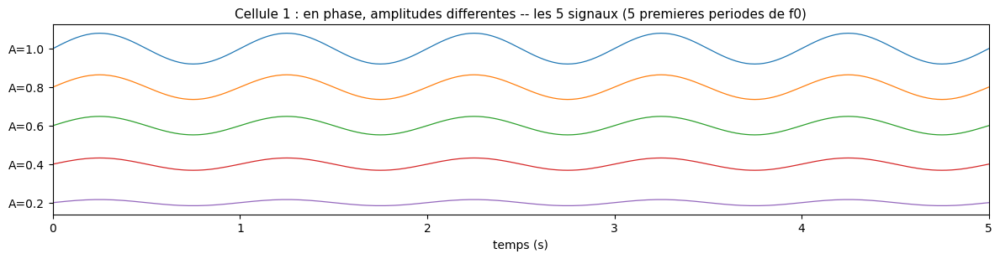

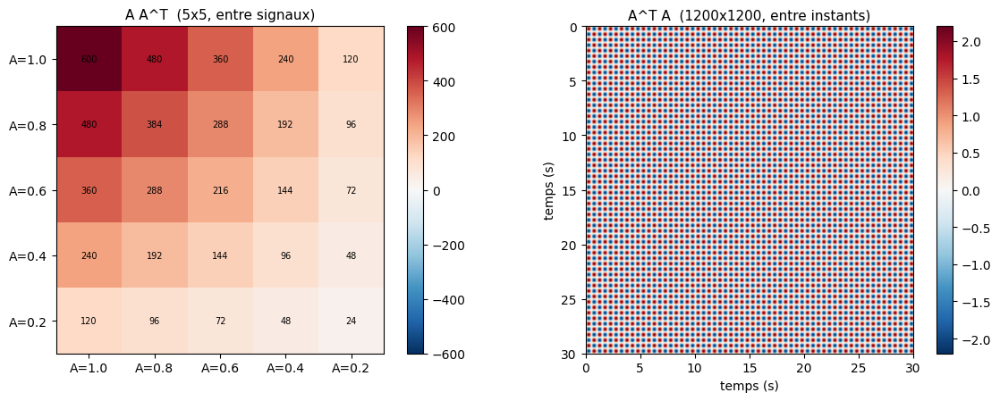

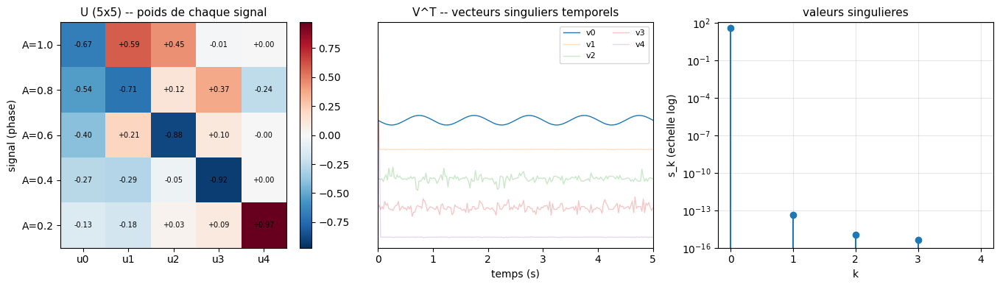

  frequence instantanee des vecteurs singuliers (hors bords) :
    v0 : 1.000 Hz  (ecart-type 0.000, min 1.000, max 1.000, part continue 0.0%)


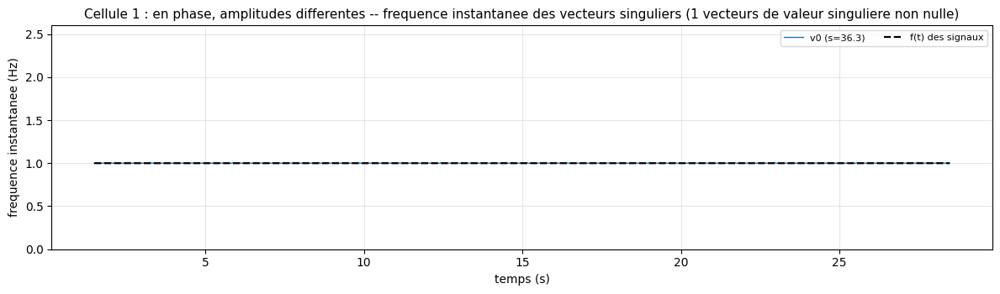


rang : 1
s1..s4 relatives a s0 : [1.12e-15 2.96e-17 1.23e-17 5.11e-31]
s0 = 36.3318   ||a|| * sqrt(N/2) = 36.3318

|U[:, 0]|              : [0.674 0.539 0.405 0.27  0.135]
amplitudes normalisees : [0.674 0.539 0.405 0.27  0.135]
|corr(v0, sin(2 pi f0 t))| = 1.000000

A A^T / (N/2) :
[[1.   0.8  0.6  0.4  0.2 ]
 [0.8  0.64 0.48 0.32 0.16]
 [0.6  0.48 0.36 0.24 0.12]
 [0.4  0.32 0.24 0.16 0.08]
 [0.2  0.16 0.12 0.08 0.04]]
a a^T :
[[1.   0.8  0.6  0.4  0.2 ]
 [0.8  0.64 0.48 0.32 0.16]
 [0.6  0.48 0.36 0.24 0.12]
 [0.4  0.32 0.24 0.16 0.08]
 [0.2  0.16 0.12 0.08 0.04]]


In [96]:
# 5 sinus de MEME frequence ET MEME phase : seules les amplitudes changent
# (decroissantes lineairement).
AMPLITUDES = np.linspace(1.0, 0.2, 5)
A1 = AMPLITUDES[:, None] * np.sin(2 * np.pi * F0 * t[None, :])   # (5, N)
labels1 = [f"A={a:.1f}" for a in AMPLITUDES]

U1, S1, Vt1 = figures_svd(
    A1, "Cellule 1 : en phase, amplitudes differentes", labels=labels1, f_ref=F0
)

# Toutes les lignes sont proportionnelles au MEME signal : A1 = a x^T, un
# produit exterieur -> rang 1, une seule valeur singuliere non nulle.
print("\nrang :", np.linalg.matrix_rank(A1))
print("s1..s4 relatives a s0 :", np.array2string(S1[1:] / S1[0], precision=2))
print(f"s0 = {S1[0]:.4f}   ||a|| * sqrt(N/2) = "
      f"{np.linalg.norm(AMPLITUDES) * np.sqrt(N / 2):.4f}")

# u0 = le profil d'amplitude normalise ; v0 = la forme d'onde normalisee.
print("\n|U[:, 0]|              :", np.round(np.abs(U1[:, 0]), 3))
print("amplitudes normalisees :", np.round(AMPLITUDES / np.linalg.norm(AMPLITUDES), 3))
sinus = np.sin(2 * np.pi * F0 * t)
print(f"|corr(v0, sin(2 pi f0 t))| = {abs(np.corrcoef(Vt1[0], sinus)[0, 1]):.6f}")

# A A^T vaut (N/2) a a^T : un produit exterieur, donc une seule direction.
print("\nA A^T / (N/2) :")
print(np.round((A1 @ A1.T) / (N / 2), 3))
print("a a^T :")
print(np.round(np.outer(AMPLITUDES, AMPLITUDES), 3))

## Cellule 2 -- meme frequence, 5 phases differentes

Cellule 2 : meme frequence, 5 phases
  A : (5, 1200)   rang numerique = 2
  valeurs singulieres : [4.581e+01 3.003e+01 1.910e-13 8.500e-14 4.321e-14]
  part d'energie      : [6.9944e-01 3.0056e-01 1.2165e-29 2.4083e-30 6.2247e-31]


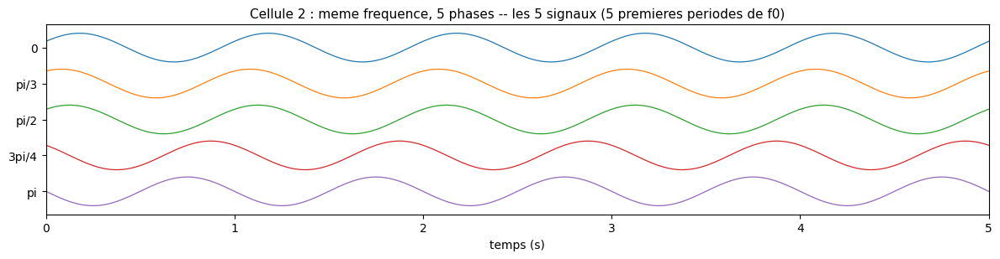

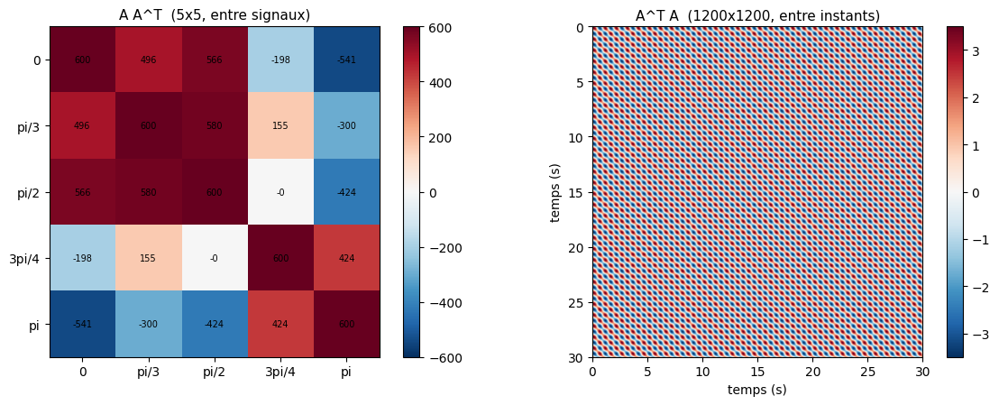

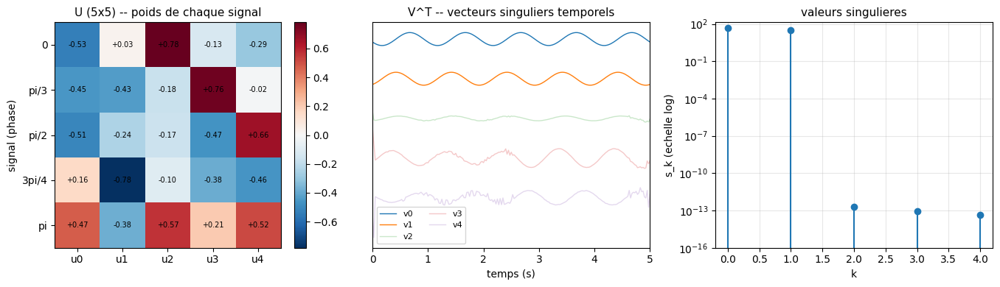

  frequence instantanee des vecteurs singuliers (hors bords) :
    v0 : 1.000 Hz  (ecart-type 0.000, min 1.000, max 1.000, part continue 0.0%)
    v1 : 1.000 Hz  (ecart-type 0.000, min 1.000, max 1.000, part continue 0.0%)


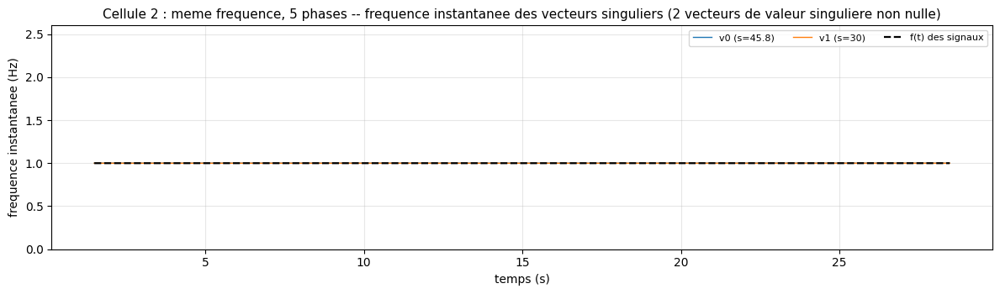


verification : s2..s4 relatives a s0 = [4.17e-15 1.86e-15 9.43e-16]
cos(phi_i - phi_j) attendu dans A A^T (a N/2 pres) :
[[ 1.     0.826  0.944 -0.33  -0.901]
 [ 0.826  1.     0.966  0.259 -0.5  ]
 [ 0.944  0.966  1.     0.    -0.707]
 [-0.33   0.259  0.     1.     0.707]
 [-0.901 -0.5   -0.707  0.707  1.   ]]
A A^T / (N/2) :
[[ 1.     0.826  0.944 -0.33  -0.901]
 [ 0.826  1.     0.966  0.259 -0.5  ]
 [ 0.944  0.966  1.    -0.    -0.707]
 [-0.33   0.259 -0.     1.     0.707]
 [-0.901 -0.5   -0.707  0.707  1.   ]]


In [117]:
# 5 sinus de MEME frequence f0, phases 0, pi/4, pi/2, 3pi/4, pi.
A2 = np.sin(2 * np.pi * F0 * t[None, :] + PHASES[:, None])   # (5, N)

U2, S2, Vt2 = figures_svd(A2, "Cellule 2 : meme frequence, 5 phases", f_ref=F0)

# sin(wt + phi) = cos(phi) sin(wt) + sin(phi) cos(wt) : les 5 signaux vivent
# dans le plan engendre par sin(wt) et cos(wt) -> rang 2, quelles que soient
# les phases et leur nombre.
print("\nverification : s2..s4 relatives a s0 =", np.array2string(S2[2:] / S2[0], precision=2))
print("cos(phi_i - phi_j) attendu dans A A^T (a N/2 pres) :")
print(np.round(np.cos(PHASES[:, None] - PHASES[None, :]), 3))
print("A A^T / (N/2) :")
print(np.round((A2 @ A2.T) / (N / 2), 3))

## Cellule 3 -- 5 frequences differentes, de f0 a 2 f0

Cellule 3 : 5 frequences f0..2f0
  A : (5, 1200)   rang numerique = 5
  valeurs singulieres : [24.495 24.495 24.495 24.495 24.495]
  part d'energie      : [0.2 0.2 0.2 0.2 0.2]


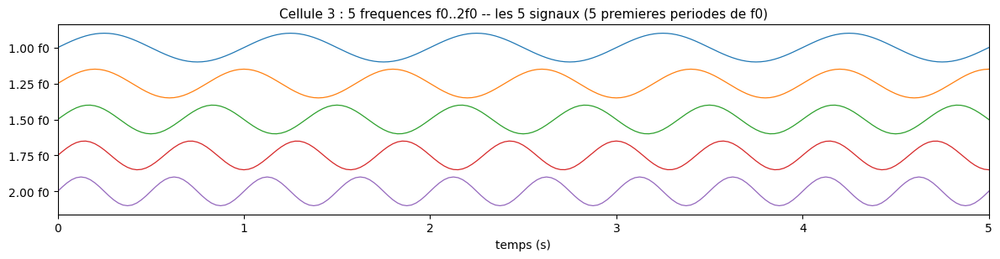

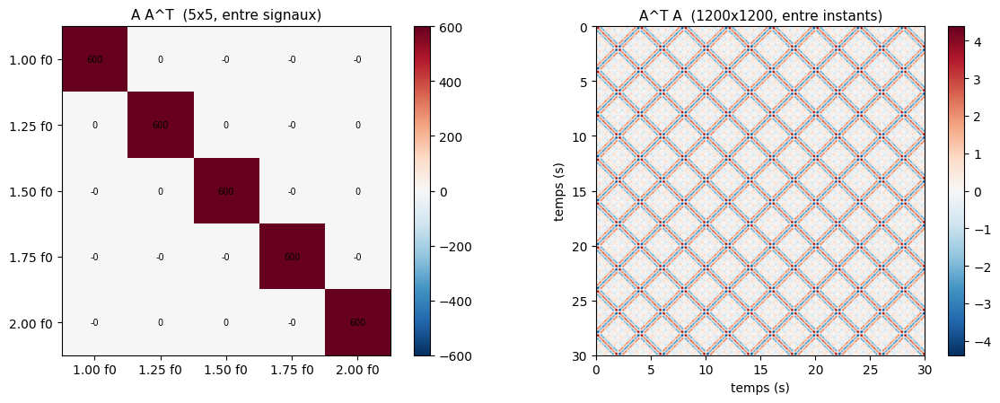

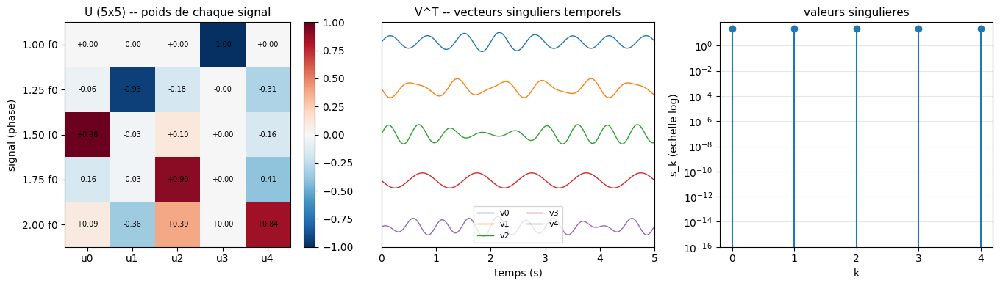

  frequence instantanee des vecteurs singuliers (hors bords) :
    v0 : 1.501 Hz  (ecart-type 0.035, min 1.446, max 1.559, part continue 0.0%)
    v1 : 1.252 Hz  (ecart-type 0.221, min 0.747, max 1.486, part continue 0.0%)
    v2 : 1.752 Hz  (ecart-type 0.071, min 1.611, max 1.907, part continue 0.0%)
    v3 : 1.000 Hz  (ecart-type 0.000, min 1.000, max 1.000, part continue 0.0%)
    v4 : 1.743 Hz  (ecart-type 0.778, min -6.128, max 2.188, part continue 0.0%)


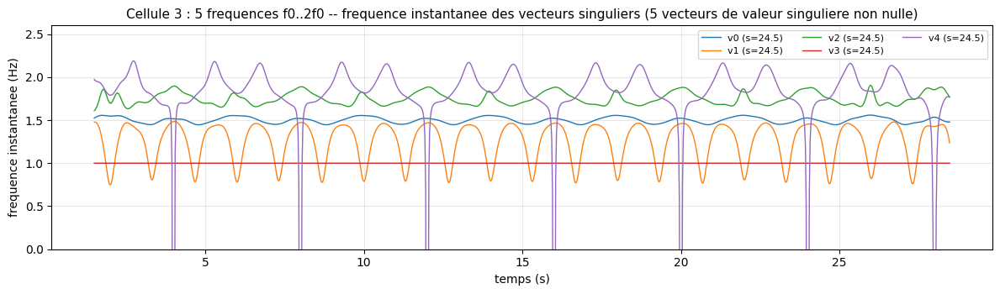


frequences : [1.   1.25 1.5  1.75 2.  ] Hz
nombre de cycles par signal : [30.  37.5 45.  52.5 60. ]
A A^T / (N/2) :
[[ 1.  0. -0. -0. -0.]
 [ 0.  1.  0. -0.  0.]
 [-0.  0.  1. -0.  0.]
 [-0. -0. -0.  1. -0.]
 [-0.  0.  0. -0.  1.]]

fenetre tronquee a 27.3 s : max hors-diagonale de A A^T / (N/2) = 0.023
valeurs singulieres tronquees : [23.66 23.66 23.58 23.06 22.83]


In [98]:
# Memes 30 cycles de f0 en duree ; les frequences vont de f0 a 2 f0.
FREQS = np.linspace(F0, 2 * F0, 5)
A3 = np.sin(2 * np.pi * FREQS[:, None] * t[None, :])        # (5, N), phases nulles
labels3 = [f"{f / F0:.2f} f0" for f in FREQS]

U3, S3, Vt3 = figures_svd(A3, "Cellule 3 : 5 frequences f0..2f0", labels=labels3)
# (pas de f_ref ici : les 5 signaux n'ont pas la meme frequence, il n'y a pas
#  une courbe de reference unique -- voir FREQS ci-dessous)
#
# La frequence instantanee de Hilbert ne veut dire quelque chose que pour un
# signal MONOCOMPOSANTE. Ici chaque vecteur singulier melange plusieurs
# frequences : les courbes oscillent, et v4 descend meme sous zero -- ce sont
# des sauts de phase du signal analytique, pas une frequence negative.

print("\nfrequences :", np.round(FREQS, 3), "Hz")
print("nombre de cycles par signal :", np.round(FREQS * DUREE, 1))
print("A A^T / (N/2) :")
print(np.round((A3 @ A3.T) / (N / 2), 3))

# La fenetre contient un nombre entier ou demi-entier de cycles pour CHACUNE
# des 5 frequences : les sinus y sont exactement orthogonaux, donc A A^T est
# diagonale et les 5 valeurs singulieres sont egales. Ce n'est pas une
# propriete des sinusoides, c'est une propriete de cette fenetre : en la
# tronquant, l'orthogonalite disparait.
A3_tronque = A3[:, : int(0.91 * N)]
G_tronque = A3_tronque @ A3_tronque.T
hors_diag = np.abs(G_tronque - np.diag(np.diag(G_tronque))).max() / (A3_tronque.shape[1] / 2)
print(f"\nfenetre tronquee a {0.91 * DUREE:.1f} s : max hors-diagonale de A A^T / (N/2)"
      f" = {hors_diag:.3f}")
print("valeurs singulieres tronquees :",
      np.array2string(np.linalg.svd(A3_tronque, compute_uv=False), precision=2))

## Cellule 4 -- meme frequence instantanee f(t) : f0 -> 2 f0, avec les 5 phases

Cellule 4 : chirp f0->2f0, 5 phases
  A : (5, 1200)   rang numerique = 2
  valeurs singulieres : [4.068e+01 3.668e+01 1.761e-13 1.364e-13 1.123e-13]
  part d'energie      : [5.5159e-01 4.4841e-01 1.0340e-29 6.2001e-30 4.2029e-30]


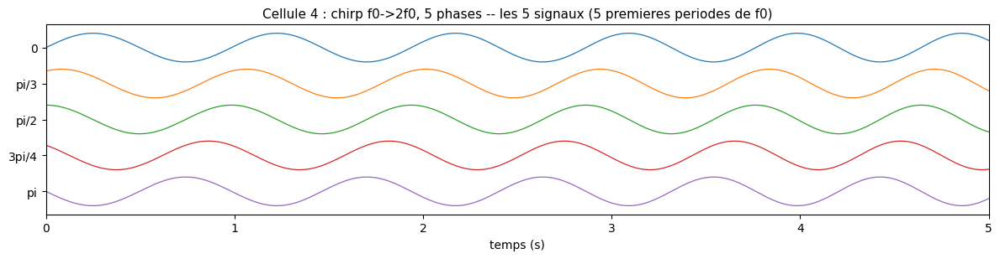

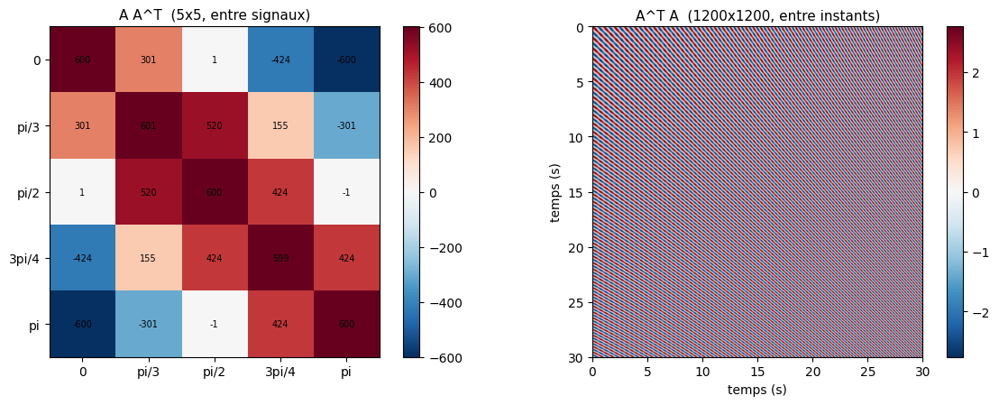

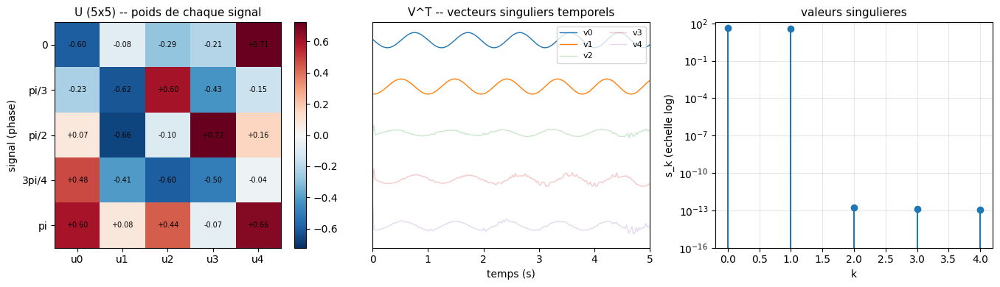

  frequence instantanee des vecteurs singuliers (hors bords) :
    v0 : 1.500 Hz  (ecart-type 0.260, min 1.033, max 1.967, part continue 0.0%)
    v1 : 1.500 Hz  (ecart-type 0.260, min 1.049, max 1.947, part continue 0.0%)


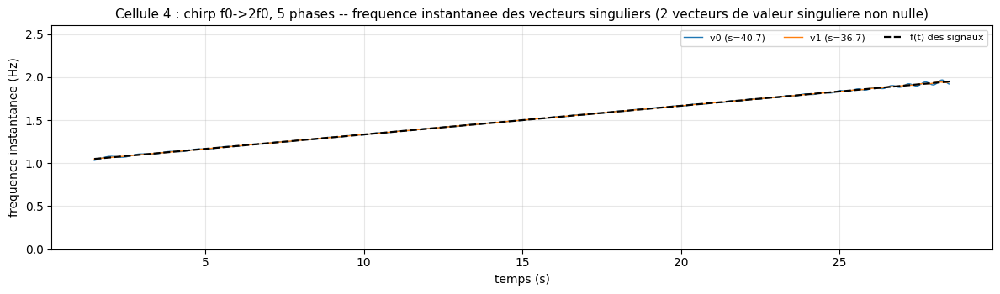


f(0) = 1.00 Hz, f(fin) = 2.00 Hz, cycles parcourus = 45.0
s2..s4 relatives a s0 = [4.33e-15 3.35e-15 2.76e-15]


In [99]:
# Chirp lineaire : f(t) = f0 (1 + t/DUREE), la meme pour les 5 signaux.
# Phase instantanee = 2 pi integrale de f -> f0 (t + t^2 / (2 DUREE)).
f_inst = F0 * (1 + t / DUREE)
phi_t = 2 * np.pi * F0 * (t + t**2 / (2 * DUREE))
A4 = np.sin(phi_t[None, :] + PHASES[:, None])               # (5, N)

U4, S4, Vt4 = figures_svd(A4, "Cellule 4 : chirp f0->2f0, 5 phases", f_ref=f_inst)

print(f"\nf(0) = {f_inst[0]:.2f} Hz, f(fin) = {f_inst[-1]:.2f} Hz, "
      f"cycles parcourus = {phi_t[-1] / (2 * np.pi):.1f}")
# sin(phi(t) + theta) = cos(theta) sin(phi(t)) + sin(theta) cos(phi(t)) :
# l'argument peut etre n'importe quelle fonction du temps, le rang reste 2.
print("s2..s4 relatives a s0 =", np.array2string(S4[2:] / S4[0], precision=2))

## Cellule 5 -- meme chirp, mais amplitudes decroissantes et moyenne non nulle

Cellule 5 : chirp f0->2f0, 5 phases, amplitudes decroissantes
  A : (5, 1200)   rang numerique = 3
  valeurs singulieres : [3.740e+01 2.304e+01 7.378e+00 9.764e-14 5.486e-14]
  part d'energie      : [7.0513e-01 2.6744e-01 2.7434e-02 4.8051e-30 1.5168e-30]


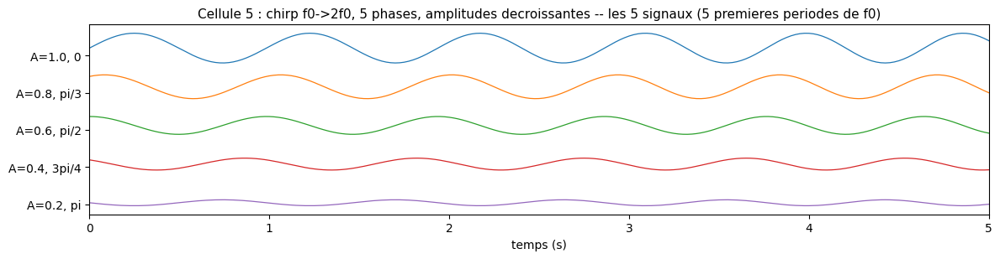

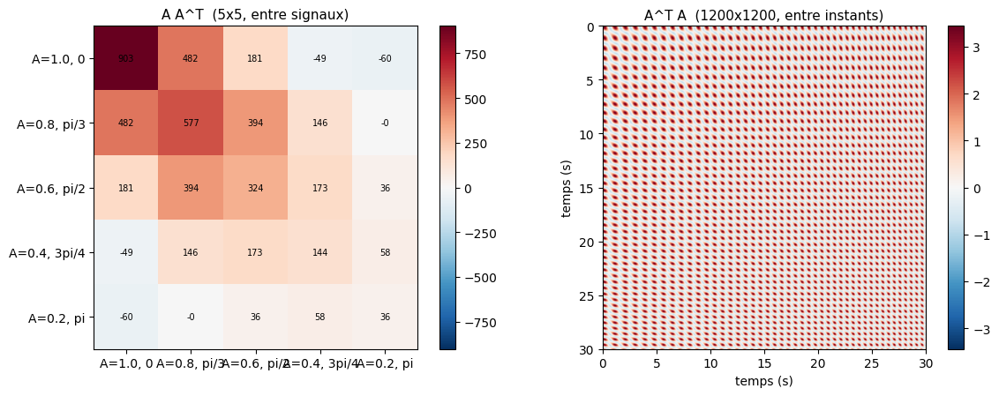

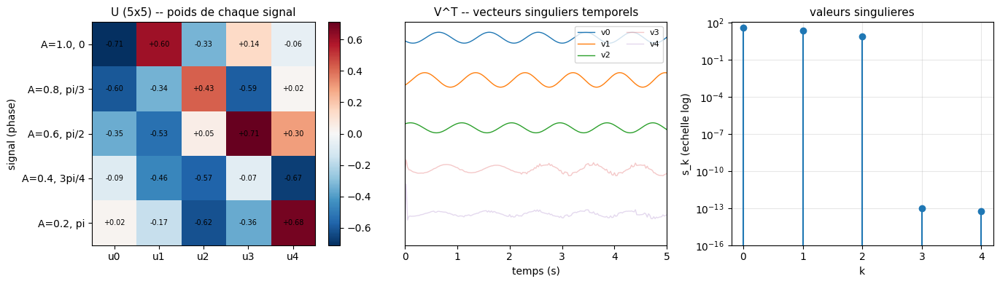

  frequence instantanee des vecteurs singuliers (hors bords) :
    v0 : 1.500 Hz  (ecart-type 0.260, min 1.041, max 1.962, part continue 44.5%)
    v1 : 1.500 Hz  (ecart-type 0.260, min 1.039, max 1.959, part continue 2.2%)
    v2 : 1.500 Hz  (ecart-type 0.260, min 1.045, max 1.957, part continue 53.3%)


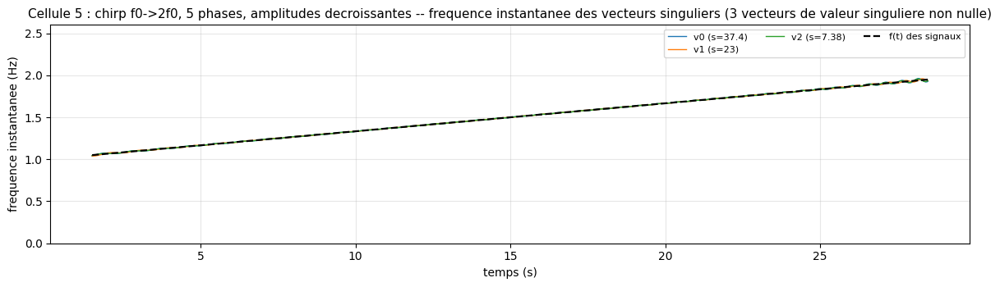


amplitudes         : [1.  0.8 0.6 0.4 0.2]
moyennes demandees : [0.5 0.4 0.3 0.2 0.1]
moyennes mesurees  : [0.5027 0.4011 0.3    0.1993 0.0995]
  (l'ecart vient du chirp : sa moyenne sur la fenetre n'est pas exactement nulle)

rang de A5            = 3   S = [3.740e+01 2.304e+01 7.378e+00 9.764e-14 5.486e-14]
rang une fois centre  = 2   S = [2.865e+01 2.235e+01 1.123e-13 7.108e-14 3.050e-14]

|U[:, 0]|                : [0.709 0.602 0.354 0.09  0.018]
amplitudes normalisees   : [0.674 0.539 0.405 0.27  0.135]
correlation entre les deux : 0.984


In [100]:
# Reprise exacte de la cellule 4 (meme chirp f0->2f0, memes 5 phases), avec en
# plus : une amplitude propre a chaque signal, decroissante lineairement, et
# une moyenne fixee a amplitude / 2.
AMPLITUDES = np.linspace(1.0, 0.2, 5)
A5 = (
    AMPLITUDES[:, None] * np.sin(phi_t[None, :] + PHASES[:, None])
    + AMPLITUDES[:, None] / 2
)
labels5 = [f"A={a:.1f}, {p}" for a, p in zip(AMPLITUDES, LABELS)]

U5, S5, Vt5 = figures_svd(
    A5,
    "Cellule 5 : chirp f0->2f0, 5 phases, amplitudes decroissantes",
    labels=labels5,
    f_ref=f_inst,
)

print("\namplitudes         :", np.round(AMPLITUDES, 3))
print("moyennes demandees :", np.round(AMPLITUDES / 2, 4))
print("moyennes mesurees  :", np.round(A5.mean(axis=1), 4))
print("  (l'ecart vient du chirp : sa moyenne sur la fenetre n'est pas exactement nulle)")

# Le decalage constant ajoute UNE direction -- le vecteur constant -- au plan
# sin/cos : rang 3 au lieu de 2. Les amplitudes, elles, ne changent pas
# l'espace engendre : elles ne font que ponderer les lignes.
A5_centre = A5 - A5.mean(axis=1, keepdims=True)
print(f"\nrang de A5            = {np.linalg.matrix_rank(A5)}   "
      f"S = {np.array2string(S5, precision=3)}")
print(f"rang une fois centre  = {np.linalg.matrix_rank(A5_centre)}   "
      f"S = {np.array2string(np.linalg.svd(A5_centre, compute_uv=False), precision=3)}")

# Cote U, le profil d'amplitude se lit maintenant dans les vecteurs singuliers :
# les lignes de forte amplitude pesent plus lourd.
print("\n|U[:, 0]|                :", np.round(np.abs(U5[:, 0]), 3))
print("amplitudes normalisees   :", np.round(AMPLITUDES / np.linalg.norm(AMPLITUDES), 3))
print(f"correlation entre les deux : {np.corrcoef(np.abs(U5[:, 0]), AMPLITUDES)[0, 1]:.3f}")

## Ce que les cinq cellules montrent

- **Cellule 1** : meme signal a un facteur pres -> **rang 1**. Une seule valeur
  singuliere non nulle, `A A^T = (N/2) a a^T`. `u0` est exactement le profil
  d'amplitude normalise, `v0` la forme d'onde normalisee : la SVD separe
  proprement "ou" (les amplitudes) de "quand" (le signal), parce qu'il n'y a
  qu'une seule chose a decrire.
- **Cellule 2** : 5 signaux, mais **rang 2**. Un dephasage est une combinaison
  lineaire de `sin` et `cos` a la meme frequence, donc ajouter des phases
  n'ajoute qu'une dimension, pas cinq. `A A^T` vaut exactement
  `(N/2) cos(phi_i - phi_j)`, une matrice de rang 2, et `A^T A` est la meme
  sinusoide repetee le long des diagonales. Les valeurs singulieres `s2..s4`
  valent ~1e-13 (le zero machine) : les colonnes `u2..u4` et `v2..v4`
  correspondantes sont du bruit d'arrondi, a ne pas interpreter.
- **Cellule 3** : 5 frequences distinctes -> **rang 5**, chaque signal apporte
  sa propre dimension. Ici les 5 valeurs singulieres sont meme *exactement
  egales* : la fenetre de 30 s contient un nombre entier ou demi-entier de
  cycles de chacune des 5 frequences, donc `A A^T` est diagonale. Deux
  consequences a retenir : (a) cette orthogonalite tient a la fenetre, pas aux
  sinusoides -- la tronquer la detruit ; (b) quand des valeurs singulieres sont
  egales, **`U` et `V` ne sont plus definis de facon unique** : n'importe quelle
  rotation du sous-espace correspondant est une SVD tout aussi valable. Les
  vecteurs que renvoie LAPACK dans ce cas ne veulent rien dire en soi. C'est
  aussi le seul cas ou la frequence instantanee des vecteurs singuliers part
  dans tous les sens : elle n'a de sens que pour un signal monocomposante.
- **Cellule 4** : la frequence varie, mais elle varie **de la meme facon pour
  tous** -> de nouveau **rang 2**. Ce qui fixe le rang n'est pas la constance de
  la frequence, c'est le fait que les signaux partagent la meme phase
  instantanee a un decalage constant pres. Les deux vecteurs singuliers
  affichent la meme frequence instantanee, la rampe f0 -> 2 f0.
- **Cellule 5** : amplitudes differentes et moyennes non nulles -> **rang 3**.
  Les amplitudes ne changent rien au rang (multiplier une ligne par un scalaire
  ne modifie pas l'espace engendre), elles ne font que redistribuer le poids des
  lignes dans `U` -- exactement comme en cellule 1. C'est le **decalage
  constant** qui coute une dimension : il ajoute le vecteur constant au plan
  `sin/cos`. Centrer chaque ligne rend le rang 2.

Lu dans l'ordre : l'amplitude ne cree pas de dimension (1), la phase en cree une
(2), une frequence propre a chaque signal en cree autant qu'il y a de signaux
(3), une frequence commune qui varie n'en cree aucune de plus (4), un decalage
constant en cree une (5).

C'est exactement la situation de la chaine pixel : une pulsation identique
partout, dephasee en profondeur, n'occupe que **deux** composantes SVD (une
paire en quadrature) -- plus une troisieme pour la composante continue tant
qu'on ne centre pas (`DecompositionConfig(normalize=False)` en production).
Aucune de ces composantes n'est le pouls : il faut la bonne combinaison
lineaire, ce que fait `OptimizedSpectralCombination`
([phase/aggregation.py](../src/ocularrigidity/motion/pulsation/phase/aggregation.py)).

# Section 2 -- une gaussienne qui oscille dans l'espace

On passe des signaux 1-D a une **image** : une tache gaussienne de 50x50 pixels
qui se deplace verticalement, de facon sinusoidale. La difference de fond avec
la section 1 : le signal n'est plus une grandeur mesuree directement, c'est
l'**intensite de chaque pixel**, et le mouvement n'y apparait qu'indirectement.

| parametre | valeur |
|---|---|
| image | 50 x 50 pixels |
| ecart-type de la gaussienne | 7 px |
| amplitude totale du deplacement | 2 px (crete a crete, donc +/- 1 px) |
| frequence d'oscillation | 1 Hz |
| echantillonnage | 15 Hz |
| nombre d'oscillations | 10 -> 150 images, 10 s |
| direction | verticale seulement |

`A` a **une ligne par pixel** (la variation d'intensite de ce pixel au cours du
temps) et **une colonne par image** : `A` est `(2500, 150)`. C'est la meme
convention qu'en section 1 -- une ligne = un signal temporel -- avec 2500
signaux au lieu de 5. `U` porte donc des **cartes spatiales** (a remettre en
50x50), `V^T` des **formes d'onde**.

## Cellule 2.1 -- gaussienne oscillante, tous les pixels

Cellule 2.1 : gaussienne oscillante
  A : (2500, 150)   rang numerique = 8
  valeurs singulieres : [1.5157e+02 1.0813e+01 3.8662e-01 1.1268e-02 2.8379e-04 6.3454e-06]
  part d'energie      : [9.949304e-01 5.063150e-03 6.473534e-06 5.498853e-09 3.487769e-12
 1.743726e-15]


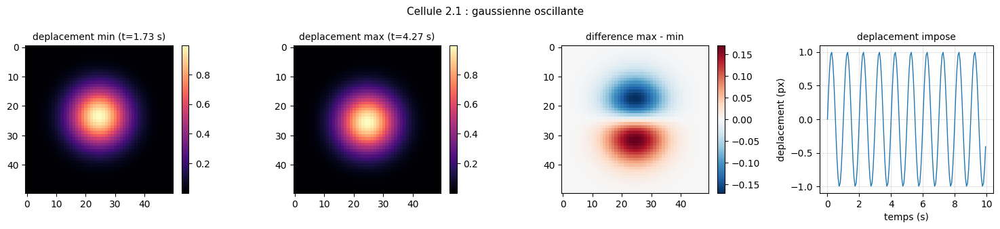

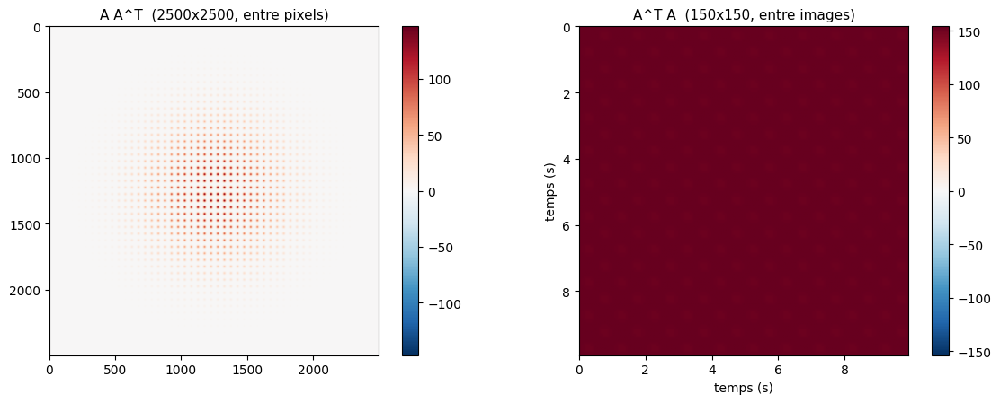

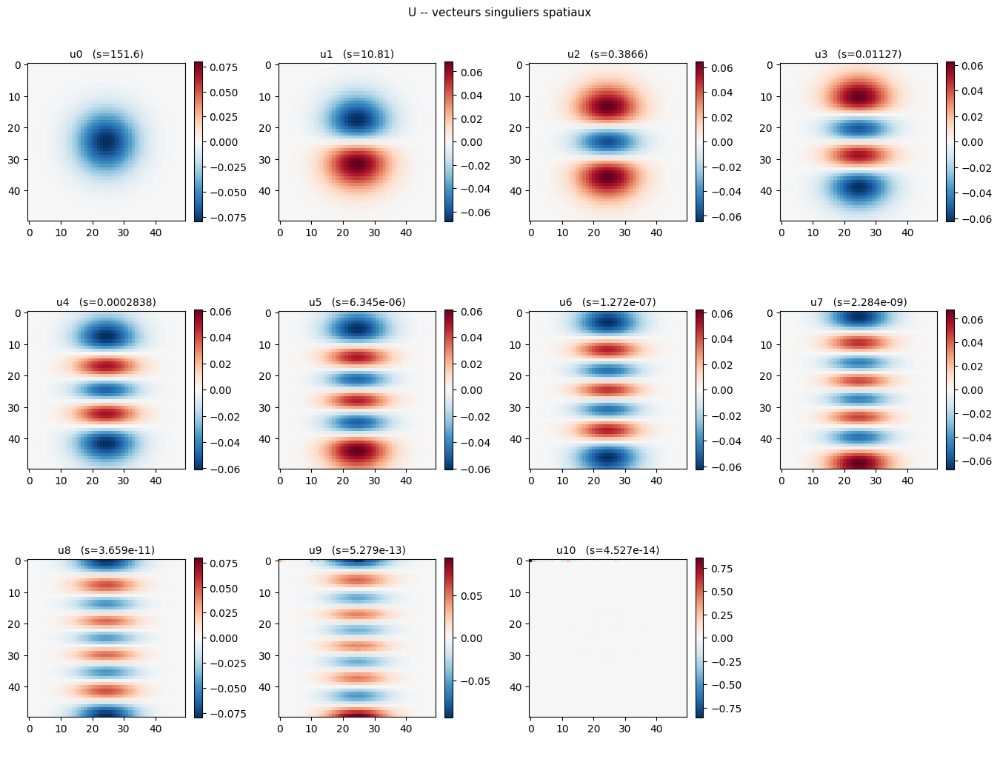

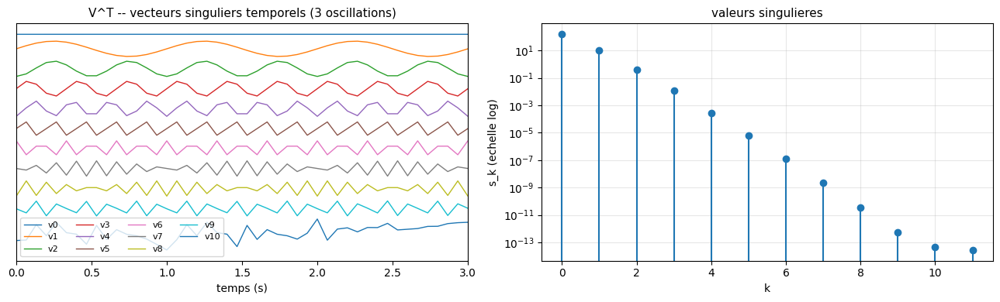

  vecteurs singuliers temporels :
    v0 : pic FFT  2.00 Hz, concentration 1.000, s/s0  1.0e+00, frequence instantanee  2.00 Hz (ecart-type 0.00), part continue 100.0%
    v1 : pic FFT  1.00 Hz, concentration 1.000, s/s0  7.1e-02, frequence instantanee  1.00 Hz (ecart-type 0.00), part continue 0.0%
    v2 : pic FFT  2.00 Hz, concentration 1.000, s/s0  2.6e-03, frequence instantanee  2.00 Hz (ecart-type 0.00), part continue 0.0%
    v3 : pic FFT  3.00 Hz, concentration 1.000, s/s0  7.4e-05, frequence instantanee  3.00 Hz (ecart-type 0.00), part continue 0.0%
    v4 : pic FFT  4.00 Hz, concentration 1.000, s/s0  1.9e-06, frequence instantanee  4.00 Hz (ecart-type 0.00), part continue 0.0%
    v5 : pic FFT  5.00 Hz, concentration 1.000, s/s0  4.2e-08, frequence instantanee  5.00 Hz (ecart-type 0.00), part continue 0.0%
    v6 : pic FFT  6.00 Hz, concentration 1.000, s/s0  8.4e-10, frequence instantanee  6.00 Hz (ecart-type 0.00), part continue 0.0%
    v7 : pic FFT  7.00 Hz, concentration

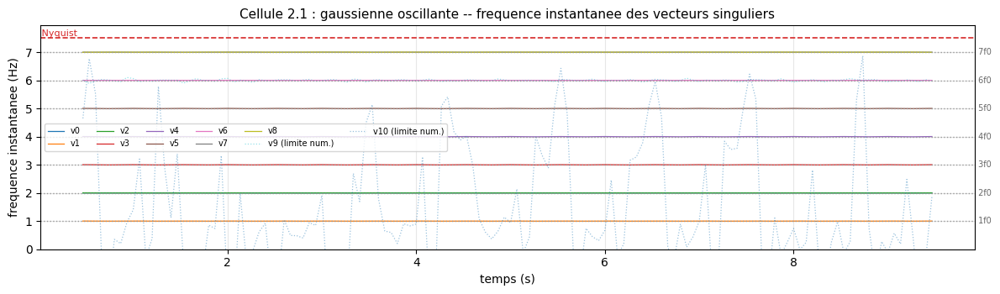


|correlation| entre les cartes u_k et les derivees de l'image moyenne :
  u0 vs G (image moyenne)  : 1.0000
  u1 vs dG/dy              : 1.0000
  u2 vs d2G/dy2            : 0.8688
  u3 vs d3G/dy3            : 0.6205

s1 / s0 mesure = 0.0713
a / (2 sigma)  = 0.0714   <- prediction du 1er ordre
rapports successifs s_(k+1) / s_k : [0.0713 0.0358 0.0291 0.0252]

 k | s_k/s_0  | pic FFT | k*f0 replie | concentration | lecture
 0 |  1.0e+00 |  2.00 Hz |  0.00 Hz     | 1.000         | continu (image moyenne)
 1 |  7.1e-02 |  1.00 Hz |  1.00 Hz     | 1.000         | ordre 1
 2 |  2.6e-03 |  2.00 Hz |  2.00 Hz     | 1.000         | ordre 2
 3 |  7.4e-05 |  3.00 Hz |  3.00 Hz     | 1.000         | ordre 3
 4 |  1.9e-06 |  4.00 Hz |  4.00 Hz     | 1.000         | ordre 4
 5 |  4.2e-08 |  5.00 Hz |  5.00 Hz     | 1.000         | ordre 5
 6 |  8.4e-10 |  6.00 Hz |  6.00 Hz     | 1.000         | ordre 6
 7 |  1.5e-11 |  7.00 Hz |  7.00 Hz     | 1.000         | ordre 7
 8 |  2.4e-13 |  7.00 Hz |  7.

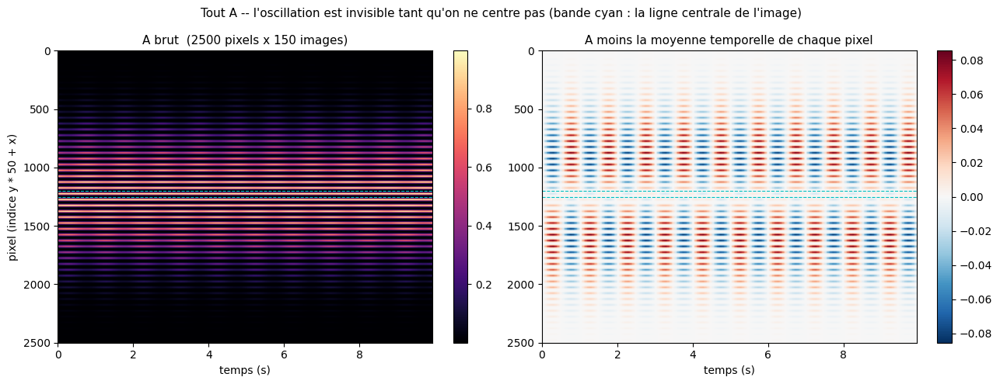

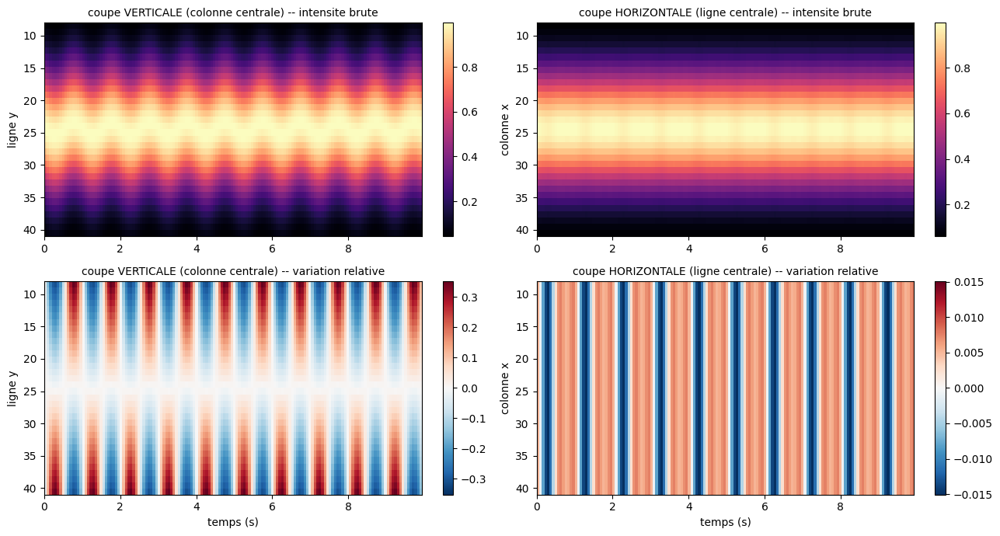

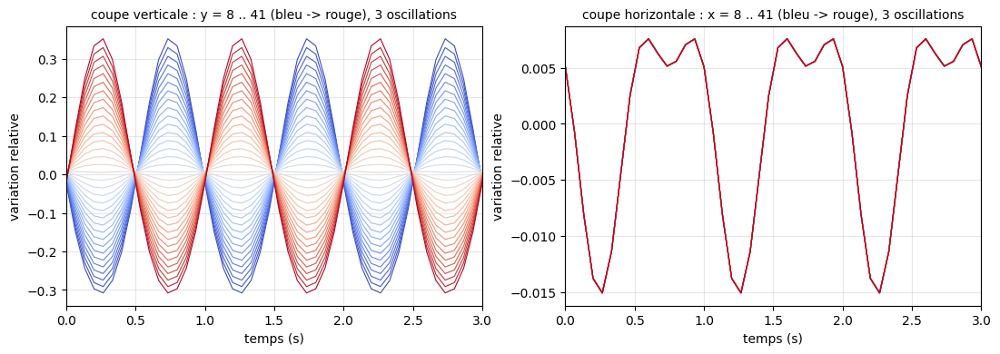


coupe VERTICALE : pic FFT, modulation relative, signe vs dy(t)
  y =  8 (a -16.5 px du centre) : 1.00 Hz, modulation 0.2348, signe -1
  y = 17 (a  -7.5 px du centre) : 1.00 Hz, modulation 0.1076, signe -1
  y = 24 (a  -0.5 px du centre) : 1.00 Hz, modulation 0.0080, signe -1
  y = 25 (a  +0.5 px du centre) : 1.00 Hz, modulation 0.0080, signe +1
  y = 32 (a  +7.5 px du centre) : 1.00 Hz, modulation 0.1076, signe +1
  y = 41 (a +16.5 px du centre) : 1.00 Hz, modulation 0.2348, signe +1

coupe HORIZONTALE : tous les pixels sont a la MEME hauteur, donc
ils subissent tous exactement la meme modulation temporelle :
  x =  8 : 1.00 Hz, modulation 0.00804, signe -1
  x = 17 : 1.00 Hz, modulation 0.00804, signe -1
  x = 24 : 1.00 Hz, modulation 0.00804, signe -1
  x = 32 : 1.00 Hz, modulation 0.00804, signe -1
  x = 41 : 1.00 Hz, modulation 0.00804, signe -1

moyenne des lignes 24 et 25 (= le centre exact) : 2.00 Hz, modulation 0.00359
-> au centre exact le gradient est nul : il ne reste que l

In [101]:
# --- Parametres de la section 2 --------------------------------------------
TAILLE = 50            # image TAILLE x TAILLE pixels
SIGMA = 7.0            # ecart-type de la gaussienne, en pixels
DEPL_TOTAL = 2.0       # amplitude TOTALE du deplacement (crete a crete), px
F_OSC = 1.0            # Hz
FS2 = 15.0             # Hz, echantillonnage
N_OSC = 10             # nombre d'oscillations
T2 = int(round(N_OSC * FS2 / F_OSC))    # 150 images
t2 = np.arange(T2) / FS2
BORD2 = max(int(0.05 * T2), 1)

yy, xx = np.mgrid[0:TAILLE, 0:TAILLE]
CENTRE = (TAILLE - 1) / 2
dy = (DEPL_TOTAL / 2) * np.sin(2 * np.pi * F_OSC * t2)      # +/- 1 px

images = np.exp(
    -(
        ((yy[None] - CENTRE - dy[:, None, None]) ** 2 + (xx[None] - CENTRE) ** 2)
        / (2 * SIGMA**2)
    )
)                                          # (T2, TAILLE, TAILLE)

# Une LIGNE par pixel (sa variation d'intensite), une COLONNE par image.
A21 = images.reshape(T2, -1).T             # (2500, 150)


def figures_svd_image(A, titre, temps, images_src, deplacement,
                      forme=(TAILLE, TAILLE), n_comp=11, harmoniques=7):
    """Meme analyse qu'en section 1, adaptee a une matrice pixels x images."""
    U, S, Vt = np.linalg.svd(A, full_matrices=False)
    n_comp = min(n_comp, len(S))
    bord = max(int(0.05 * len(temps)), 1)
    # En dessous de ~1e-14 fois s0, une composante n'est plus que du bruit
    # d'arrondi de la SVD (eps machine ~ 2.2e-16) : on la trace en pointilles.
    seuil_bruit = 1e-14 * S[0]

    print(titre)
    print(f"  A : {A.shape}   rang numerique = {np.linalg.matrix_rank(A)}")
    print(f"  valeurs singulieres : {np.array2string(S[:6], precision=4)}")
    print(f"  part d'energie      : {np.array2string(S[:6]**2 / (S**2).sum(), precision=6)}")

    # --- 1. la simulation ---
    i_max = int(np.argmax(deplacement))
    i_min = int(np.argmin(deplacement))
    fig, axes = plt.subplots(1, 4, figsize=(15, 3.4))
    for ax, img, ttl in (
        (axes[0], images_src[i_min], f"deplacement min (t={temps[i_min]:.2f} s)"),
        (axes[1], images_src[i_max], f"deplacement max (t={temps[i_max]:.2f} s)"),
    ):
        im = ax.imshow(img, cmap="magma")
        ax.set_title(ttl, fontsize=10)
        fig.colorbar(im, ax=ax, fraction=0.046)
    diff = images_src[i_max] - images_src[i_min]
    v = np.abs(diff).max()
    im = axes[2].imshow(diff, cmap="RdBu_r", vmin=-v, vmax=v)
    axes[2].set_title("difference max - min", fontsize=10)
    fig.colorbar(im, ax=axes[2], fraction=0.046)
    axes[3].plot(temps, deplacement, lw=1.0)
    axes[3].set_xlabel("temps (s)"); axes[3].set_ylabel("deplacement (px)")
    axes[3].set_title("deplacement impose", fontsize=10)
    axes[3].grid(alpha=0.3)
    fig.suptitle(titre, fontsize=11)
    fig.tight_layout()
    plt.show()

    # --- 2. A A^T et A^T A ---
    fig, axes = plt.subplots(1, 2, figsize=(12, 4.6))
    G_pix = A @ A.T
    v = np.abs(G_pix).max()
    im = axes[0].imshow(G_pix, cmap="RdBu_r", vmin=-v, vmax=v)
    axes[0].set_title(f"A A^T  ({G_pix.shape[0]}x{G_pix.shape[0]}, entre pixels)",
                      fontsize=11)
    fig.colorbar(im, ax=axes[0], fraction=0.046)
    G_tps = A.T @ A
    v = np.abs(G_tps).max()
    im = axes[1].imshow(G_tps, cmap="RdBu_r", vmin=-v, vmax=v,
                        extent=[temps[0], temps[-1], temps[-1], temps[0]])
    axes[1].set_xlabel("temps (s)"); axes[1].set_ylabel("temps (s)")
    axes[1].set_title(f"A^T A  ({G_tps.shape[0]}x{G_tps.shape[0]}, entre images)",
                      fontsize=11)
    fig.colorbar(im, ax=axes[1], fraction=0.046)
    fig.tight_layout()
    plt.show()

    # --- 3. vecteurs singuliers spatiaux (colonnes de U, remises en image) ---
    n_col = min(n_comp, 4)
    n_lig = int(np.ceil(n_comp / n_col))
    fig, axes = plt.subplots(n_lig, n_col, figsize=(3.4 * n_col, 3.5 * n_lig))
    axes = np.atleast_1d(axes).ravel()
    for k in range(n_comp):
        carte = U[:, k].reshape(forme)
        v = np.abs(carte).max()
        im = axes[k].imshow(carte, cmap="RdBu_r", vmin=-v, vmax=v)
        axes[k].set_title(f"u{k}   (s={S[k]:.4g})", fontsize=10)
        fig.colorbar(im, ax=axes[k], fraction=0.046)
    for ax in axes[n_comp:]:
        ax.axis("off")
    fig.suptitle("U -- vecteurs singuliers spatiaux", fontsize=11)
    fig.tight_layout()
    plt.show()

    # --- 4. vecteurs singuliers temporels + valeurs singulieres ---
    fig, axes = plt.subplots(1, 2, figsize=(13, 4.0))
    for k in range(n_comp):
        axes[0].plot(temps, Vt[k] - 0.3 * k, lw=1.0, label=f"v{k}")
    axes[0].set_xlabel("temps (s)"); axes[0].set_yticks([])
    axes[0].set_xlim(temps[0], temps[min(len(temps) - 1, int(3 * len(temps) / N_OSC))])
    axes[0].set_title("V^T -- vecteurs singuliers temporels (3 oscillations)",
                      fontsize=11)
    axes[0].legend(fontsize=8, ncol=4)
    axes[1].stem(np.arange(min(12, len(S))), S[:12])
    axes[1].set_yscale("log")
    axes[1].set_xlabel("k"); axes[1].set_ylabel("s_k (echelle log)")
    axes[1].set_title("valeurs singulieres", fontsize=11)
    axes[1].grid(alpha=0.3)
    fig.tight_layout()
    plt.show()

    # --- 5. frequence instantanee + contenu spectral ---
    freqs = np.fft.rfftfreq(len(temps), temps[1] - temps[0])
    fig, ax = plt.subplots(figsize=(12, 3.6))
    print("  vecteurs singuliers temporels :")
    for k in range(n_comp):
        p = np.abs(np.fft.rfft(Vt[k] - Vt[k].mean())) ** 2
        concentration = p.max() / p.sum()
        f_k = frequence_instantanee(Vt[k], temps)[bord:-bord]
        part_continue = (Vt[k].mean() * np.sqrt(len(temps))) ** 2
        bruit = S[k] < seuil_bruit
        ax.plot(temps[bord:-bord], f_k, lw=0.9,
                ls=":" if bruit else "-", alpha=0.45 if bruit else 1.0,
                label=f"v{k}" + (" (limite num.)" if bruit else ""))
        print(f"    v{k:<2d}: pic FFT {freqs[p.argmax()]:5.2f} Hz, "
              f"concentration {concentration:.3f}, s/s0 {S[k] / S[0]:8.1e}, "
              f"frequence instantanee {f_k.mean():5.2f} Hz "
              f"(ecart-type {f_k.std():.2f}), part continue {part_continue:.1%}"
              + ("   <- sous la precision machine" if bruit else ""))
    nyquist = 1.0 / (2 * (temps[1] - temps[0]))
    for h in range(1, harmoniques + 1):
        ax.axhline(h * F_OSC, color="0.6", ls=":", lw=1)
        ax.text(temps[-1], h * F_OSC, f" {h}f0", fontsize=7, color="0.4", va="center")
    # Au-dela de Nyquist les harmoniques se replient : v7 (7 f0) est le dernier
    # ordre lisible, les suivants retombent sur des frequences deja occupees.
    ax.axhline(nyquist, color="C3", ls="--", lw=1.2)
    ax.text(temps[0], nyquist, " Nyquist", fontsize=8, color="C3", va="bottom")
    ax.set_xlabel("temps (s)"); ax.set_ylabel("frequence instantanee (Hz)")
    ax.set_ylim(0, nyquist * 1.06)
    ax.set_title(f"{titre} -- frequence instantanee des vecteurs singuliers",
                 fontsize=11)
    ax.legend(fontsize=7, ncol=6)
    ax.grid(alpha=0.3)
    fig.tight_layout()
    plt.show()

    return U, S, Vt


U21, S21, Vt21 = figures_svd_image(
    A21, "Cellule 2.1 : gaussienne oscillante", t2, images, dy
)

# --- Ce que la SVD a trouve, compare au developpement de Taylor -------------
# Un deplacement dy(t) petit devant SIGMA se lit, pixel par pixel, comme
#   I(y, t) = G(y - dy) = G(y) - dy(t) G'(y) + dy(t)^2 / 2 * G''(y) - ...
# donc : u0 ~ l'image moyenne (constante dans le temps), u1 ~ -G' (module par
# dy, a 1 Hz), u2 ~ G'' (module par dy^2, donc a 2 Hz), etc. Le mouvement est
# sinusoidal, mais l'intensite qu'il produit ne l'est PAS : elle contient les
# harmoniques.
G_moy = A21.mean(axis=1).reshape(TAILLE, TAILLE)
d1 = np.gradient(G_moy, axis=0)
d2 = np.gradient(d1, axis=0)
d3 = np.gradient(d2, axis=0)


def correlation(a, b):
    a = a.ravel() - a.ravel().mean()
    b = b.ravel() - b.ravel().mean()
    return abs(np.corrcoef(a, b)[0, 1])


print("\n|correlation| entre les cartes u_k et les derivees de l'image moyenne :")
for k, (cible, nom) in enumerate(
    ((G_moy, "G (image moyenne)"), (d1, "dG/dy"), (d2, "d2G/dy2"), (d3, "d3G/dy3"))
):
    print(f"  u{k} vs {nom:18s} : {correlation(U21[:, k], cible):.4f}")

# Au 1er ordre, A = G (x) 1 - G' (x) dy. Pour une gaussienne, le rapport des
# normes se calcule exactement : ||G'|| / ||G|| = 1 / (sigma sqrt(2)) et
# ||dy|| = a sqrt(T/2), donc s1 / s0 = a / (2 sigma), avec a la demi-amplitude.
print(f"\ns1 / s0 mesure = {S21[1] / S21[0]:.4f}")
print(f"a / (2 sigma)  = {(DEPL_TOTAL / 2) / (2 * SIGMA):.4f}   <- prediction du 1er ordre")
print("rapports successifs s_(k+1) / s_k :",
      np.array2string(S21[1:5] / S21[:4], precision=4))

# Sans centrage, u0 est l'image moyenne et capte presque tout ; le mouvement
# vit dans les composantes suivantes.
A21_centre = A21 - A21.mean(axis=1, keepdims=True)
S21_centre = np.linalg.svd(A21_centre, compute_uv=False)
# --- Ou l'escalier harmonique s'arrete -------------------------------------
# L'ordre k du developpement oscille a k * f0. Deux limites le rattrapent :
# au-dela de Nyquist (FS2 / 2) les frequences se replient, et en dessous de la
# precision machine il ne reste que du bruit d'arrondi. La concentration
# spectrale (part du pic dans la puissance totale) est ce qui les distingue.
freqs21 = np.fft.rfftfreq(T2, 1 / FS2)
print("\n k | s_k/s_0  | pic FFT | k*f0 replie | concentration | lecture")
for k in range(11):
    p = np.abs(np.fft.rfft(Vt21[k] - Vt21[k].mean())) ** 2
    ratio = S21[k] / S21[0]
    f_pic = freqs21[p.argmax()]
    replie = abs(k * F_OSC - FS2 * round(k * F_OSC / FS2))
    concentration = p.max() / p.sum()
    # Un s_k minuscule ne suffit pas a conclure au bruit : c'est la
    # concentration spectrale qui dit si la composante a encore une structure.
    # v9 par exemple est au niveau de la precision machine mais reste un
    # harmonique parfaitement net.
    if concentration < 0.9:
        lecture = "bruit d'arrondi"
    else:
        if k == 0:
            lecture = "continu (image moyenne)"
        elif k * F_OSC > FS2 / 2:
            lecture = f"ordre {k}, replie"
        else:
            lecture = f"ordre {k}"
        if ratio < 1e-14:
            lecture += ", a la precision machine"
    print(f"{k:2d} | {ratio:8.1e} | {f_pic:5.2f} Hz | {replie:5.2f} Hz     | "
          f"{concentration:.3f}         | {lecture}")

print(f"\nvaleurs singulieres sans centrage : {np.array2string(S21[:5], precision=4)}")
print(f"                    apres centrage : {np.array2string(S21_centre[:5], precision=4)}")

# --------------------------------------------------------------------------- #
# Affichage de A : la matrice entiere, puis les deux coupes centrales
# --------------------------------------------------------------------------- #
# Region "non nulle" : pixels ou l'image moyenne depasse 5 % de son maximum.
SEUIL = 0.05
masque_ok = G_moy > SEUIL * G_moy.max()
C_INT = int(round(CENTRE))                       # 24 : il n'y a pas de pixel
# exactement au centre, l'image ayant un nombre PAIR de lignes (centre = 24.5).

lignes_ok = np.where(masque_ok[:, C_INT])[0]     # coupe verticale (colonne centrale)
cols_ok = np.where(masque_ok[C_INT, :])[0]       # coupe horizontale (ligne centrale)
# Les pixels sont ranges en ordre C : indice dans A = y * TAILLE + x.
idx_vert = lignes_ok * TAILLE + C_INT
idx_horiz = C_INT * TAILLE + cols_ok

A_vert = A21[idx_vert]                           # (n_lignes, T2)
A_horiz = A21[idx_horiz]                         # (n_colonnes, T2)
# Variation relative de chaque pixel autour de sa propre moyenne : sans cela
# le profil statique de la gaussienne ecrase completement l'oscillation.
rel = lambda M: M / M.mean(axis=1, keepdims=True) - 1.0

print(f"\nregion non nulle (image moyenne > {SEUIL:.0%} du max) :")
print(f"  coupe verticale   : lignes {lignes_ok.min()} a {lignes_ok.max()} "
      f"({lignes_ok.size} pixels), colonne x = {C_INT}")
print(f"  coupe horizontale : colonnes {cols_ok.min()} a {cols_ok.max()} "
      f"({cols_ok.size} pixels), ligne y = {C_INT}")

# --- 1. tout A -------------------------------------------------------------
fig, axes = plt.subplots(1, 2, figsize=(13, 5.0))
im = axes[0].imshow(A21, cmap="magma", aspect="auto",
                    extent=[t2[0], t2[-1], A21.shape[0], 0])
axes[0].set_xlabel("temps (s)"); axes[0].set_ylabel("pixel (indice y * 50 + x)")
axes[0].set_title(f"A brut  ({A21.shape[0]} pixels x {A21.shape[1]} images)", fontsize=11)
fig.colorbar(im, ax=axes[0], fraction=0.046)

A21_c = A21 - A21.mean(axis=1, keepdims=True)
v = np.abs(A21_c).max()
im = axes[1].imshow(A21_c, cmap="RdBu_r", aspect="auto", vmin=-v, vmax=v,
                    extent=[t2[0], t2[-1], A21.shape[0], 0])
axes[1].set_xlabel("temps (s)")
axes[1].set_title("A moins la moyenne temporelle de chaque pixel", fontsize=11)
fig.colorbar(im, ax=axes[1], fraction=0.046)
for ax in axes:
    ax.axhline(C_INT * TAILLE, color="c", lw=0.8, ls="--")
    ax.axhline((C_INT + 1) * TAILLE, color="c", lw=0.8, ls="--")
fig.suptitle("Tout A -- l'oscillation est invisible tant qu'on ne centre pas "
             "(bande cyan : la ligne centrale de l'image)", fontsize=11)
fig.tight_layout()
plt.show()

# --- 2. les deux coupes ----------------------------------------------------
fig, axes = plt.subplots(2, 2, figsize=(13, 7.0))
for col, (M, etiquettes, nom, axe) in enumerate((
    (A_vert, lignes_ok, "coupe VERTICALE (colonne centrale)", "ligne y"),
    (A_horiz, cols_ok, "coupe HORIZONTALE (ligne centrale)", "colonne x"),
)):
    im = axes[0, col].imshow(
        M, cmap="magma", aspect="auto",
        extent=[t2[0], t2[-1], etiquettes.max(), etiquettes.min()],
    )
    axes[0, col].set_title(f"{nom} -- intensite brute", fontsize=10)
    axes[0, col].set_ylabel(axe)
    fig.colorbar(im, ax=axes[0, col], fraction=0.046)

    R = rel(M)
    v = np.abs(R).max()
    im = axes[1, col].imshow(
        R, cmap="RdBu_r", aspect="auto", vmin=-v, vmax=v,
        extent=[t2[0], t2[-1], etiquettes.max(), etiquettes.min()],
    )
    axes[1, col].set_title(f"{nom} -- variation relative", fontsize=10)
    axes[1, col].set_xlabel("temps (s)"); axes[1, col].set_ylabel(axe)
    fig.colorbar(im, ax=axes[1, col], fraction=0.046)
fig.tight_layout()
plt.show()

# --- 3. les traces elles-memes --------------------------------------------
fig, axes = plt.subplots(1, 2, figsize=(13, 4.0))
for ax, M, etiquettes, nom in (
    (axes[0], A_vert, lignes_ok, "coupe verticale : y ="),
    (axes[1], A_horiz, cols_ok, "coupe horizontale : x ="),
):
    R = rel(M)
    couleurs = plt.cm.coolwarm(np.linspace(0, 1, len(etiquettes)))
    for j in range(len(etiquettes)):
        ax.plot(t2, R[j], lw=0.8, color=couleurs[j])
    ax.set_xlim(0, 3 / F_OSC)
    ax.set_xlabel("temps (s)"); ax.set_ylabel("variation relative")
    ax.set_title(f"{nom} {etiquettes.min()} .. {etiquettes.max()} "
                 "(bleu -> rouge), 3 oscillations", fontsize=10)
    ax.grid(alpha=0.3)
plt.show()

# --- 4. ce que disent ces traces ------------------------------------------
freqs2 = np.fft.rfftfreq(T2, 1 / FS2)


def pic_et_modulation(trace):
    centre_ = trace - trace.mean()
    p = np.abs(np.fft.rfft(centre_)) ** 2
    signe = np.sign(np.corrcoef(centre_, dy)[0, 1])
    return freqs2[p.argmax()], trace.std() / trace.mean(), signe


print("\ncoupe VERTICALE : pic FFT, modulation relative, signe vs dy(t)")
for L in (lignes_ok.min(), C_INT - 7, C_INT, C_INT + 1, C_INT + 8, lignes_ok.max()):
    f_p, mod, sgn = pic_et_modulation(A21[L * TAILLE + C_INT])
    print(f"  y = {L:2d} (a {L - CENTRE:+5.1f} px du centre) : {f_p:.2f} Hz, "
          f"modulation {mod:.4f}, signe {sgn:+.0f}")

print("\ncoupe HORIZONTALE : tous les pixels sont a la MEME hauteur, donc")
print("ils subissent tous exactement la meme modulation temporelle :")
for X in (cols_ok.min(), C_INT - 7, C_INT, C_INT + 8, cols_ok.max()):
    f_p, mod, sgn = pic_et_modulation(A21[C_INT * TAILLE + X])
    print(f"  x = {X:2d} : {f_p:.2f} Hz, modulation {mod:.5f}, signe {sgn:+.0f}")

# La ligne y = 24 n'est pas la ligne centrale : le centre tombe a 24.5. Elle
# garde donc un residu a 1 f0 proportionnel a son decalage d'un demi-pixel.
# En moyennant les deux lignes qui encadrent le centre, ce residu s'annule et
# il ne reste que le 2e ordre, a 2 f0.
milieu = (A21[C_INT * TAILLE + C_INT] + A21[(C_INT + 1) * TAILLE + C_INT]) / 2
f_p, mod, _ = pic_et_modulation(milieu)
print(f"\nmoyenne des lignes {C_INT} et {C_INT + 1} (= le centre exact) : "
      f"{f_p:.2f} Hz, modulation {mod:.5f}")
print("-> au centre exact le gradient est nul : il ne reste que le terme en dy^2,")
print("   c'est-a-dire l'harmonique a 2 f0. C'est de la que vient v2.")


## Cellule 2.2 -- le deplacement est bruite

Meme simulation, mais le deplacement impose devient

```
dy(t) = 1 px * sin(2 pi f0 t)  +  bruit blanc d'ecart-type 1 px
```

Le bruit porte sur le **deplacement**, pas sur l'intensite : chaque image reste
une gaussienne parfaite, c'est sa position qui tremble. Avec un ecart-type
egal a la demi-amplitude de l'oscillation, le mouvement est autant du bruit que
du signal -- c'est volontairement severe.

La question interessante n'est pas "est-ce que ca degrade" (evidemment) mais
**ou** le bruit atterrit dans la decomposition.

deplacement : rms sans bruit = 0.707 px, avec bruit = 1.238 px (bruit seul : 1.0 px)
Cellule 2.2 : deplacement bruite
  A : (2500, 150)   rang numerique = 11
  valeurs singulieres : [1.5080e+02 1.8614e+01 2.1024e+00 2.1474e-01 1.8817e-02 1.2497e-03]
  part d'energie      : [9.848019e-01 1.500467e-02 1.914287e-04 1.997078e-06 1.533448e-08
 6.763227e-11]


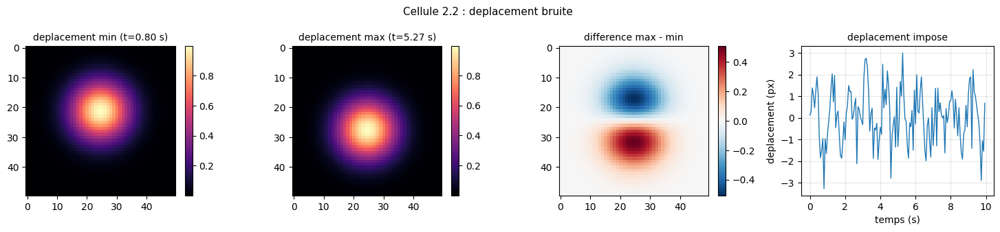

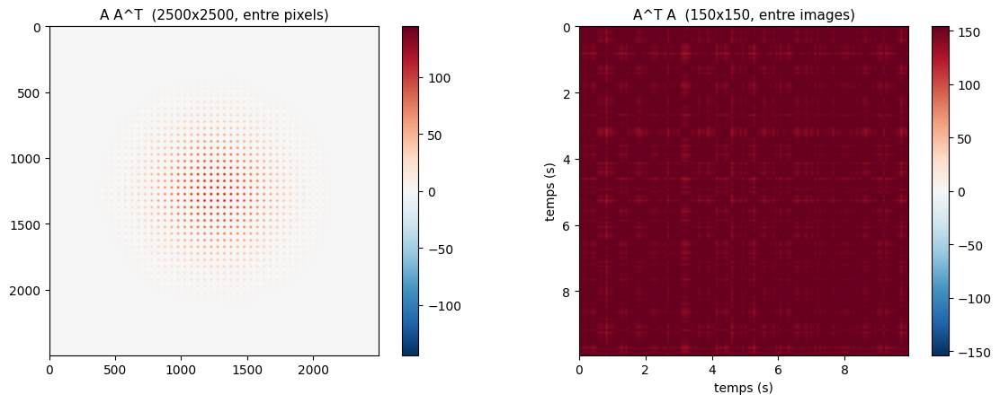

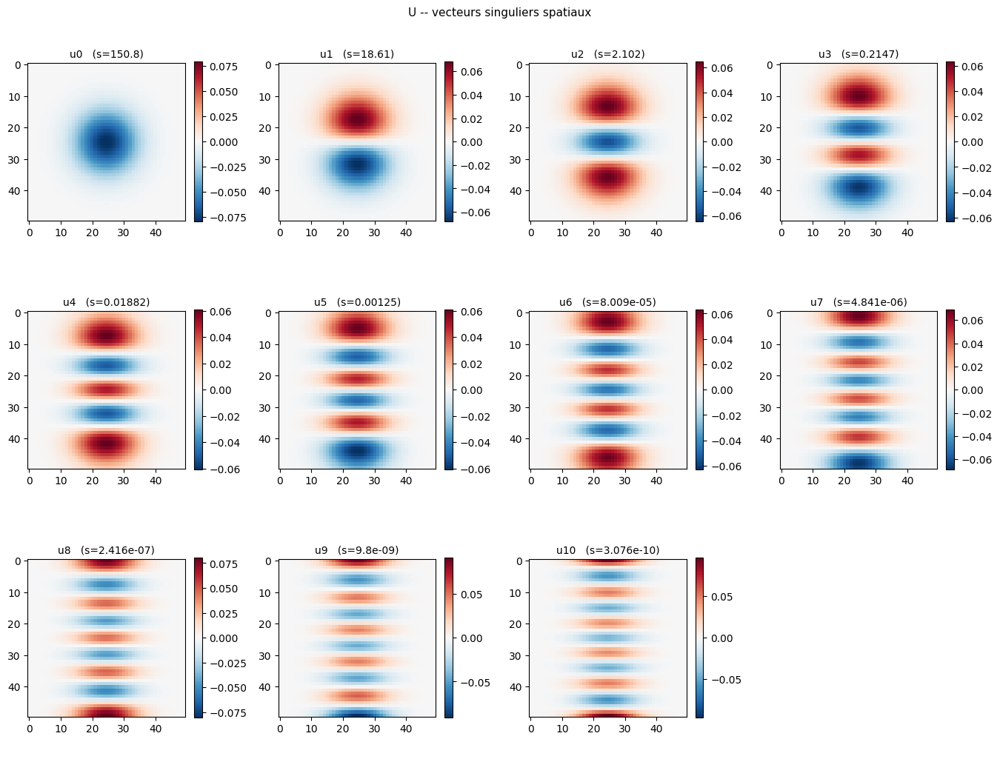

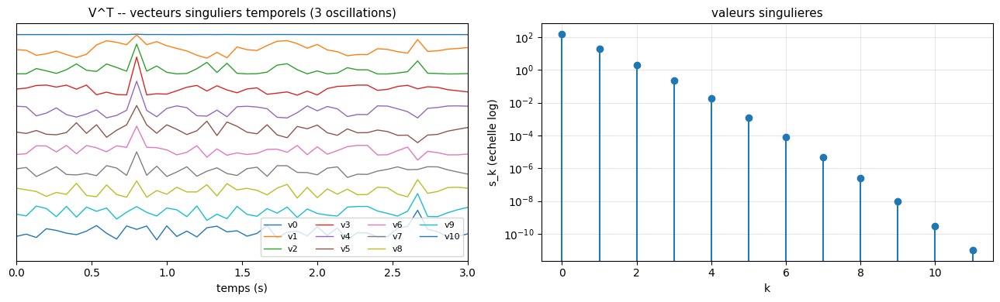

  vecteurs singuliers temporels :
    v0 : pic FFT  2.00 Hz, concentration 0.060, s/s0  1.0e+00, frequence instantanee  2.51 Hz (ecart-type 1.93), part continue 100.0%
    v1 : pic FFT  1.00 Hz, concentration 0.405, s/s0  1.2e-01, frequence instantanee  1.33 Hz (ecart-type 1.96), part continue 0.0%
    v2 : pic FFT  2.00 Hz, concentration 0.061, s/s0  1.4e-02, frequence instantanee  2.57 Hz (ecart-type 1.91), part continue 0.0%
    v3 : pic FFT  6.80 Hz, concentration 0.053, s/s0  1.4e-03, frequence instantanee  1.53 Hz (ecart-type 2.18), part continue 0.0%
    v4 : pic FFT  3.70 Hz, concentration 0.055, s/s0  1.2e-04, frequence instantanee  2.56 Hz (ecart-type 1.83), part continue 0.0%
    v5 : pic FFT  3.00 Hz, concentration 0.061, s/s0  8.3e-06, frequence instantanee  2.29 Hz (ecart-type 2.27), part continue 0.0%
    v6 : pic FFT  0.60 Hz, concentration 0.051, s/s0  5.3e-07, frequence instantanee  2.50 Hz (ecart-type 2.48), part continue 0.0%
    v7 : pic FFT  3.10 Hz, concentration

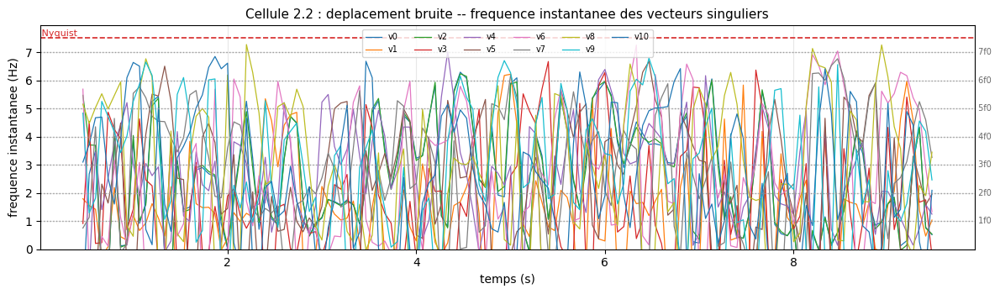


|correlation| des cartes u_k avec les derivees de l'image moyenne :
  u0 vs G         : 1.0000   (cellule 2.1 : 1.0000)
  u1 vs dG/dy     : 1.0000   (cellule 2.1 : 1.0000)
  u2 vs d2G/dy2   : 0.8692   (cellule 2.1 : 0.8688)

corr(v1, deplacement impose dy22)      = 0.9999
corr(v1, oscillation seule, sans bruit) = 0.6367
-> la composante 1 reconstruit fidelement le deplacement REEL ; comme ce
   deplacement est lui-meme bruite, elle herite du bruit. La SVD n'a
   aucun moyen de les separer : ils partagent la meme carte spatiale.

s1 / s0            = 0.1234
rms(dy) / (sigma sqrt(2)) = 0.1250   <- meme loi du 1er ordre qu'en 2.1
rang numerique : 8 sans bruit -> 11 avec bruit
   (le bruit elargit l'excursion du deplacement : il faut plus d'ordres
    de Taylor pour decrire la meme famille de gaussiennes translatees)

concentration spectrale des premiers vecteurs temporels :
  k |  2.1 (net)  |  2.2 (bruite)
  0 |    1.000    |    0.060
  1 |    1.000    |    0.405
  2 |    1.000    |    

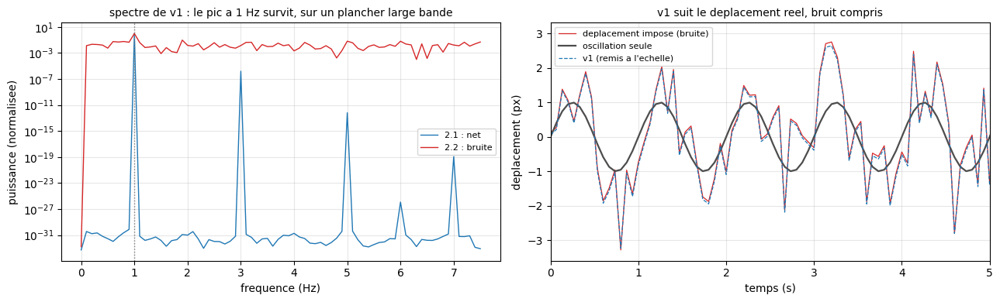

In [102]:
BRUIT_DEPL = 1.0                       # ecart-type du bruit, en pixels
rng22 = np.random.default_rng(0)

dy22 = dy + rng22.normal(0.0, BRUIT_DEPL, T2)
images22 = np.exp(
    -(
        ((yy[None] - CENTRE - dy22[:, None, None]) ** 2 + (xx[None] - CENTRE) ** 2)
        / (2 * SIGMA**2)
    )
)
A22 = images22.reshape(T2, -1).T

print(f"deplacement : rms sans bruit = {dy.std():.3f} px, "
      f"avec bruit = {dy22.std():.3f} px "
      f"(bruit seul : {BRUIT_DEPL:.1f} px)")

U22, S22, Vt22 = figures_svd_image(
    A22, "Cellule 2.2 : deplacement bruite", t2, images22, dy22
)

# --- 1. Les cartes spatiales n'ont pas bouge -------------------------------
# Une image bruitee en POSITION reste une gaussienne translatee : la famille
# {G, G', G'', ...} qui engendre les colonnes de A est exactement la meme.
G22 = A22.mean(axis=1).reshape(TAILLE, TAILLE)
e1 = np.gradient(G22, axis=0)
e2 = np.gradient(e1, axis=0)
print("\n|correlation| des cartes u_k avec les derivees de l'image moyenne :")
for k, (cible, nom) in enumerate(((G22, "G"), (e1, "dG/dy"), (e2, "d2G/dy2"))):
    print(f"  u{k} vs {nom:9s} : {correlation(U22[:, k], cible):.4f}   "
          f"(cellule 2.1 : {correlation(U21[:, k], (G_moy, d1, d2)[k]):.4f})")

# --- 2. ... et v1 est toujours le deplacement, bruit compris ---------------
print(f"\ncorr(v1, deplacement impose dy22)      = "
      f"{abs(np.corrcoef(Vt22[1], dy22)[0, 1]):.4f}")
print(f"corr(v1, oscillation seule, sans bruit) = "
      f"{abs(np.corrcoef(Vt22[1], dy)[0, 1]):.4f}")
print("-> la composante 1 reconstruit fidelement le deplacement REEL ; comme ce")
print("   deplacement est lui-meme bruite, elle herite du bruit. La SVD n'a")
print("   aucun moyen de les separer : ils partagent la meme carte spatiale.")

# --- 3. Ce que le bruit change : le spectre, pas la structure --------------
print(f"\ns1 / s0            = {S22[1] / S22[0]:.4f}")
print(f"rms(dy) / (sigma sqrt(2)) = {dy22.std() / (SIGMA * np.sqrt(2)):.4f}"
      "   <- meme loi du 1er ordre qu'en 2.1")
print(f"rang numerique : {np.linalg.matrix_rank(A21)} sans bruit -> "
      f"{np.linalg.matrix_rank(A22)} avec bruit")
print("   (le bruit elargit l'excursion du deplacement : il faut plus d'ordres")
print("    de Taylor pour decrire la meme famille de gaussiennes translatees)")

print("\nconcentration spectrale des premiers vecteurs temporels :")
print("  k |  2.1 (net)  |  2.2 (bruite)")
for k in range(4):
    c21 = np.abs(np.fft.rfft(Vt21[k] - Vt21[k].mean())) ** 2
    c22 = np.abs(np.fft.rfft(Vt22[k] - Vt22[k].mean())) ** 2
    print(f"  {k} |    {c21.max() / c21.sum():.3f}    |    {c22.max() / c22.sum():.3f}")

# --- 4. Le spectre de v1, avant et apres -----------------------------------
fig, axes = plt.subplots(1, 2, figsize=(13, 4.0))
for k, ax in ((1, axes[0]),):
    for Vt_, S_, nom, couleur in ((Vt21, S21, "2.1 : net", "C0"),
                                  (Vt22, S22, "2.2 : bruite", "C3")):
        p = np.abs(np.fft.rfft(Vt_[k] - Vt_[k].mean())) ** 2
        ax.semilogy(freqs21, p / p.max(), lw=1.0, color=couleur, label=nom)
    ax.axvline(F_OSC, color="0.5", ls=":", lw=1)
    ax.set_xlabel("frequence (Hz)"); ax.set_ylabel("puissance (normalisee)")
    ax.set_title("spectre de v1 : le pic a 1 Hz survit, "
                 "sur un plancher large bande", fontsize=10)
    ax.legend(fontsize=8); ax.grid(alpha=0.3)

axes[1].plot(t2, dy22, lw=0.9, color="C3", label="deplacement impose (bruite)")
axes[1].plot(t2, dy, lw=1.6, color="0.3", label="oscillation seule")
ech = Vt22[1] / Vt22[1].std() * dy22.std()
axes[1].plot(t2, ech * np.sign(np.corrcoef(Vt22[1], dy22)[0, 1]), lw=0.9, ls="--",
             color="C0", label="v1 (remis a l'echelle)")
axes[1].set_xlim(0, 5 / F_OSC)
axes[1].set_xlabel("temps (s)"); axes[1].set_ylabel("deplacement (px)")
axes[1].set_title("v1 suit le deplacement reel, bruit compris", fontsize=10)
axes[1].legend(fontsize=8); axes[1].grid(alpha=0.3)
fig.tight_layout()
plt.show()

## Cellule 2.3 -- fond + bruit d'image facon OCT

On reprend la cellule 2.1 (deplacement **propre**, sinusoide pure) et on abime
cette fois l'**image**, pas le mouvement. Deux ajouts, dans cet ordre :

1. **un fond** : `R = gaussienne + FOND`. Sans lui le speckle multiplicatif
   n'aurait rien a moduler la ou l'image est nulle, et le bruit disparaitrait
   du fond de l'image -- ce qui n'arrive jamais sur un B-scan.
2. **un speckle multiplicatif**, le bruit dominant en OCT : l'intensite
   observee est `R * s` ou `s` suit une loi gamma de moyenne 1 et de parametre
   `N_LOOKS` (contraste `1 / sqrt(N_LOOKS)`). `N_LOOKS = 1` est le speckle
   pleinement developpe (contraste 100 %), les valeurs superieures imitent le
   moyennage type ART. On ajoute enfin un petit plancher additif gaussien
   (bruit de detection).

**Simplification a garder en tete** : le speckle est tire independamment a
chaque image. Sur un vrai OCT il est deterministe pour une position donnee des
diffuseurs, donc correle d'une image a l'autre et solidaire du tissu qui bouge.
Ici il se comporte comme un bruit blanc temporel -- c'est le cas le plus
favorable a la SVD, pas le cas reel.

fond = 0.15, N_LOOKS = 4 -> contraste de speckle 0.50, plancher additif 0.02
rapport signal / bruit par pixel au pic : modulation du mouvement ~0.143 contre un speckle de contraste 0.50
Cellule 2.3 : fond + speckle OCT
  A : (2500, 150)   rang numerique = 150
  valeurs singulieres : [212.7082  14.8959  13.3843  13.0654  12.9505  12.7988]
  part d'energie      : [0.799735 0.003922 0.003166 0.003017 0.002964 0.002895]


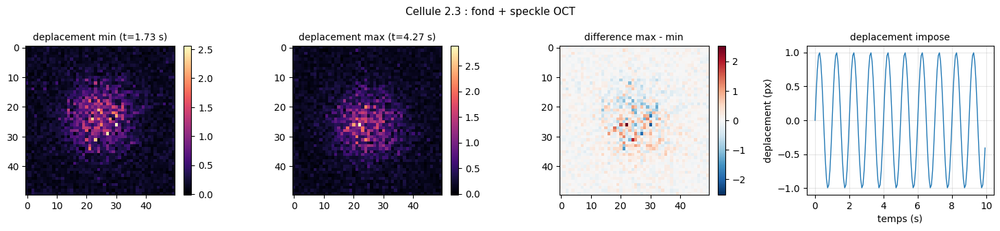

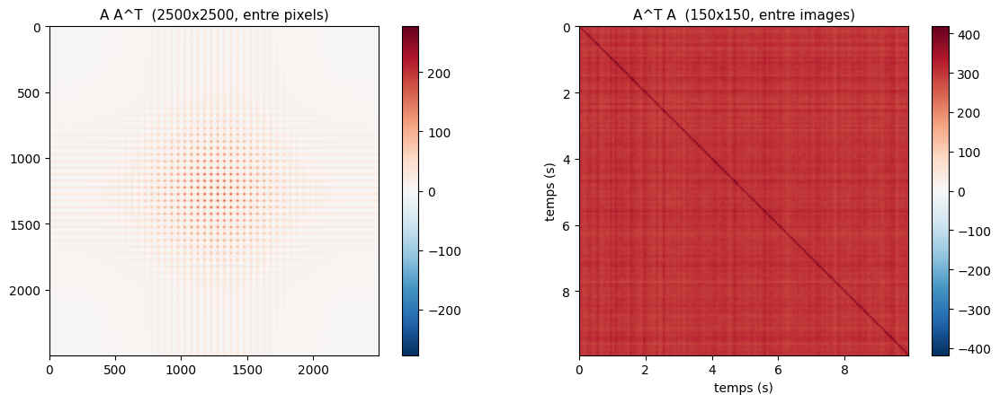

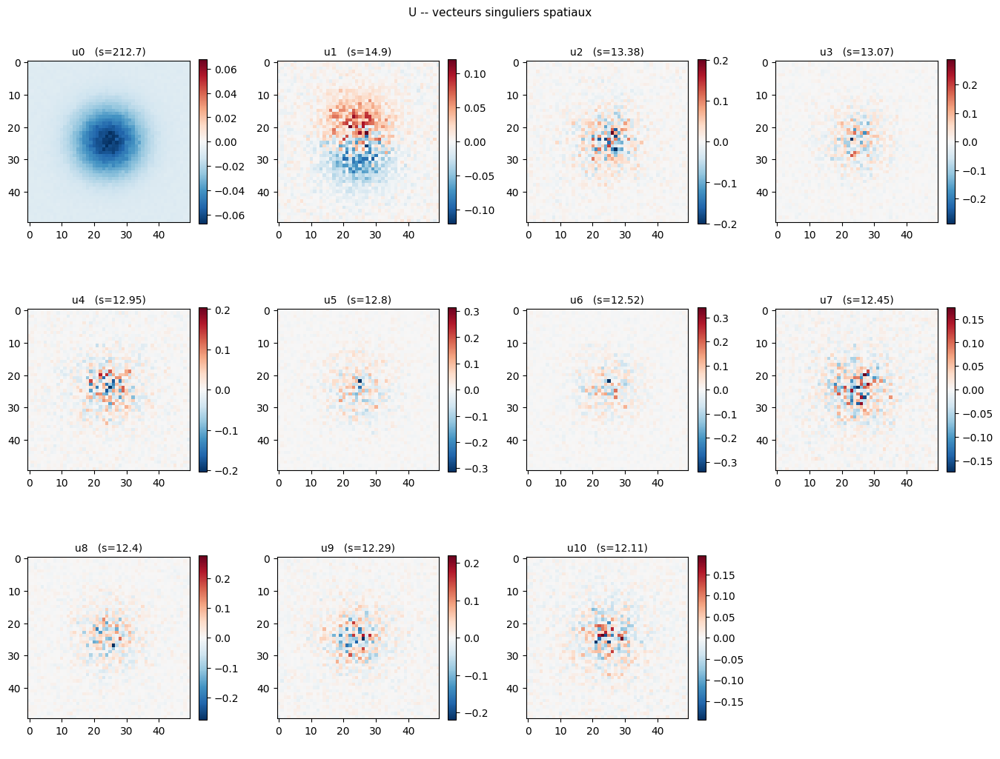

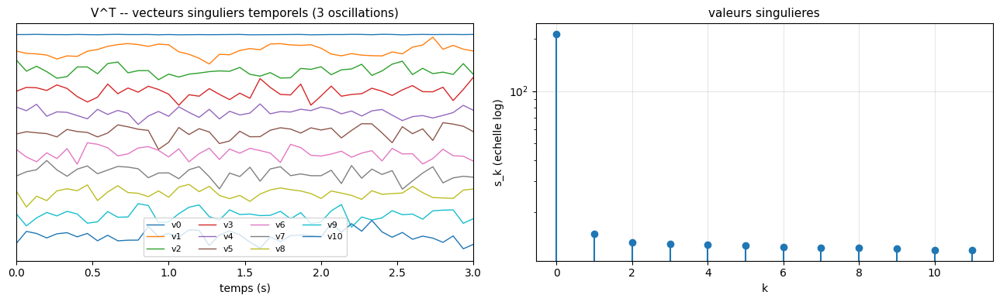

  vecteurs singuliers temporels :
    v0 : pic FFT  4.90 Hz, concentration 0.070, s/s0  1.0e+00, frequence instantanee  2.37 Hz (ecart-type 2.21), part continue 100.0%
    v1 : pic FFT  1.00 Hz, concentration 0.798, s/s0  7.0e-02, frequence instantanee  1.01 Hz (ecart-type 0.67), part continue 0.0%
    v2 : pic FFT  6.80 Hz, concentration 0.067, s/s0  6.3e-02, frequence instantanee  2.49 Hz (ecart-type 2.28), part continue 0.0%
    v3 : pic FFT  3.40 Hz, concentration 0.061, s/s0  6.1e-02, frequence instantanee  2.21 Hz (ecart-type 2.53), part continue 0.0%
    v4 : pic FFT  2.10 Hz, concentration 0.044, s/s0  6.1e-02, frequence instantanee  2.39 Hz (ecart-type 2.41), part continue 0.0%
    v5 : pic FFT  1.90 Hz, concentration 0.071, s/s0  6.0e-02, frequence instantanee  2.25 Hz (ecart-type 2.45), part continue 0.0%
    v6 : pic FFT  4.00 Hz, concentration 0.066, s/s0  5.9e-02, frequence instantanee  3.04 Hz (ecart-type 2.19), part continue 0.0%
    v7 : pic FFT  7.40 Hz, concentration

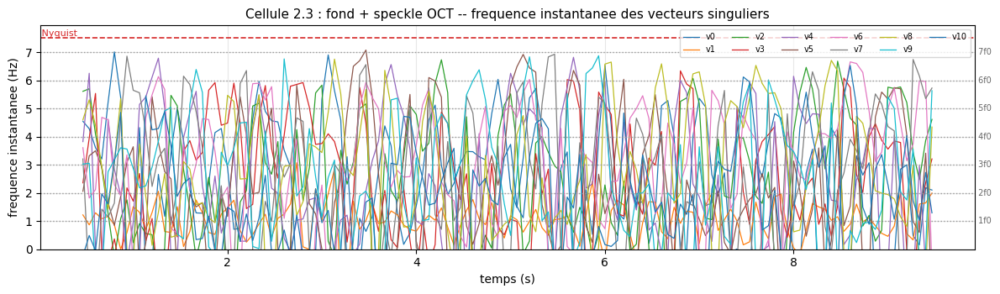


|correlation| des cartes u_k avec l'image moyenne et sa derivee :
  u0 vs G     : 1.0000   (2.1 : 1.0000)
  u1 vs dG/dy : 0.7077   (2.1 : 1.0000)

corr(v1, deplacement impose) = 0.8902

valeurs singulieres :
  2.1 (net)    : [1.516e+02 1.081e+01 3.866e-01 1.127e-02 2.838e-04 6.345e-06]
  2.3 (bruite) : [212.708  14.896  13.384  13.065  12.95   12.799]
  -> en 2.1 elles decroissent d'un facteur ~30 a chaque rang ;
     ici, apres s1, elles forment un plateau : c'est le bruit.

N_LOOKS | contraste | s1 (mouvement) | s1 (immobile) | marge | corr(v1, dy) | concentration
    1   |   1.00    |      27.31     |     27.32     | 1.00x |    0.114     |     0.046
    2   |   0.71    |      19.73     |     19.79     | 1.00x |    0.045     |     0.073
    4   |   0.50    |      14.90     |     13.43     | 1.11x |    0.890     |     0.798  <-- N_LOOKS retenu
    8   |   0.35    |      12.48     |      9.59     | 1.30x |    0.940     |     0.887
   16   |   0.25    |      11.93     |      6.82     |

In [ ]:
FOND = 0.15               # niveau de fond, en fraction du pic de la gaussienne
N_LOOKS = 4               # speckle : contraste = 1 / sqrt(N_LOOKS) = 0.50
BRUIT_ADDITIF = 0.02      # plancher additif (bruit de detection)


def cube_bruite(deplacement, n_looks=N_LOOKS, graine=1, fond=FOND,
                additif=BRUIT_ADDITIF):
    """Cube d'images : gaussienne translatee + fond, speckle multiplicatif."""
    rng = np.random.default_rng(graine)
    R = np.exp(
        -(
            ((yy[None] - CENTRE - deplacement[:, None, None]) ** 2
             + (xx[None] - CENTRE) ** 2)
            / (2 * SIGMA**2)
        )
    ) + fond
    speckle = rng.gamma(n_looks, 1.0 / n_looks, R.shape)   # moyenne 1
    return R * speckle + rng.normal(0.0, additif, R.shape)


images23 = cube_bruite(dy)
A23 = images23.reshape(T2, -1).T

print(f"fond = {FOND}, N_LOOKS = {N_LOOKS} -> contraste de speckle "
      f"{1 / np.sqrt(N_LOOKS):.2f}, plancher additif {BRUIT_ADDITIF}")
print(f"rapport signal / bruit par pixel au pic : modulation du mouvement "
      f"~{(DEPL_TOTAL / 2) / SIGMA:.3f} contre un speckle de contraste "
      f"{1 / np.sqrt(N_LOOKS):.2f}")

U23, S23, Vt23 = figures_svd_image(
    A23, "Cellule 2.3 : fond + speckle OCT", t2, images23, dy
)

# --- 1. Ce qui reste identifiable ------------------------------------------
G23 = A23.mean(axis=1).reshape(TAILLE, TAILLE)
g1 = np.gradient(G23, axis=0)
print("\n|correlation| des cartes u_k avec l'image moyenne et sa derivee :")
print(f"  u0 vs G     : {correlation(U23[:, 0], G23):.4f}   (2.1 : "
      f"{correlation(U21[:, 0], G_moy):.4f})")
print(f"  u1 vs dG/dy : {correlation(U23[:, 1], g1):.4f}   (2.1 : "
      f"{correlation(U21[:, 1], d1):.4f})")
print(f"\ncorr(v1, deplacement impose) = {abs(np.corrcoef(Vt23[1], dy)[0, 1]):.4f}")

# --- 2. Le bruit ne fait plus une composante : il fait un PLATEAU ----------
# Le speckle est blanc en temps et en espace : il ne se concentre nulle part,
# il remplit toutes les directions a peu pres egalement. D'ou un "bulk" de
# valeurs singulieres toutes semblables, sur lequel le signal doit depasser.
print("\nvaleurs singulieres :")
print(f"  2.1 (net)    : {np.array2string(S21[:6], precision=3)}")
print(f"  2.3 (bruite) : {np.array2string(S23[:6], precision=3)}")
print("  -> en 2.1 elles decroissent d'un facteur ~30 a chaque rang ;")
print("     ici, apres s1, elles forment un plateau : c'est le bruit.")

# --- 3. Seuil de detection : comparer au MEME bruit sans mouvement ---------
# Le bon test n'est pas "s1 est-elle grande" mais "s1 est-elle plus grande que
# ce que le bruit seul produirait". On refait donc le calcul avec une
# gaussienne parfaitement immobile et le meme speckle.
print("\nN_LOOKS | contraste | s1 (mouvement) | s1 (immobile) | marge | "
      "corr(v1, dy) | concentration")
immobile = np.zeros(T2)
for L in (1, 2, 4, 8, 16):
    # .reshape(T2, -1).T : sans cela on passerait un cube 3-D a np.linalg.svd,
    # qui le traiterait comme une PILE de matrices 50x50, une par image.
    A_L = cube_bruite(dy, n_looks=L).reshape(T2, -1).T
    A_0 = cube_bruite(immobile, n_looks=L).reshape(T2, -1).T
    S_L = np.linalg.svd(A_L, compute_uv=False)
    S_0 = np.linalg.svd(A_0, compute_uv=False)
    _, _, Vt_L = np.linalg.svd(A_L, full_matrices=False)
    p = np.abs(np.fft.rfft(Vt_L[1] - Vt_L[1].mean())) ** 2
    marque = "  <-- N_LOOKS retenu" if L == N_LOOKS else ""
    print(f"   {L:2d}   |   {1 / np.sqrt(L):.2f}    |     {S_L[1]:6.2f}     |"
          f"    {S_0[1]:6.2f}     | {S_L[1] / S_0[1]:.2f}x |    {abs(np.corrcoef(Vt_L[1], dy)[0, 1]):.3f}     "
          f"|     {p.max() / p.sum():.3f}{marque}")
print("-> en dessous d'une marge de ~1.1x le mouvement est indiscernable du")
print("   bruit : v1 n'a plus rien a voir avec dy. Le speckle pleinement")
print("   developpe (N_LOOKS = 1) enterre completement un deplacement de 1 px.")

## Cellule 2.4 -- les deux bruits ensemble

Le deplacement est bruite (cellule 2.2) **et** l'image est bruitee (cellule
2.3). Les deux degradations n'attaquent pas la meme chose, et la comparaison
finale des quatre cellules le montre directement.

Cellule 2.4 : deplacement bruite + image bruitee
  A : (2500, 150)   rang numerique = 150
  valeurs singulieres : [212.1838  21.245   13.3584  13.0277  12.9005  12.7775]
  part d'energie      : [0.795336 0.007973 0.003152 0.002998 0.00294  0.002884]


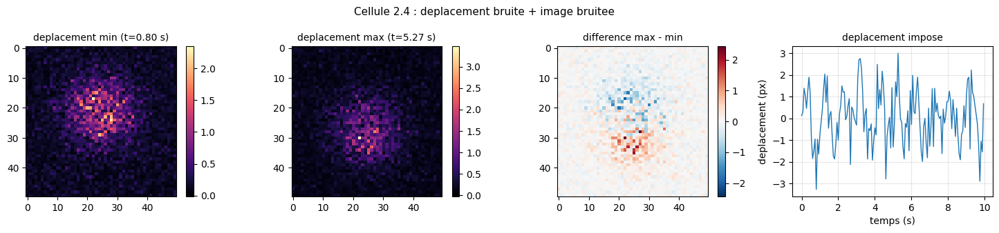

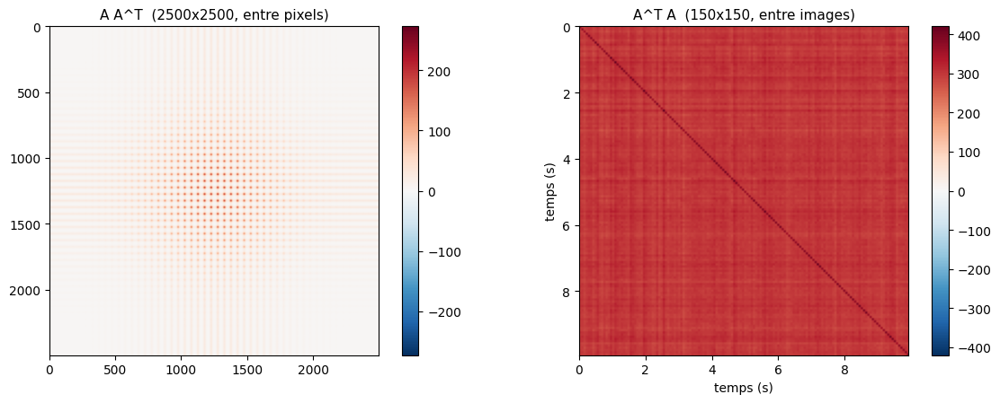

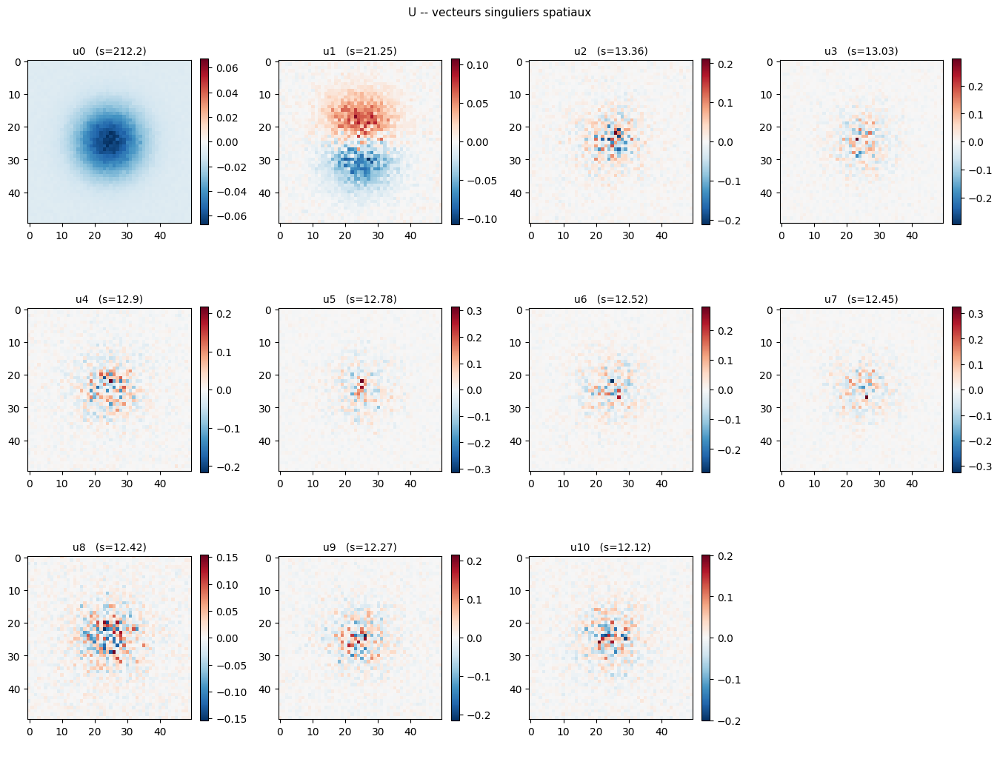

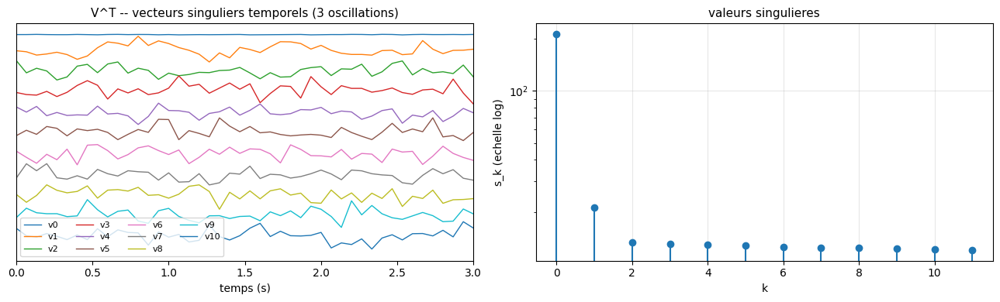

  vecteurs singuliers temporels :
    v0 : pic FFT  4.90 Hz, concentration 0.070, s/s0  1.0e+00, frequence instantanee  2.15 Hz (ecart-type 2.10), part continue 100.0%
    v1 : pic FFT  1.00 Hz, concentration 0.389, s/s0  1.0e-01, frequence instantanee  1.67 Hz (ecart-type 2.11), part continue 0.0%
    v2 : pic FFT  4.80 Hz, concentration 0.069, s/s0  6.3e-02, frequence instantanee  2.50 Hz (ecart-type 2.20), part continue 0.0%
    v3 : pic FFT  0.20 Hz, concentration 0.066, s/s0  6.1e-02, frequence instantanee  2.10 Hz (ecart-type 2.52), part continue 0.0%
    v4 : pic FFT  2.10 Hz, concentration 0.071, s/s0  6.1e-02, frequence instantanee  2.61 Hz (ecart-type 2.14), part continue 0.0%
    v5 : pic FFT  1.90 Hz, concentration 0.086, s/s0  6.0e-02, frequence instantanee  2.17 Hz (ecart-type 2.21), part continue 0.0%
    v6 : pic FFT  4.00 Hz, concentration 0.092, s/s0  5.9e-02, frequence instantanee  2.98 Hz (ecart-type 2.12), part continue 0.0%
    v7 : pic FFT  1.60 Hz, concentration

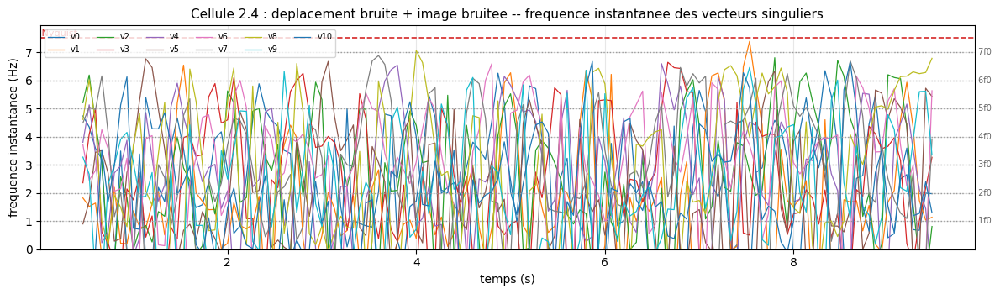


cas                | s1/s0  | u1 vs dG/dy | v1 vs depl. reel | v1 vs sinus | conc(v1) | pic v1
2.1 net            | 0.0713 |    1.0000   |      1.0000      |   1.0000    |  1.000   | 1.00 Hz
2.2 depl. bruite   | 0.1234 |    1.0000   |      0.9999      |   0.6367    |  0.405   | 1.00 Hz
2.3 image bruitee  | 0.0700 |    0.7077   |      0.8902      |   0.8902    |  0.798   | 1.00 Hz
2.4 les deux       | 0.1001 |    0.8408   |      0.9742      |   0.6256    |  0.389   | 1.00 Hz


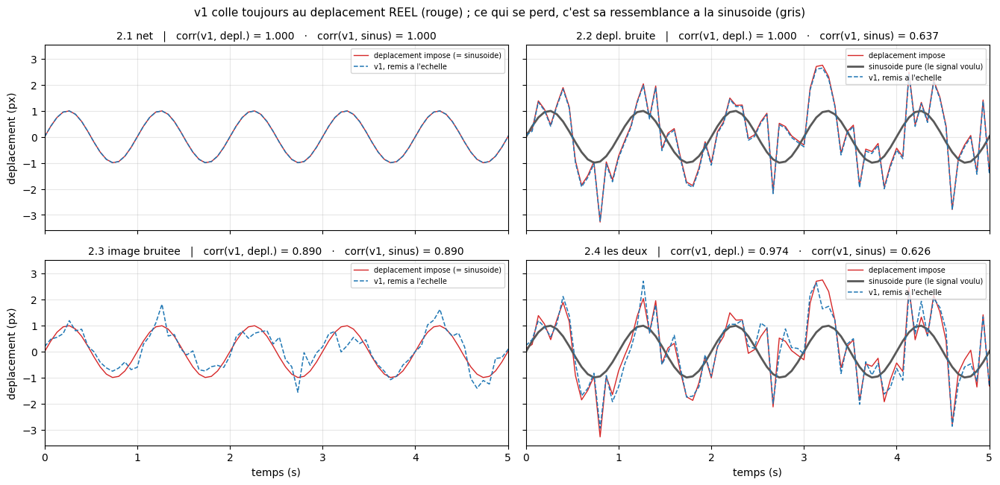

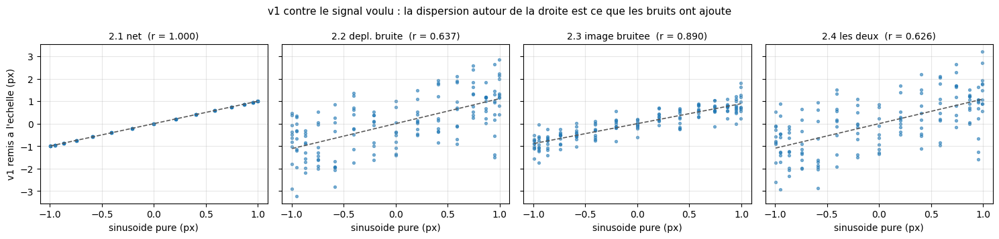

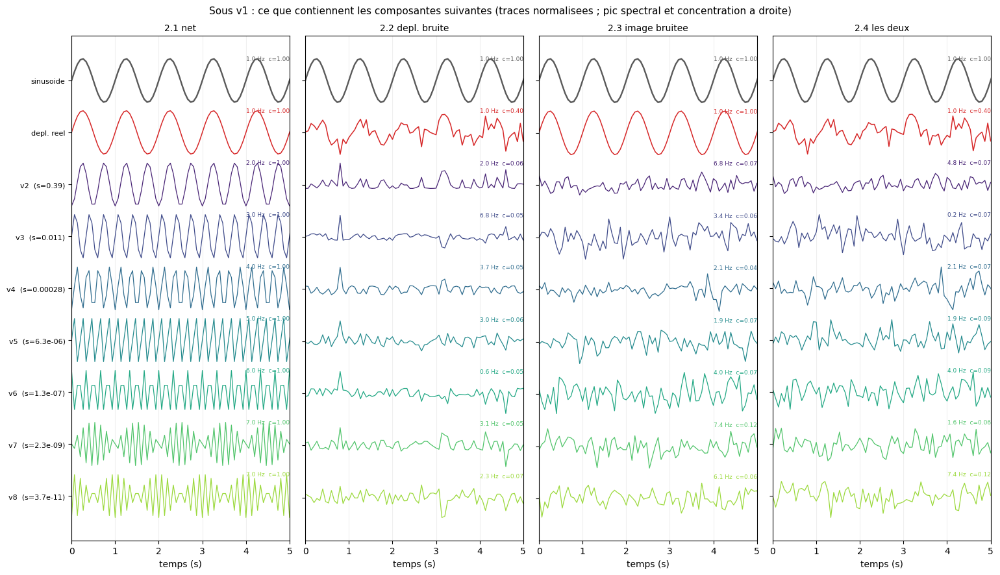


Lecture des colonnes :

* `u1 vs dG/dy` -- la CARTE spatiale. Le bruit de deplacement ne l'abime pas du
  tout (2.2 : 1.0000) : une gaussienne bougee au hasard reste une gaussienne
  bougee. Le bruit d'image, lui, la degrade (2.3), parce que le speckle
  contamine directement les pixels.
* `v1 vs depl. reel` -- la SVD retrouve toujours le deplacement REELLEMENT
  impose, quel qu'il soit.
* `v1 vs sinus` -- mais ce deplacement reel n'est plus le signal voulu des
  qu'on l'a bruite (2.2 et 2.4). C'est la colonne qui compte, et c'est celle
  qui s'effondre.
* `conc(v1)` -- la concentration spectrale chute dans les trois cas bruites,
  et c'est le seul indicateur disponible quand on n'a pas la verite terrain :
  c'est exactement le critere `min_concentration` de la production.

Le point a retenir des cellules 2.2 a 2.4 : la SVD trie par MOTIF SPATIAL. Tout
ce qui partage la carte du signal (ici : n'importe quel deplacement vertical)
tombe dans la meme composante et ne peut plus en etre ex

In [104]:
rng24 = np.random.default_rng(0)
dy24 = dy + rng24.normal(0.0, BRUIT_DEPL, T2)     # meme bruit de deplacement qu'en 2.2
images24 = cube_bruite(dy24)                      # meme bruit d'image qu'en 2.3
A24 = images24.reshape(T2, -1).T

U24, S24, Vt24 = figures_svd_image(
    A24, "Cellule 2.4 : deplacement bruite + image bruitee", t2, images24, dy24
)

G24 = A24.mean(axis=1).reshape(TAILLE, TAILLE)
h1 = np.gradient(G24, axis=0)

# --- Comparaison des quatre cellules ---------------------------------------
def concentration_de(v):
    p = np.abs(np.fft.rfft(v - v.mean())) ** 2
    return p.max() / p.sum(), freqs21[p.argmax()]


cas = (
    ("2.1 net           ", S21, U21, Vt21, G_moy, d1, dy, dy),
    ("2.2 depl. bruite  ", S22, U22, Vt22, G22, e1, dy22, dy),
    ("2.3 image bruitee ", S23, U23, Vt23, G23, g1, dy, dy),
    ("2.4 les deux      ", S24, U24, Vt24, G24, h1, dy24, dy),
)

print("\ncas                | s1/s0  | u1 vs dG/dy | v1 vs depl. reel | "
      "v1 vs sinus | conc(v1) | pic v1")
for nom, S_, U_, Vt_, G_, dG_, depl_, sinus_ in cas:
    conc, pic = concentration_de(Vt_[1])
    print(f"{nom} | {S_[1] / S_[0]:.4f} |    {correlation(U_[:, 1], dG_):.4f}   |"
          f"      {abs(np.corrcoef(Vt_[1], depl_)[0, 1]):.4f}      |"
          f"   {abs(np.corrcoef(Vt_[1], sinus_)[0, 1]):.4f}    |  {conc:.3f}   | {pic:.2f} Hz")

# --- v1 face au deplacement reel et a la sinusoide, pour les 4 cas ---------
# v1 est de norme 1 : on le remet a l'echelle du deplacement (meme ecart-type)
# et on fixe son signe, arbitraire, sur le deplacement reellement impose.
fig, axes = plt.subplots(2, 2, figsize=(13.5, 6.6), sharex=True, sharey=True)
for ax, (nom, S_, U_, Vt_, G_, dG_, depl_, sinus_) in zip(axes.ravel(), cas):
    signe = np.sign(np.corrcoef(Vt_[1], depl_)[0, 1])
    v1_px = signe * Vt_[1] / Vt_[1].std() * depl_.std()
    c_depl = abs(np.corrcoef(Vt_[1], depl_)[0, 1])
    c_sin = abs(np.corrcoef(Vt_[1], sinus_)[0, 1])

    identiques = np.allclose(depl_, sinus_)
    ax.plot(t2, depl_, lw=1.0, color="C3",
            label="deplacement impose" + (" (= sinusoide)" if identiques else ""))
    if not identiques:
        ax.plot(t2, sinus_, lw=2.0, color="0.35", label="sinusoide pure (le signal voulu)")
    ax.plot(t2, v1_px, lw=1.1, ls="--", color="C0", label="v1, remis a l'echelle")
    ax.set_title(f"{nom.strip()}   |   corr(v1, depl.) = {c_depl:.3f}   ·   "
                 f"corr(v1, sinus) = {c_sin:.3f}", fontsize=10)
    ax.grid(alpha=0.3)
    ax.legend(fontsize=7, loc="upper right")
for ax in axes[1]:
    ax.set_xlabel("temps (s)")
for ax in axes[:, 0]:
    ax.set_ylabel("deplacement (px)")
axes[0, 0].set_xlim(0, 5 / F_OSC)
fig.suptitle("v1 colle toujours au deplacement REEL (rouge) ; ce qui se perd, "
             "c'est sa ressemblance a la sinusoide (gris)", fontsize=11)
fig.tight_layout()
plt.show()

# Meme information, sans l'axe du temps : v1 en fonction de la sinusoide.
fig, axes = plt.subplots(1, 4, figsize=(15, 3.6), sharex=True, sharey=True)
for ax, (nom, S_, U_, Vt_, G_, dG_, depl_, sinus_) in zip(axes, cas):
    signe = np.sign(np.corrcoef(Vt_[1], depl_)[0, 1])
    v1_px = signe * Vt_[1] / Vt_[1].std() * depl_.std()
    ax.scatter(sinus_, v1_px, s=8, alpha=0.55, color="C0")
    # Droite des moindres carres de v1 sur la sinusoide : sa pente n'a pas de
    # valeur attendue (v1 est mis a l'echelle du deplacement reel, pas de la
    # sinusoide) -- c'est la DISPERSION autour d'elle qui se lit.
    pente, ordonnee = np.polyfit(sinus_, v1_px, 1)
    lim = np.array([sinus_.min(), sinus_.max()])
    ax.plot(lim, pente * lim + ordonnee, color="0.35", lw=1.2, ls="--")
    ax.set_title(f"{nom.strip()}  (r = {abs(np.corrcoef(sinus_, v1_px)[0, 1]):.3f})",
                 fontsize=10)
    ax.set_xlabel("sinusoide pure (px)")
    ax.grid(alpha=0.3)
axes[0].set_ylabel("v1 remis a l'echelle (px)")
fig.suptitle("v1 contre le signal voulu : la dispersion autour de la droite "
             "est ce que les bruits ont ajoute", fontsize=11)
fig.tight_layout()
plt.show()

# --- Et en dessous de v1 : les composantes suivantes -----------------------
# Chaque trace est normalisee par son propre maximum (les valeurs singulieres
# s'etalent sur plusieurs ordres de grandeur), et annotee de son pic spectral
# et de sa concentration `c`. Les deux premieres lignes sont les references.
N_EMPILE = 8          # affiche v2 .. v8
DECALAGE = 2.4

fig, axes = plt.subplots(1, len(cas), figsize=(15.5, 9.0), sharex=True)
for col, (ax, (nom, S_, U_, Vt_, G_, dG_, depl_, sinus_)) in enumerate(zip(axes, cas)):
    lignes = [("sinusoide", sinus_, "0.35", 1.7),
              ("depl. reel", depl_, "C3", 1.1)]
    couleurs = plt.cm.viridis(np.linspace(0.1, 0.85, N_EMPILE - 1))
    for j, k in enumerate(range(2, N_EMPILE + 1)):
        lignes.append((f"v{k}  (s={S_[k]:.2g})", Vt_[k], couleurs[j], 0.9))

    for j, (etiq, y, coul, epaisseur) in enumerate(lignes):
        y_norm = y / np.abs(y).max()
        ax.plot(t2, y_norm - DECALAGE * j, lw=epaisseur, color=coul)
        p = np.abs(np.fft.rfft(y - y.mean())) ** 2
        ax.text(5 / F_OSC, -DECALAGE * j + 1.0,
                f"{freqs21[p.argmax()]:.1f} Hz  c={p.max() / p.sum():.2f}",
                fontsize=6.5, color=coul, ha="right", va="center")

    ax.set_yticks(-DECALAGE * np.arange(len(lignes)),
                  [e for e in ([l[0] for l in lignes] if col == 0 else [""] * len(lignes))],
                  fontsize=8)
    ax.set_title(nom.strip(), fontsize=10)
    ax.set_xlabel("temps (s)")
    ax.set_xlim(0, 5 / F_OSC)
    ax.grid(alpha=0.2, axis="x")
fig.suptitle("Sous v1 : ce que contiennent les composantes suivantes "
             "(traces normalisees ; pic spectral et concentration a droite)",
             fontsize=11)
fig.tight_layout()
plt.show()

print("""
Lecture des colonnes :

* `u1 vs dG/dy` -- la CARTE spatiale. Le bruit de deplacement ne l'abime pas du
  tout (2.2 : 1.0000) : une gaussienne bougee au hasard reste une gaussienne
  bougee. Le bruit d'image, lui, la degrade (2.3), parce que le speckle
  contamine directement les pixels.
* `v1 vs depl. reel` -- la SVD retrouve toujours le deplacement REELLEMENT
  impose, quel qu'il soit.
* `v1 vs sinus` -- mais ce deplacement reel n'est plus le signal voulu des
  qu'on l'a bruite (2.2 et 2.4). C'est la colonne qui compte, et c'est celle
  qui s'effondre.
* `conc(v1)` -- la concentration spectrale chute dans les trois cas bruites,
  et c'est le seul indicateur disponible quand on n'a pas la verite terrain :
  c'est exactement le critere `min_concentration` de la production.

Le point a retenir des cellules 2.2 a 2.4 : la SVD trie par MOTIF SPATIAL. Tout
ce qui partage la carte du signal (ici : n'importe quel deplacement vertical)
tombe dans la meme composante et ne peut plus en etre extrait par une
troncature de rang. Ce qui les separe encore est TEMPOREL -- d'ou le fait que
la chaine de production ne s'arrete pas a la SVD mais optimise ensuite une
combinaison sur un critere spectral.
""")

## Cellule 2.5 -- phase initiale et frequence qui derive

Derniere complication, et la plus proche du cas reel : le mouvement n'est plus
une sinusoide de frequence fixe mais

```
dy(t) = 1 px * sin( 2 pi INTEGRALE f(t') dt'  +  pi/3 )      f : 1.0 Hz -> 1.3 Hz
```

soit une phase initiale de `pi/3` et une frequence qui derive lineairement de
1.0 a 1.3 Hz sur les 10 s -- l'equivalent d'un rythme cardiaque qui change
pendant l'acquisition.

La cellule fait tourner **deux** versions : le chirp seul (pour isoler l'effet
de la derive) et le chirp avec les deux bruits de la cellule 2.4.

f : 1.0 -> 1.3 Hz (11.6 cycles), phase initiale = 1.047 rad = 60 deg
Cellule 2.5a : chirp 1.0->1.3 Hz, sans bruit
  A : (2500, 150)   rang numerique = 8
  valeurs singulieres : [1.5157e+02 1.0818e+01 3.8669e-01 1.1266e-02 2.8352e-04 6.3291e-06]
  part d'energie      : [9.949256e-01 5.067914e-03 6.475727e-06 5.496927e-09 3.481101e-12
 1.734802e-15]


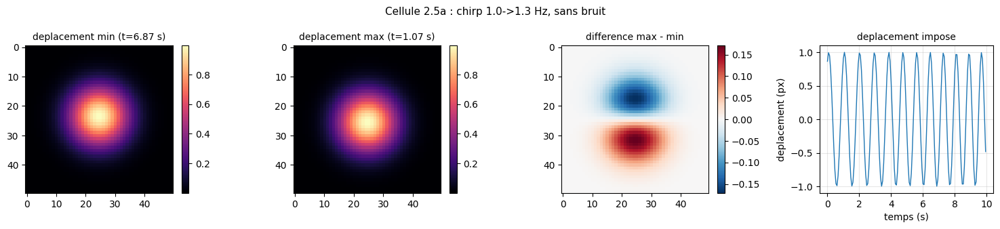

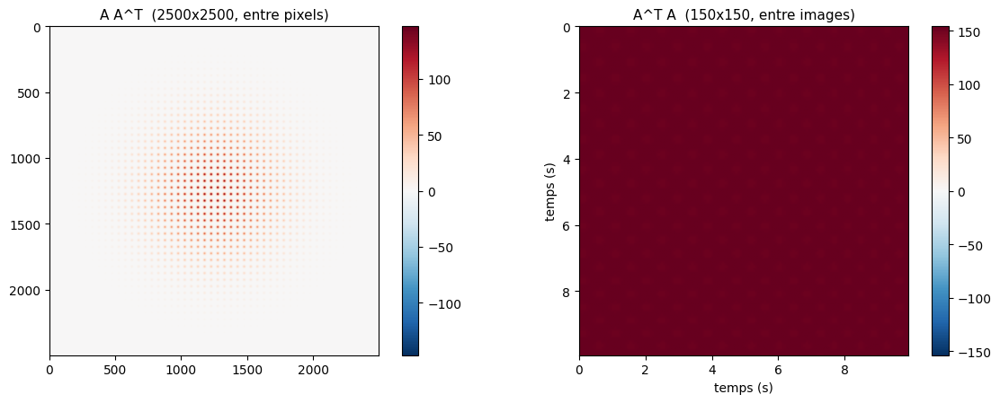

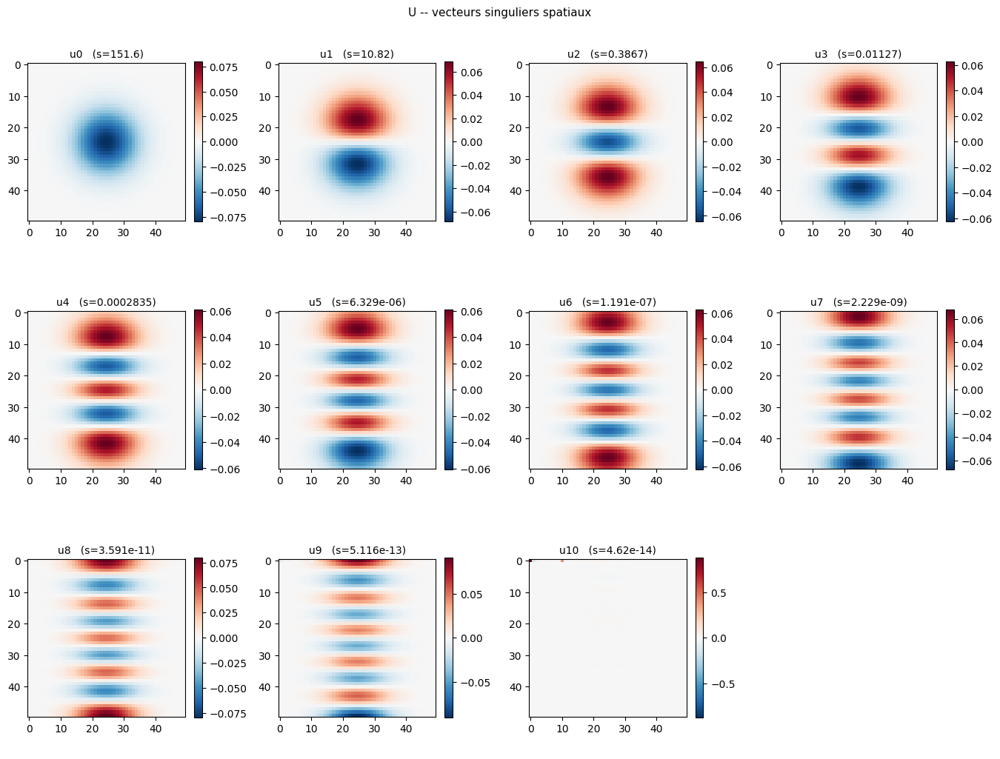

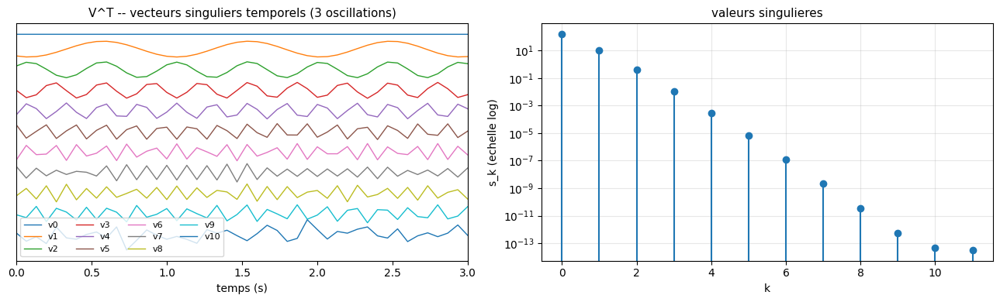

  vecteurs singuliers temporels :
    v0 : pic FFT  2.40 Hz, concentration 0.262, s/s0  1.0e+00, frequence instantanee  2.30 Hz (ecart-type 0.17), part continue 100.0%
    v1 : pic FFT  1.10 Hz, concentration 0.344, s/s0  7.1e-02, frequence instantanee  1.15 Hz (ecart-type 0.08), part continue 0.0%
    v2 : pic FFT  2.40 Hz, concentration 0.264, s/s0  2.6e-03, frequence instantanee  2.30 Hz (ecart-type 0.16), part continue 0.0%
    v3 : pic FFT  3.60 Hz, concentration 0.126, s/s0  7.4e-05, frequence instantanee  3.45 Hz (ecart-type 0.24), part continue 0.0%
    v4 : pic FFT  4.90 Hz, concentration 0.126, s/s0  1.9e-06, frequence instantanee  4.60 Hz (ecart-type 0.31), part continue 0.0%
    v5 : pic FFT  5.30 Hz, concentration 0.088, s/s0  4.2e-08, frequence instantanee  5.75 Hz (ecart-type 0.40), part continue 0.0%
    v6 : pic FFT  7.10 Hz, concentration 0.126, s/s0  7.9e-10, frequence instantanee  5.80 Hz (ecart-type 3.11), part continue 0.0%
    v7 : pic FFT  7.50 Hz, concentration

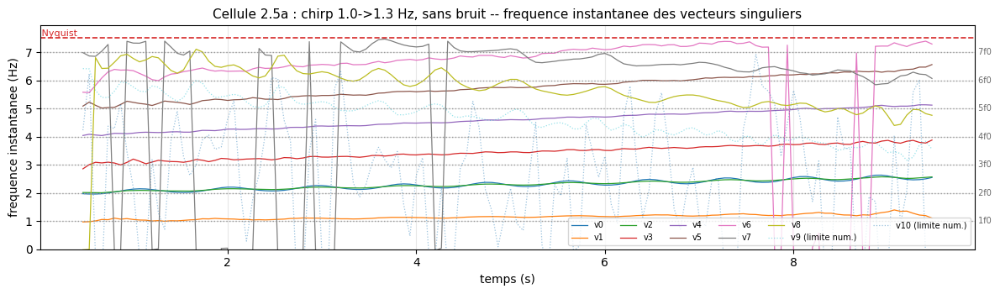

Cellule 2.5b : chirp + les deux bruits
  A : (2500, 150)   rang numerique = 150
  valeurs singulieres : [212.2688  19.5696  13.372   13.0588  12.9208  12.8349]
  part d'energie      : [0.796471 0.00677  0.003161 0.003014 0.002951 0.002912]


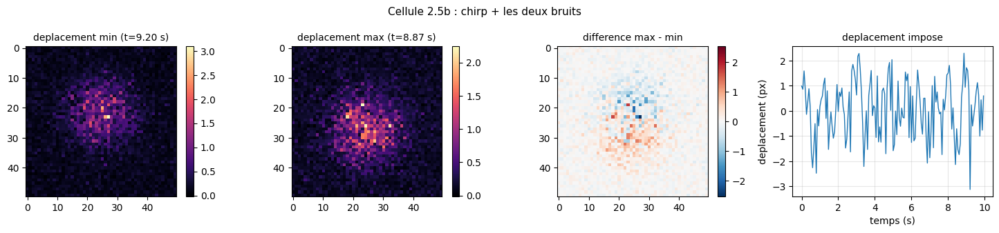

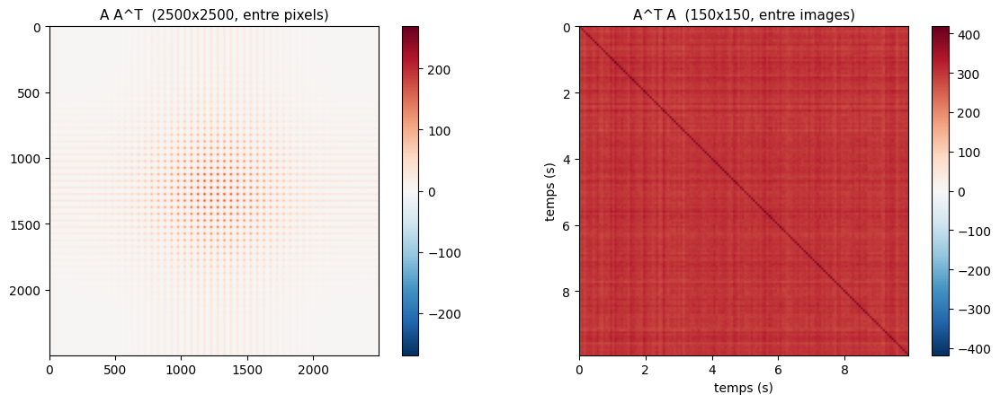

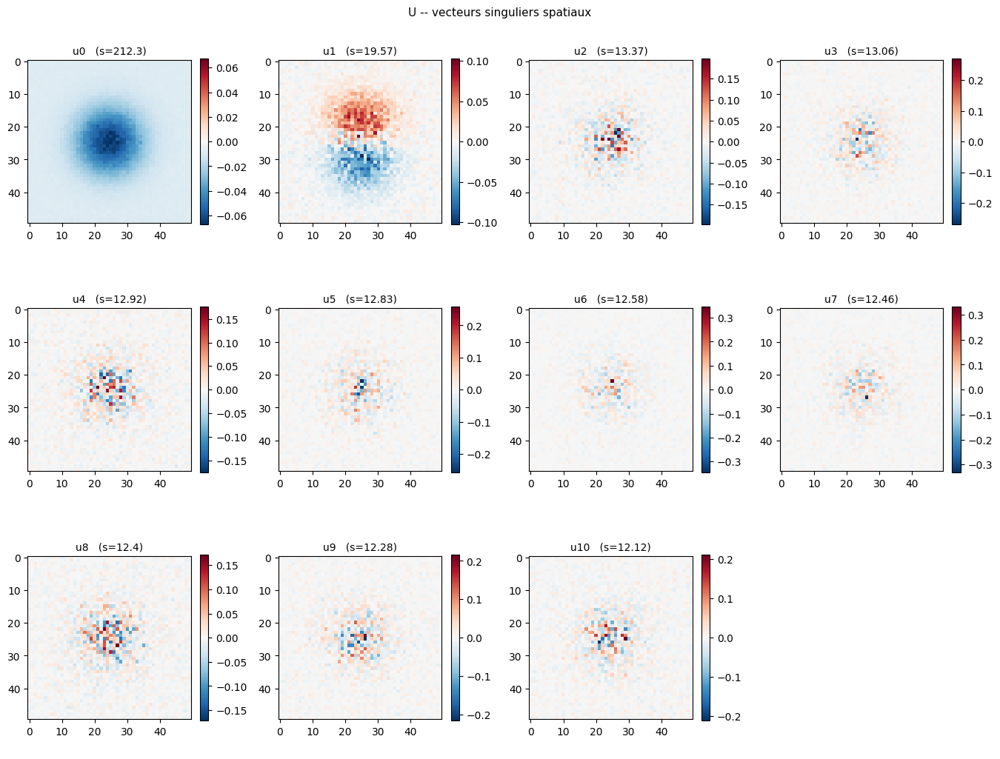

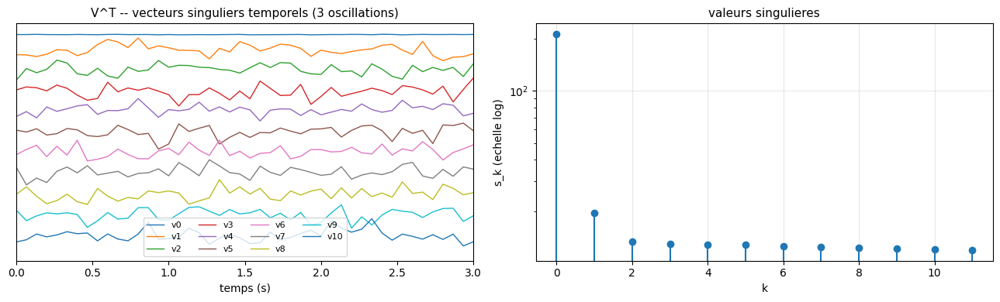

  vecteurs singuliers temporels :
    v0 : pic FFT  4.80 Hz, concentration 0.068, s/s0  1.0e+00, frequence instantanee  2.37 Hz (ecart-type 2.12), part continue 100.0%
    v1 : pic FFT  1.20 Hz, concentration 0.111, s/s0  9.2e-02, frequence instantanee  1.61 Hz (ecart-type 1.86), part continue 0.0%
    v2 : pic FFT  6.80 Hz, concentration 0.069, s/s0  6.3e-02, frequence instantanee  2.61 Hz (ecart-type 2.37), part continue 0.0%
    v3 : pic FFT  0.20 Hz, concentration 0.053, s/s0  6.2e-02, frequence instantanee  2.43 Hz (ecart-type 2.38), part continue 0.0%
    v4 : pic FFT  4.80 Hz, concentration 0.054, s/s0  6.1e-02, frequence instantanee  2.28 Hz (ecart-type 2.33), part continue 0.0%
    v5 : pic FFT  1.90 Hz, concentration 0.080, s/s0  6.0e-02, frequence instantanee  1.97 Hz (ecart-type 2.26), part continue 0.0%
    v6 : pic FFT  5.20 Hz, concentration 0.061, s/s0  5.9e-02, frequence instantanee  3.21 Hz (ecart-type 2.06), part continue 0.0%
    v7 : pic FFT  1.60 Hz, concentration

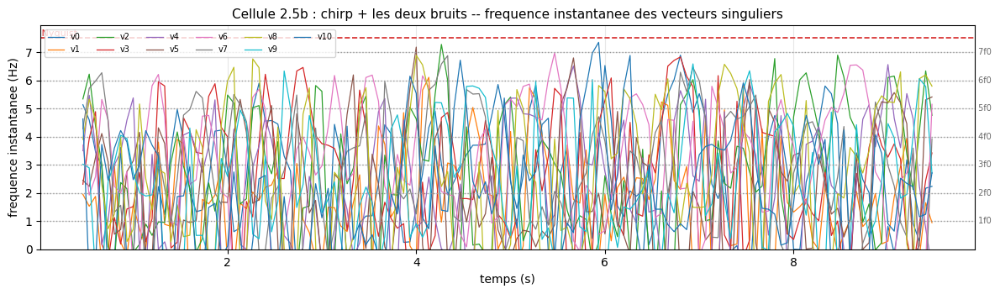

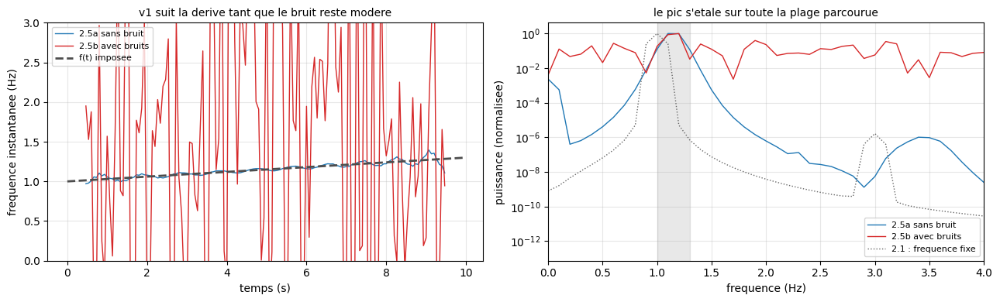


phase initiale retrouvee a partir de v1 :
  2.5a sans bruit  : 1.048 rad =  60.1 deg (imposee 60 deg, ecart 0.1 deg)
  2.5b avec bruits : 1.208 rad =  69.2 deg (imposee 60 deg, ecart 9.2 deg)

concentration spectrale de v1 :
cas                              | record entier | fenetres de 3 s
2.1  frequence fixe, net         |     0.662     |      0.652
2.5a frequence qui derive, net   |     0.447     |      0.573
2.4  frequence fixe, bruite      |     0.217     |      0.269
2.5b derive + bruits             |     0.095     |      0.192

Deux enseignements, et ils portent tous les deux sur la PRODUCTION :

* Une frequence qui derive suffit, a elle seule et sans le moindre bruit, a
  faire chuter la concentration spectrale : le pic s'etale sur toute la plage
  parcourue. Un critere de selection base sur la concentration penalise donc un
  signal parfaitement propre mais non stationnaire.
* Decouper le signal en fenetres courtes le rend localement monochromatique et
  restaure une bonne pa

In [114]:
F_DEB, F_FIN = 1.0, 1.3          # Hz, debut et fin de la derive
PHI0 = np.pi / 3                 # phase initiale

def block_median(frames: np.ndarray, block: int) -> np.ndarray:
        """Spatial median-pool each frame independently: ``(T, H, W) ->
        (T, H//block, W//block)``. Purely spatial — every frame is pooled on
        its own, no mixing across time."""
        if block == 1:
            return frames
        t, h, w = frames.shape
        hc, wc = h - h % block, w - w % block
        cropped = frames[:, :hc, :wc]
        reshaped = cropped.reshape(t, hc // block, block, wc // block, block)
        return np.median(reshaped, axis=(2, 4))

f_impose = F_DEB + (F_FIN - F_DEB) * t2 / (T2 / FS2)          # f(t)
phi_sans_phi0 = 2 * np.pi * (F_DEB * t2 + (F_FIN - F_DEB) * t2**2 / (2 * (T2 / FS2)))
phi_impose = phi_sans_phi0 + PHI0

dy25 = (DEPL_TOTAL / 2) * np.sin(phi_impose)                  # chirp propre
rng25 = np.random.default_rng(0)
dy25_bruite = dy25 + rng25.normal(0.0, BRUIT_DEPL, T2)        # + bruit de deplacement

# a) chirp seul, image propre
images25 = np.exp(
    -(
        ((yy[None] - CENTRE - dy25[:, None, None]) ** 2 + (xx[None] - CENTRE) ** 2)
        / (2 * SIGMA**2)
    )
)
A25 = images25.reshape(T2, -1).T

# b) chirp + bruit de deplacement + bruit d'image
images25b = cube_bruite(dy25_bruite)
A25b = images25b.reshape(T2, -1).T

# c) median filter
images25c_b2 = block_median(images25b,2)
images25c_b3 = block_median(images25b,3)
images25c_b4 = block_median(images25b,4)
images25c_b5 = block_median(images25b,5)
#25c = np.concat(A25b,images25c_b2, images25c_b3, images25c_b4, images25c_b5,0)


print(f"f : {F_DEB} -> {F_FIN} Hz ({phi_impose[-1] / (2 * np.pi):.1f} cycles), "
      f"phase initiale = {PHI0:.3f} rad = {np.degrees(PHI0):.0f} deg")

U25, S25, Vt25 = figures_svd_image(
    A25, "Cellule 2.5a : chirp 1.0->1.3 Hz, sans bruit", t2, images25, dy25
)
U25b, S25b, Vt25b = figures_svd_image(
    A25b, "Cellule 2.5b : chirp + les deux bruits", t2, images25b, dy25_bruite
)
#U25c, S25c, Vt25c = figures_svd_image(
#    A25c, "Cellule 2.5c : chirp + les deux bruits + multiresolution", t2, images25, dy25_bruite
#)

# --- 1. La frequence instantanee de v1 suit-elle la rampe ? ----------------
fig, axes = plt.subplots(1, 2, figsize=(13, 4.0))
for v_, depl_, nom, couleur in ((Vt25[1], dy25, "2.5a sans bruit", "C0"),
                                (Vt25b[1], dy25_bruite, "2.5b avec bruits", "C3")):
    signe = np.sign(np.corrcoef(v_, depl_)[0, 1])
    f_v1 = frequence_instantanee(signe * v_, t2)
    axes[0].plot(t2[BORD2:-BORD2], f_v1[BORD2:-BORD2], lw=1.0, color=couleur, label=nom)
axes[0].plot(t2, f_impose, lw=2.0, color="0.3", ls="--", label="f(t) imposee")
axes[0].set_xlabel("temps (s)"); axes[0].set_ylabel("frequence instantanee (Hz)")
axes[0].set_ylim(0, 3); axes[0].grid(alpha=0.3); axes[0].legend(fontsize=8)
axes[0].set_title("v1 suit la derive tant que le bruit reste modere", fontsize=10)

for v_, depl_, nom, couleur in ((Vt25[1], dy25, "2.5a sans bruit", "C0"),
                                (Vt25b[1], dy25_bruite, "2.5b avec bruits", "C3")):
    signe = np.sign(np.corrcoef(v_, depl_)[0, 1])
    vs = signe * v_
    p = np.abs(np.fft.rfft((vs - vs.mean()) * np.hanning(T2))) ** 2
    axes[1].semilogy(freqs21, p / p.max(), lw=1.0, color=couleur, label=nom)
p_ref = np.abs(np.fft.rfft((Vt21[1] - Vt21[1].mean()) * np.hanning(T2))) ** 2
axes[1].semilogy(freqs21, p_ref / p_ref.max(), lw=1.0, color="0.4", ls=":",
                 label="2.1 : frequence fixe")
axes[1].axvspan(F_DEB, F_FIN, color="0.7", alpha=0.3)
axes[1].set_xlim(0, 4); axes[1].set_xlabel("frequence (Hz)")
axes[1].set_ylabel("puissance (normalisee)")
axes[1].set_title("le pic s'etale sur toute la plage parcourue", fontsize=10)
axes[1].grid(alpha=0.3); axes[1].legend(fontsize=8)
fig.tight_layout()
plt.show()

# --- 2. La phase initiale est-elle recuperable ? ---------------------------
# v1 est proportionnel a sin(phi(t)) : la phase analytique de Hilbert vaut donc
# phi(t) - pi/2. En lui retirant la phase due a la seule derive, il doit rester
# la phase initiale imposee.
print("\nphase initiale retrouvee a partir de v1 :")
for v_, depl_, nom in ((Vt25[1], dy25, "2.5a sans bruit"),
                       (Vt25b[1], dy25_bruite, "2.5b avec bruits")):
    signe = np.sign(np.corrcoef(v_, depl_)[0, 1])
    vs = signe * v_
    phase_v1 = np.unwrap(np.angle(hilbert(vs - vs.mean())))
    estimee = np.mod(np.median(phase_v1 + np.pi / 2 - phi_sans_phi0), 2 * np.pi)
    print(f"  {nom:16s} : {estimee:.3f} rad = {np.degrees(estimee):5.1f} deg "
          f"(imposee {np.degrees(PHI0):.0f} deg, ecart "
          f"{np.degrees(abs(estimee - PHI0)):.1f} deg)")

# --- 3. Ce que la derive coute au critere spectral -------------------------
def concentration_hann(v, debut=0, longueur=None):
    """Part du pic dans la puissance totale, sur une fenetre de Hann."""
    longueur = len(v) if longueur is None else longueur
    w = v[debut:debut + longueur]
    p = np.abs(np.fft.rfft((w - w.mean()) * np.hanning(longueur))) ** 2
    return p.max() / p.sum()


def concentration_par_fenetres(v, n_fen=5, duree_fen=3.0):
    """Moyenne de la concentration sur n_fen fenetres courtes, comme le fait
    `OptimizedSpectralCombination` avec `window_n_cycles` / `n_windows`."""
    longueur = int(duree_fen * FS2)
    departs = np.linspace(0, len(v) - longueur, n_fen).astype(int)
    return float(np.mean([concentration_hann(v, d, longueur) for d in departs]))


print("\nconcentration spectrale de v1 :")
print("cas                              | record entier | fenetres de 3 s")
for nom, v_ in (("2.1  frequence fixe, net      ", Vt21[1]),
                ("2.5a frequence qui derive, net", Vt25[1]),
                ("2.4  frequence fixe, bruite   ", Vt24[1]),
                ("2.5b derive + bruits          ", Vt25b[1])):
    print(f"{nom}   |     {concentration_hann(v_):.3f}     |      "
          f"{concentration_par_fenetres(v_):.3f}")

print("""
Deux enseignements, et ils portent tous les deux sur la PRODUCTION :

* Une frequence qui derive suffit, a elle seule et sans le moindre bruit, a
  faire chuter la concentration spectrale : le pic s'etale sur toute la plage
  parcourue. Un critere de selection base sur la concentration penalise donc un
  signal parfaitement propre mais non stationnaire.
* Decouper le signal en fenetres courtes le rend localement monochromatique et
  restaure une bonne part de la concentration. C'est exactement ce que fait
  `OptimizedSpectralCombination` avec `window_n_cycles` / `n_windows` : evaluer
  le critere spectral sur plusieurs fenetres de quelques cycles au lieu du
  record entier.

Quant a la phase initiale, elle est portee par v1 et se relit directement : la
SVD ne perd pas l'information de phase, elle la range dans le vecteur singulier
temporel.
""")

## Cellule 2.6 -- multi-resolution, avec un tremblement en x et en y

`PixelTraceSource` ne donne pas a la SVD les seuls pixels bruts : pour chaque
taille de bloc `b` de `block_sizes`, il **median-poole** l'image par blocs
`b x b` et concatene les traces obtenues a celles des autres echelles
([traces/pixel.py](../src/ocularrigidity/motion/pulsation/traces/pixel.py)).
`scale_of_trace` retient de quelle echelle vient chaque trace.

On refait la meme chose sur le cas le plus difficile de la section, encore
durci : au chirp vertical bruite et au bruit d'image de la cellule 2.5b
s'ajoute un **bruit de deplacement lateral de 1 px**. La tache tremble donc
maintenant dans les deux directions, et une seule des deux porte le signal.
Blocs `2x2`, `3x3`, `4x4`, `5x5`, plus la grille brute `1x1` que la production
garde toujours.

Deux details de convention, tous deux visibles dans le code :

* ici `A` a **une ligne par trace**, donc la multi-resolution ajoute des
  *lignes* ; dans `PixelTraceSource` (matrice `(T, N)`) elle ajoute des
  *colonnes*. C'est la meme operation transposee.
* un cube poole est encore de forme `(T, H/b, W/b)` : il faut le remettre a
  plat en `(n_traces, T)` **avant** de l'empiler, sinon les echelles ne sont
  pas concatenables (elles n'ont pas les memes dimensions spatiales).

Consequence pour la lecture des figures : avec plusieurs echelles, `u_k` n'est
plus une image mais une **pile de cartes**, une par echelle, chacune a sa
propre resolution.

In [ ]:
BLOCS = (1, 2, 3, 4, 5)   # 1x1 = la grille brute, conservee comme en production
BRUIT_DEPL_X = 1.0        # ecart-type du tremblement lateral, en pixels

rng26 = np.random.default_rng(7)
dx26 = rng26.normal(0.0, BRUIT_DEPL_X, T2)     # aucun signal : que du bruit
dy26 = dy25_bruite                              # chirp + bruit vertical (2.5b)


def cube_xy(dx, dy, n_looks=N_LOOKS, graine=1):
    """Gaussienne translatee en x ET en y, puis bruit d'image facon OCT."""
    rng = np.random.default_rng(graine)
    R = np.exp(
        -(
            ((yy[None] - CENTRE - dy[:, None, None]) ** 2
             + (xx[None] - CENTRE - dx[:, None, None]) ** 2)
            / (2 * SIGMA**2)
        )
    ) + FOND
    return R * rng.gamma(n_looks, 1.0 / n_looks, R.shape) + rng.normal(
        0.0, BRUIT_ADDITIF, R.shape
    )


def traces_multiresolution(cube, blocs=BLOCS):
    """(A, echelle, formes) : une ligne par pixel/super-pixel, toutes echelles.

    `block_median` est celui de la cellule 2.5 (copie de
    `PixelTraceSource._block_median`). Le `.reshape(...).T` est l'etape qui
    manquait : chaque cube poole doit devenir une matrice `(n_traces, T)`
    avant d'etre empile, les echelles n'ayant pas les memes dimensions
    spatiales.
    """
    lignes, echelle, formes = [], [], {}
    for b in blocs:
        poole = block_median(cube, b)                   # (T, H/b, W/b)
        formes[b] = poole.shape[1:]
        n_b = poole.shape[1] * poole.shape[2]
        lignes.append(poole.reshape(len(cube), n_b).T)  # (n_b, T)
        echelle.append(np.full(n_b, b))
    return np.concatenate(lignes, axis=0), np.concatenate(echelle), formes


def indice_composante(Vt, cible, k_max=8):
    """Indice de la composante temporelle la plus correlee a `cible`.

    On ne suppose pas que le mouvement vertical est en v1 : selon les
    amplitudes relatives, x et y peuvent echanger leurs rangs.
    """
    scores = [abs(np.corrcoef(Vt[k], cible)[0, 1]) for k in range(k_max)]
    return int(np.argmax(scores))


images26 = cube_xy(dx26, dy26)
A26_mono = images26.reshape(T2, -1).T
A26, echelle26, formes26 = traces_multiresolution(images26)

U26m, S26m, Vt26m = np.linalg.svd(A26_mono, full_matrices=False)
U26, S26, Vt26 = np.linalg.svd(A26, full_matrices=False)

print(f"deplacement vertical  : rms = {dy26.std():.3f} px (chirp + bruit)")
print(f"deplacement lateral   : rms = {dx26.std():.3f} px (bruit pur)")
print(f"mono-resolution  : A = {A26_mono.shape}")
print(f"multi-resolution : A = {A26.shape}   ("
      + ", ".join(f"{b}x{b}: {int((echelle26 == b).sum())}" for b in BLOCS) + ")")

# --- 1. Les deux directions tombent dans des composantes SEPAREES ----------
# Pour une gaussienne circulaire, dG/dy et dG/dx sont orthogonales : les deux
# tremblements produisent donc des motifs spatiaux orthogonaux, et la SVD --
# qui ne sait trier que par motif spatial -- les separe sans effort.
G26 = A26_mono.mean(axis=1).reshape(TAILLE, TAILLE)
grad_y = np.gradient(G26, axis=0)
grad_x = np.gradient(G26, axis=1)
print(f"\ncos(dG/dy, dG/dx) = {correlation(grad_y, grad_x):.4f}  -> motifs orthogonaux")

k_y = indice_composante(Vt26m, dy26)
k_x = indice_composante(Vt26m, dx26)
print(f"\ncomposante | u vs dG/dy | u vs dG/dx | v vs dy | v vs dx | v vs chirp")
for k in range(4):
    marque = "  <- verticale" if k == k_y else ("  <- laterale" if k == k_x else "")
    print(f"    v{k}     |   {correlation(U26m[:, k], grad_y):.3f}    |   "
          f"{correlation(U26m[:, k], grad_x):.3f}    |  {abs(np.corrcoef(Vt26m[k], dy26)[0, 1]):.3f}  "
          f"|  {abs(np.corrcoef(Vt26m[k], dx26)[0, 1]):.3f}  |   "
          f"{abs(np.corrcoef(Vt26m[k], dy25)[0, 1]):.3f}{marque}")

# --- 2. Mono contre multi, sur la composante verticale ---------------------
def bilan(U_, S_, Vt_, nom):
    ky = indice_composante(Vt_, dy26)
    kx = indice_composante(Vt_, dx26)
    v = Vt_[ky]
    p = np.abs(np.fft.rfft((v - v.mean()) * np.hanning(T2))) ** 2
    print(f"{nom:17s} |  v{ky}   | {S_[ky] / S_[0]:.4f} |      {abs(np.corrcoef(v, dy26)[0, 1]):.4f}     "
          f"|     {abs(np.corrcoef(v, dy25)[0, 1]):.4f}     |  {p.max() / p.sum():.3f}   "
          f"|  v{kx} : {abs(np.corrcoef(Vt_[kx], dx26)[0, 1]):.4f}")
    return abs(np.corrcoef(v, dy25)[0, 1]), p.max() / p.sum()


print("\ncas               | comp. | s_k/s_0 | corr(v, depl. y) | corr(v, chirp) | conc | comp. laterale")
corr_mono, conc_mono = bilan(U26m, S26m, Vt26m, "mono-resolution")
corr_multi, conc_multi = bilan(U26, S26, Vt26, "multi-resolution")

# --- 3. Le pooling fait pourtant bien son travail --------------------------
print("\ncontraste residuel du bruit (coin de l'image, hors gaussienne) :")
contrastes = {}
for b in BLOCS:
    coin = block_median(images26, b)[:, :3, :3]
    contrastes[b] = float(coin.std() / coin.mean())
    print(f"  bloc {b}x{b} : {contrastes[b]:.3f}")

# --- 4. Alors quand la pyramide sert-elle ? --------------------------------
# Le facteur limitant n'est pas le bruit d'image mais les bruits de
# DEPLACEMENT : communs a tous les pixels, ils survivent intacts a n'importe
# quelle moyenne spatiale. On le verifie en faisant varier le seul bruit
# d'image, avec puis sans tremblement.
print("\nbalayage : ou la pyramide sert-elle vraiment ?")
print("bruit d'image | tremblement x,y | corr(v, chirp) mono | multi | gain")
zero = np.zeros(T2)
for n_looks in (1, 2, 4):
    for dxx, dyy, etiquette in ((zero, dy25, "aucun     "),
                                (dx26, dy26, "1 px, 1 px")):
        cu = cube_xy(dxx, dyy, n_looks=n_looks)
        c = []
        for blocs in ((1,), BLOCS):
            A_, _, _ = traces_multiresolution(cu, blocs)
            Vt_ = np.linalg.svd(A_, full_matrices=False)[2]
            c.append(abs(np.corrcoef(Vt_[indice_composante(Vt_, dyy)], dy25)[0, 1]))
        print(f"  L = {n_looks:<2d}        | {etiquette}      |        {c[0]:.3f}        "
              f"| {c[1]:.3f} | {c[1] - c[0]:+.3f}")

# --- 5. Ce que chaque echelle apporte a la composante verticale ------------
k_y_multi = indice_composante(Vt26, dy26)
part_traces = {b: float((echelle26 == b).mean()) for b in BLOCS}
part_u = {b: float((U26[echelle26 == b, k_y_multi] ** 2).sum()) for b in BLOCS}
print("\nechelle | traces | part de |u|^2 | rendement")
for b in BLOCS:
    print(f"  {b}x{b}   | {part_traces[b]:5.1%}  |    {part_u[b]:.3f}      "
          f"| {part_u[b] / part_traces[b]:.2f}x")

# --- 6. Figures ------------------------------------------------------------
fig, axes = plt.subplots(1, 4, figsize=(15, 3.5))
for ax, (carte, titre) in zip(axes, (
    (U26m[:, k_y].reshape(TAILLE, TAILLE), f"u{k_y} : dipole VERTICAL"),
    (grad_y, "dG/dy (attendu)"),
    (U26m[:, k_x].reshape(TAILLE, TAILLE), f"u{k_x} : dipole LATERAL"),
    (grad_x, "dG/dx (attendu)"),
)):
    v = np.abs(carte).max()
    im = ax.imshow(carte, cmap="RdBu_r", vmin=-v, vmax=v)
    ax.set_title(titre, fontsize=9)
    ax.set_xticks([]); ax.set_yticks([])
    fig.colorbar(im, ax=ax, fraction=0.046)
fig.suptitle("Les deux tremblements ont des motifs orthogonaux : la SVD les separe",
             fontsize=11)
fig.tight_layout()
plt.show()

fig, axes = plt.subplots(1, 2, figsize=(13, 4.0))
for ax, (v_, cible, nom, couleur) in zip(axes, (
    (Vt26m[k_y], dy26, f"v{k_y} vs deplacement vertical", "C0"),
    (Vt26m[k_x], dx26, f"v{k_x} vs deplacement lateral", "C2"),
)):
    signe = np.sign(np.corrcoef(v_, cible)[0, 1])
    ax.plot(t2, cible / cible.std(), lw=1.4, color="0.35", label="deplacement impose")
    ax.plot(t2, signe * v_ / v_.std(), lw=1.0, ls="--", color=couleur, label="composante SVD")
    ax.set_xlim(0, 5 / F_OSC); ax.set_xlabel("temps (s)"); ax.set_yticks([])
    ax.set_title(nom, fontsize=10); ax.legend(fontsize=8); ax.grid(alpha=0.3)
fig.tight_layout()
plt.show()

signe_mono = np.sign(np.corrcoef(Vt26m[k_y], dy26)[0, 1])
signe_multi = np.sign(np.corrcoef(Vt26[k_y_multi], dy26)[0, 1])
fig, axes = plt.subplots(1, 2, figsize=(13, 4.0))
axes[0].plot(t2, dy25 / dy25.std(), lw=2.0, color="0.35", label="chirp propre")
axes[0].plot(t2, signe_mono * Vt26m[k_y] / Vt26m[k_y].std(), lw=1.0, color="C0",
             label="mono-resolution")
axes[0].plot(t2, signe_multi * Vt26[k_y_multi] / Vt26[k_y_multi].std(), lw=1.0,
             ls="--", color="C3", label="multi-resolution")
axes[0].set_xlim(0, 5 / F_OSC); axes[0].set_xlabel("temps (s)"); axes[0].set_yticks([])
axes[0].set_title("composante verticale : les deux sont superposees", fontsize=10)
axes[0].legend(fontsize=8); axes[0].grid(alpha=0.3)

x_ = np.arange(len(BLOCS))
axes[1].bar(x_ - 0.2, [part_traces[b] for b in BLOCS], 0.4, label="part des traces")
axes[1].bar(x_ + 0.2, [part_u[b] for b in BLOCS], 0.4, label="part de |u|^2")
axes[1].set_xticks(x_, [f"{b}x{b}" for b in BLOCS])
axes[1].set_title("ce que chaque echelle pese", fontsize=10)
axes[1].legend(fontsize=8)
fig.tight_layout()
plt.show()

fig, axes = plt.subplots(1, len(BLOCS), figsize=(3.1 * len(BLOCS), 3.3))
for ax, b in zip(axes, BLOCS):
    carte = U26[echelle26 == b, k_y_multi].reshape(formes26[b])
    v = np.abs(carte).max()
    im = ax.imshow(carte, cmap="RdBu_r", vmin=-v, vmax=v)
    ax.set_title(f"echelle {b}x{b}\n{formes26[b][0]}x{formes26[b][1]}", fontsize=9)
    ax.set_xticks([]); ax.set_yticks([])
    fig.colorbar(im, ax=ax, fraction=0.046)
fig.suptitle(f"Avec plusieurs echelles, u{k_y_multi} est une PILE de cartes", fontsize=11)
fig.tight_layout()
plt.show()

print(f"""
Ce que cette cellule ajoute :

1. Un tremblement lateral ne pollue PAS la composante verticale. Pour une
   gaussienne circulaire, dG/dx et dG/dy sont orthogonales
   (cos = {correlation(grad_y, grad_x):.4f}), donc les deux directions de mouvement
   produisent des motifs spatiaux orthogonaux et la SVD les range dans deux
   composantes distinctes : v{k_y} suit le deplacement vertical
   ({abs(np.corrcoef(Vt26m[k_y], dy26)[0, 1]):.3f}), v{k_x} le deplacement lateral
   ({abs(np.corrcoef(Vt26m[k_x], dx26)[0, 1]):.3f}), sans se melanger. C'est le pendant positif
   de la cellule 2.2 : ce qui decide, c'est le motif spatial -- meme mecanisme,
   donc melange inseparable ; mecanisme different, donc separation gratuite.

2. La pyramide multi-resolution, elle, n'apporte toujours rien ici :
   corr(v, chirp) passe de {corr_mono:.3f} a {corr_multi:.3f}, la concentration de
   {conc_mono:.3f} a {conc_multi:.3f}. Le pooling fonctionne pourtant (le contraste du
   bruit tombe de {contrastes[1]:.2f} a {contrastes[BLOCS[-1]]:.2f} entre 1x1 et
   {BLOCS[-1]}x{BLOCS[-1]}), mais il s'attaque au mauvais bruit : les tremblements sont
   communs a tous les pixels et survivent a n'importe quelle moyenne spatiale.
   Le balayage montre le regime ou elle paie -- quand le bruit d'IMAGE domine.
""")

## Cellule 2.7 -- le bruit depasse le signal

Meme montage qu'en 2.6 (chirp, tremblement en x et en y, bruit d'image), mais
on inverse le rapport de force :

- **signal** : 3 px d'amplitude totale, crete a crete (donc +/- 1.5 px, meme
  convention que tout le notebook) ;
- **bruit de deplacement** : 4 px d'ecart-type, en x comme en y.

Le tremblement est donc plus grand que le mouvement qu'on cherche. La question
n'est plus "la SVD retrouve-t-elle le mouvement" -- on sait depuis la cellule
2.2 qu'elle retrouve toujours le deplacement REEL -- mais **ce qu'il reste du
signal a l'interieur**, et surtout : est-ce qu'un critere automatique s'en
apercoit ?

In [ ]:
SIGNAL_TOTAL = 3.0        # amplitude totale du chirp, crete a crete (px)
BRUIT_27 = 4.0            # ecart-type du bruit de deplacement, en x et en y (px)

chirp27 = (SIGNAL_TOTAL / 2) * np.sin(phi_impose)      # meme phase qu'en 2.5
dy27 = chirp27 + np.random.default_rng(0).normal(0.0, BRUIT_27, T2)
dx27 = np.random.default_rng(7).normal(0.0, BRUIT_27, T2)

images27 = cube_xy(dx27, dy27)
A27 = images27.reshape(T2, -1).T
U27, S27, Vt27 = np.linalg.svd(A27, full_matrices=False)

print(f"signal   : {SIGNAL_TOTAL:.1f} px crete a crete -> rms = {chirp27.std():.2f} px")
print(f"bruit    : {BRUIT_27:.1f} px d'ecart-type      -> rms du deplacement total = {dy27.std():.2f} px")
print(f"rapport  : le bruit vaut {dy27.std() / chirp27.std():.1f}x le signal (en rms)")
print(f"excursion : le deplacement va de {dy27.min():.1f} a {dy27.max():.1f} px, "
      f"pour une gaussienne de sigma = {SIGMA:.0f} px")


def concentrations(v, bande_hz=0.1):
    """(concentration au pic, concentration en bande, frequence du pic).

    La seconde est celle de la production : part de la puissance dans une
    bande de +/- `concentration_band_hz` autour du pic
    (`LombScargleConfig.concentration_band_hz = 0.1`).
    """
    p = np.abs(np.fft.rfft((v - v.mean()) * np.hanning(len(v)))) ** 2
    pic = freqs21[p.argmax()]
    return p.max() / p.sum(), p[np.abs(freqs21 - pic) < bande_hz].sum() / p.sum(), pic


k27 = indice_composante(Vt27, dy27)
c_pic, c_bande, pic27 = concentrations(Vt27[k27])
G27 = A27.mean(axis=1).reshape(TAILLE, TAILLE)

print(f"\ncomposante retenue : v{k27}")
print(f"  u{k27} vs dG/dy               : {correlation(U27[:, k27], np.gradient(G27, axis=0)):.3f}")
print(f"  v{k27} vs deplacement impose  : {abs(np.corrcoef(Vt27[k27], dy27)[0, 1]):.3f}")
print(f"  v{k27} vs chirp propre        : {abs(np.corrcoef(Vt27[k27], chirp27)[0, 1]):.3f}   <-- ce qui compte")
print(f"  concentration au pic        : {c_pic:.3f}")
print(f"  concentration en bande      : {c_bande:.3f}")
print(f"  frequence du pic            : {pic27:.2f} Hz   (le chirp va de {F_DEB} a {F_FIN} Hz)")

# --- 1. Les deux lectures de "signal 3 px" --------------------------------
# Selon qu'on lit 3 px comme l'amplitude totale ou comme la demi-amplitude, le
# rapport signal/bruit change du simple au double : autant afficher les deux.
print("\nlecture de l'enonce | rms signal | rms bruit | corr(v, chirp) | conc. bande")
for total, etiquette in ((3.0, "3 px crete a crete"), (6.0, "3 px de demi-amp. ")):
    sig = (total / 2) * np.sin(phi_impose)
    d_y = sig + np.random.default_rng(0).normal(0.0, BRUIT_27, T2)
    d_x = np.random.default_rng(7).normal(0.0, BRUIT_27, T2)
    Vt_ = np.linalg.svd(cube_xy(d_x, d_y).reshape(T2, -1).T, full_matrices=False)[2]
    k_ = indice_composante(Vt_, d_y)
    _, cb, _ = concentrations(Vt_[k_])
    print(f"{etiquette}  |    {sig.std():.2f}    |   {d_y.std():.2f}    |     "
          f"{abs(np.corrcoef(Vt_[k_], sig)[0, 1]):.3f}      |    {cb:.3f}")

# --- 2. Ou casse la detection ? -------------------------------------------
# `SpectralCombinationConfig.min_concentration` vaut 0.15 en production, et un
# candidat n'est accepte que si son pic tombe a moins de `accept_tol_bpm`
# (6 bpm = 0.1 Hz) de la frequence cardiaque estimee.
MIN_CONCENTRATION = 0.15      # valeur de production
niveaux = [0.0, 0.5, 1.0, 2.0, 3.0, 4.0, 6.0]
balayage = []
print("\nbruit (px) | rms depl./signal | corr(v, depl.) | corr(v, chirp) | conc. bande | pic | verdict production")
for br in niveaux:
    d_y = chirp27 + (np.random.default_rng(0).normal(0.0, br, T2) if br else 0.0)
    d_x = np.random.default_rng(7).normal(0.0, br, T2) if br else np.zeros(T2)
    Vt_ = np.linalg.svd(cube_xy(d_x, d_y).reshape(T2, -1).T, full_matrices=False)[2]
    k_ = indice_composante(Vt_, d_y)
    _, cb, pk = concentrations(Vt_[k_])
    c_chirp = abs(np.corrcoef(Vt_[k_], chirp27)[0, 1])
    dans_bande = F_DEB - 0.1 <= pk <= F_FIN + 0.1
    verdict = "accepte" if (cb >= MIN_CONCENTRATION and dans_bande) else "REJETE"
    balayage.append((br, cb, c_chirp, pk))
    print(f"   {br:.1f}     |      {d_y.std() / chirp27.std():5.2f}       |     {abs(np.corrcoef(Vt_[k_], d_y)[0, 1]):.3f}      "
          f"|     {c_chirp:.3f}      |    {cb:.3f}    | {pk:.2f} | {verdict}")

# --- 3. Figures ------------------------------------------------------------
signe27 = np.sign(np.corrcoef(Vt27[k27], dy27)[0, 1])
fig, axes = plt.subplots(1, 2, figsize=(13, 4.0))
axes[0].plot(t2, dy27, lw=1.0, color="C1", label="deplacement impose")
axes[0].plot(t2, chirp27, lw=2.2, color="0.3", label="chirp seul (le signal voulu)")
axes[0].plot(t2, signe27 * Vt27[k27] / Vt27[k27].std() * dy27.std(), lw=1.0, ls="--",
             color="C0", label=f"v{k27} remis a l'echelle")
axes[0].set_xlim(0, 5 / F_OSC); axes[0].set_xlabel("temps (s)")
axes[0].set_ylabel("deplacement (px)")
axes[0].set_title("la SVD suit le deplacement reel ; le chirp est noye dedans",
                  fontsize=10)
axes[0].legend(fontsize=8); axes[0].grid(alpha=0.3)

p27 = np.abs(np.fft.rfft((Vt27[k27] - Vt27[k27].mean()) * np.hanning(T2))) ** 2
p_ref = np.abs(np.fft.rfft((Vt25[1] - Vt25[1].mean()) * np.hanning(T2))) ** 2
axes[1].semilogy(freqs21, p_ref / p_ref.max(), lw=1.0, color="0.5", ls=":",
                 label="2.5a : chirp sans bruit")
axes[1].semilogy(freqs21, p27 / p27.max(), lw=1.0, color="C0",
                 label=f"2.7 : bruit {BRUIT_27:.0f} px")
axes[1].axvspan(F_DEB, F_FIN, color="0.6", alpha=0.25, label="plage du chirp")
axes[1].set_xlim(0, 7.5); axes[1].set_ylim(1e-4, 2)
axes[1].set_xlabel("frequence (Hz)"); axes[1].set_ylabel("puissance (normalisee)")
axes[1].set_title("plus aucun pic dans la plage du chirp", fontsize=10)
axes[1].legend(fontsize=8); axes[1].grid(alpha=0.3)
fig.tight_layout()
plt.show()

fig, ax = plt.subplots(figsize=(7.5, 3.8))
br_, cb_, cc_, _ = zip(*balayage)
ax.plot(br_, cb_, "o-", color="C0", label="concentration en bande")
ax.plot(br_, cc_, "s--", color="C3", label="corr(v, chirp)")
ax.axhline(MIN_CONCENTRATION, color="0.4", ls=":", lw=1.2)
ax.text(br_[-1], MIN_CONCENTRATION, " min_concentration = 0.15", fontsize=7,
        color="0.4", ha="right", va="bottom")
ax.axvline(chirp27.std(), color="C1", ls="-.", lw=1.0)
ax.text(chirp27.std(), 0.95, " rms du signal", fontsize=7, color="C1", rotation=90,
        va="top")
ax.set_xlabel("ecart-type du bruit de deplacement (px)")
ax.set_ylabel("indicateur")
ax.set_title("ou la detection casse", fontsize=10)
ax.legend(fontsize=8); ax.grid(alpha=0.3)
fig.tight_layout()
plt.show()

print(f"""
Ce que montre le regime "bruit > signal" :

* La SVD ne casse pas. Elle retrouve le deplacement reellement impose avec une
  correlation de {abs(np.corrcoef(Vt27[k27], dy27)[0, 1]):.3f}, et sa carte spatiale reste le dipole vertical
  ({correlation(U27[:, k27], np.gradient(G27, axis=0)):.3f} avec dG/dy). Elle fait exactement son travail.
* Ce qui casse, c'est le contenu : la correlation avec le chirp tombe a
  {abs(np.corrcoef(Vt27[k27], chirp27)[0, 1]):.3f}, et le pic spectral se deplace a {pic27:.2f} Hz, hors de la plage
  parcourue par le chirp ({F_DEB}-{F_FIN} Hz). Le signal n'est plus la ; aucune
  methode ne peut le sortir de donnees qui ne le contiennent plus.
* Et c'est detectable sans verite terrain : la concentration en bande vaut
  {c_bande:.3f}, sous le seuil `min_concentration = 0.15` de la production, et le pic
  est hors de la fenetre `accept_tol_bpm`. Les deux criteres de
  `OptimizedSpectralCombination` rejettent donc ce candidat au lieu d'annoncer
  un faux pouls -- ce qui est le comportement voulu.

Le balayage situe la bascule entre 1 et 2 px de bruit : a 1 px le deplacement
total vaut 1.3x le signal en rms, la concentration reste a 0.198 et le candidat
passe ; a 2 px (1.98x) elle tombe a 0.080 et il est rejete. Le seuil de
production tombe donc au bon endroit pour ce type de donnees -- juste apres le
point ou le chirp cesse d'etre reconstruisible.
""")

## Cellule 2.8 -- un lissage lateral avant la SVD

Exactement l'experience de la cellule 2.7 (signal 3 px, bruit de deplacement
4 px en x et en y, bruit d'image), mais chaque image du cube est d'abord
**lissee lateralement** par un filtre gaussien d'ecart-type 5 px, uniquement
selon x. Le profil vertical n'est pas touche.

C'est l'analogue du `sigma_col` de `UniformTraceConfig` (lissage entre A-scans
voisins), que `PixelTraceConfig` met a 0 par defaut. Trois effets attendus, de
natures differentes :

1. le speckle, independant d'un pixel a l'autre, est moyenne -> le bruit
   d'image baisse ;
2. la tache s'elargit en x (`sigma_x` passe de 7 a `sqrt(7^2 + 5^2)` = 8.6 px),
   donc son gradient lateral s'aplatit : la composante due au tremblement
   **lateral** est attenuee, alors que celle due au mouvement vertical ne l'est
   pas ;
3. en revanche le tremblement vertical, lui, traverse le filtre intact -- un
   lissage en x ne peut rien contre un bruit qui agit en y.

In [ ]:
from scipy.ndimage import gaussian_filter1d

SIGMA_LATERAL = 5.0       # ecart-type du filtre, en pixels, selon x uniquement

# axis=2 : le cube est (T, y, x), donc l'axe 2 est bien le lateral.
images28 = gaussian_filter1d(images27, SIGMA_LATERAL, axis=2, mode="nearest")
A28 = images28.reshape(T2, -1).T
U28, S28, Vt28 = np.linalg.svd(A28, full_matrices=False)

sigma_x_eff = np.sqrt(SIGMA**2 + SIGMA_LATERAL**2)
print(f"filtre gaussien lateral : sigma = {SIGMA_LATERAL:.0f} px selon x")
print(f"  la tache passe de sigma_x = {SIGMA:.1f} px a "
      f"sqrt({SIGMA:.0f}^2 + {SIGMA_LATERAL:.0f}^2) = {sigma_x_eff:.2f} px ; "
      f"sigma_y reste {SIGMA:.1f} px")

coin_avant = images27[:, :3, :3]
coin_apres = images28[:, :3, :3]
print(f"  contraste du bruit sur le fond : {coin_avant.std() / coin_avant.mean():.3f}"
      f" -> {coin_apres.std() / coin_apres.mean():.3f}")

# --- 1. Ce que le lissage change, composante par composante ----------------
G28 = A28.mean(axis=1).reshape(TAILLE, TAILLE)
grad_y28, grad_x28 = np.gradient(G28, axis=0), np.gradient(G28, axis=1)
grad_y27, grad_x27 = np.gradient(G27, axis=0), np.gradient(G27, axis=1)

ky27, kx27 = indice_composante(Vt27, dy27), indice_composante(Vt27, dx27)
ky28, kx28 = indice_composante(Vt28, dy27), indice_composante(Vt28, dx27)

_, cb27, pic27_ = concentrations(Vt27[ky27])
_, cb28, pic28_ = concentrations(Vt28[ky28])

print("\n                          | sans filtre | avec filtre lateral")
print(f"composante verticale      |     v{ky27}      |     v{ky28}")
print(f"  u vs dG/dy              |    {correlation(U27[:, ky27], grad_y27):.3f}    |    "
      f"{correlation(U28[:, ky28], grad_y28):.3f}")
print(f"  v vs deplacement y      |    {abs(np.corrcoef(Vt27[ky27], dy27)[0, 1]):.3f}    |    "
      f"{abs(np.corrcoef(Vt28[ky28], dy27)[0, 1]):.3f}")
print(f"  v vs chirp              |    {abs(np.corrcoef(Vt27[ky27], chirp27)[0, 1]):.3f}    |    "
      f"{abs(np.corrcoef(Vt28[ky28], chirp27)[0, 1]):.3f}   <-- ce qui compte")
print(f"composante laterale       |     v{kx27}      |     v{kx28}")
print(f"  u vs dG/dx              |    {correlation(U27[:, kx27], grad_x27):.3f}    |    "
      f"{correlation(U28[:, kx28], grad_x28):.3f}")
print(f"  v vs deplacement x      |    {abs(np.corrcoef(Vt27[kx27], dx27)[0, 1]):.3f}    |    "
      f"{abs(np.corrcoef(Vt28[kx28], dx27)[0, 1]):.3f}")
print(f"rapport s_vertical / s_lateral |  {S27[ky27] / S27[kx27]:.2f}     |    "
      f"{S28[ky28] / S28[kx28]:.2f}   <-- le lateral est attenue")
print(f"concentration en bande    |    {cb27:.3f}    |    {cb28:.3f}")
print(f"frequence du pic          |   {pic27_:.2f} Hz  |   {pic28_:.2f} Hz    "
      f"(chirp : {F_DEB}-{F_FIN} Hz)")

# --- 2. Jusqu'ou pousser le lissage ? --------------------------------------
print("\nsigma lateral | contraste bruit | u vs dG/dy | v vs depl. y | v vs chirp "
      "| conc. bande | s_y/s_x")
for s_lat in (0.0, 1.0, 3.0, 5.0, 8.0, 12.0):
    cu = images27 if s_lat == 0 else gaussian_filter1d(images27, s_lat, axis=2,
                                                       mode="nearest")
    A_ = cu.reshape(T2, -1).T
    U_, S_, Vt_ = np.linalg.svd(A_, full_matrices=False)
    G_ = A_.mean(axis=1).reshape(TAILLE, TAILLE)
    ky_, kx_ = indice_composante(Vt_, dy27), indice_composante(Vt_, dx27)
    _, cb_, _ = concentrations(Vt_[ky_])
    coin = cu[:, :3, :3]
    print(f"     {s_lat:4.1f}     |      {coin.std() / coin.mean():.3f}      |   "
          f"{correlation(U_[:, ky_], np.gradient(G_, axis=0)):.3f}    |    "
          f"{abs(np.corrcoef(Vt_[ky_], dy27)[0, 1]):.3f}     |    "
          f"{abs(np.corrcoef(Vt_[ky_], chirp27)[0, 1]):.3f}    |    {cb_:.3f}    |  "
          f"{S_[ky_] / S_[kx_]:.2f}")

# --- 3. Figures ------------------------------------------------------------
fig, axes = plt.subplots(1, 4, figsize=(15, 3.5))
for ax, (img, titre) in zip(axes, (
    (images27[0], "image brute"),
    (images28[0], f"lissee, sigma_x = {SIGMA_LATERAL:.0f} px"),
    (U27[:, ky27].reshape(TAILLE, TAILLE), f"u{ky27} sans filtre"),
    (U28[:, ky28].reshape(TAILLE, TAILLE), f"u{ky28} avec filtre"),
)):
    if "u" in titre:
        v = np.abs(img).max()
        im = ax.imshow(img, cmap="RdBu_r", vmin=-v, vmax=v)
    else:
        im = ax.imshow(img, cmap="magma")
    ax.set_title(titre, fontsize=9)
    ax.set_xticks([]); ax.set_yticks([])
    fig.colorbar(im, ax=ax, fraction=0.046)
fig.suptitle("Le lissage lateral nettoie l'image et la carte spatiale", fontsize=11)
fig.tight_layout()
plt.show()

fig, axes = plt.subplots(1, 2, figsize=(13, 4.0))
axes[0].plot(t2, chirp27 / chirp27.std(), lw=2.2, color="0.3", label="chirp propre")
for v_, nom, couleur, style in ((Vt27[ky27], "sans filtre", "C0", "-"),
                                (Vt28[ky28], "avec filtre lateral", "C3", "--")):
    signe = np.sign(np.corrcoef(v_, dy27)[0, 1])
    axes[0].plot(t2, signe * v_ / v_.std(), lw=1.0, ls=style, color=couleur, label=nom)
axes[0].set_xlim(0, 5 / F_OSC); axes[0].set_xlabel("temps (s)"); axes[0].set_yticks([])
axes[0].set_title("le chirp ne revient pas pour autant", fontsize=10)
axes[0].legend(fontsize=8); axes[0].grid(alpha=0.3)

for v_, nom, couleur in ((Vt27[ky27], "sans filtre", "C0"),
                         (Vt28[ky28], "avec filtre lateral", "C3")):
    p = np.abs(np.fft.rfft((v_ - v_.mean()) * np.hanning(T2))) ** 2
    axes[1].semilogy(freqs21, p / p.max(), lw=1.0, color=couleur, label=nom)
axes[1].axvspan(F_DEB, F_FIN, color="0.6", alpha=0.25, label="plage du chirp")
axes[1].set_xlim(0, 7.5); axes[1].set_ylim(1e-4, 2)
axes[1].set_xlabel("frequence (Hz)"); axes[1].set_ylabel("puissance (normalisee)")
axes[1].set_title("spectre de la composante verticale", fontsize=10)
axes[1].legend(fontsize=8); axes[1].grid(alpha=0.3)
fig.tight_layout()
plt.show()

print(f"""
Ce que le lissage lateral apporte -- et ce qu'il n'apporte pas :

* Il nettoie remarquablement l'ESTIMATION. La carte spatiale passe de
  {correlation(U27[:, ky27], grad_y27):.3f} a {correlation(U28[:, ky28], grad_y28):.3f} de correlation avec dG/dy, et la composante
  temporelle suit le deplacement vertical a {abs(np.corrcoef(Vt28[ky28], dy27)[0, 1]):.3f} au lieu de
  {abs(np.corrcoef(Vt27[ky27], dy27)[0, 1]):.3f}. Le contraste du speckle tombe de
  {coin_avant.std() / coin_avant.mean():.2f} a {coin_apres.std() / coin_apres.mean():.2f}.
* Il attenue le tremblement LATERAL relativement au vertical : la tache
  s'elargit en x ({SIGMA:.0f} -> {sigma_x_eff:.1f} px), son gradient lateral s'aplatit,
  et le rapport des valeurs singulieres passe de {S27[ky27] / S27[kx27]:.2f} a {S28[ky28] / S28[kx28]:.2f}.
  Un filtre anisotrope agit donc bien comme un choix de direction.
* Mais il ne rend pas le signal : corr(v, chirp) ne passe que de
  {abs(np.corrcoef(Vt27[ky27], chirp27)[0, 1]):.3f} a {abs(np.corrcoef(Vt28[ky28], chirp27)[0, 1]):.3f}, la concentration de {cb27:.3f} a {cb28:.3f},
  toujours sous le seuil de production de 0.15, et le pic reste hors de la
  plage du chirp. C'est le troisieme outil de la section (apres la troncature
  de rang et la pyramide multi-resolution) qui echoue sur le meme obstacle : le
  bruit de deplacement VERTICAL partage le motif spatial du signal, et un
  lissage en x ne peut rien contre lui.

Le balayage montre que pousser le filtre plus loin ne change pas la conclusion :
au-dela de 5 px, l'estimation du deplacement continue de s'ameliorer
marginalement, la concentration reste bloquee.
""")

## Cellule 2.9 -- la pyramide multi-resolution sur le jitter fort

On reprend l'experience de la cellule 2.7 -- signal 3 px, tremblement de 4 px
en x et en y, bruit d'image -- et on lui applique la pyramide multi-resolution
de la cellule 2.6 (blocs `1x1` a `5x5`). Comme la cellule 2.8 a introduit le
lissage lateral entre-temps, on teste les quatre combinaisons : avec et sans
filtre, mono et multi-resolution.

Cette cellule ajoute surtout un chiffre qui manquait a toutes les precedentes :
le **plafond**. Quelle correlation avec le chirp une methode parfaite pourrait-
elle atteindre, sachant que le deplacement reellement impose n'est deja
lui-meme qu'en partie du chirp ?

In [ ]:
# --- Le plafond : ce que contient reellement le deplacement impose ---------
# La SVD, au mieux, retrouve dy27, et dy27 = chirp + bruit. Tant que l'erreur
# d'estimation n'est pas correlee au chirp -- il n'y a aucune raison qu'elle le
# soit --, corr(v, chirp) ne peut pas depasser corr(dy, chirp). C'est le
# plafond de TOUTE methode travaillant sur ces images.
#
# Deux valeurs a ne pas confondre :
#   - rms(chirp) / rms(dy) est le plafond ATTENDU, celui qu'on aurait si le
#     tirage de bruit etait exactement orthogonal au chirp ;
#   - corr(dy, chirp) est le plafond REALISE sur ce tirage-ci. Sur 150
#     echantillons, une correlation fortuite de ~0.08 entre le bruit et le
#     chirp est banale, et c'est ce qui separe les deux nombres. C'est le
#     second qui compte : c'est ce que ces images contiennent vraiment.
plafond_attendu = chirp27.std() / dy27.std()
plafond = abs(np.corrcoef(dy27, chirp27)[0, 1])
bruit_seul = dy27 - chirp27
print("contenu en chirp du deplacement impose :")
print(f"  rms(chirp) / rms(dy) = {plafond_attendu:.3f}   (plafond attendu)")
print(f"  corr(dy, chirp)      = {plafond:.3f}   (plafond realise sur ce tirage)")
print(f"  l'ecart vient de corr(bruit, chirp) = "
      f"{np.corrcoef(bruit_seul, chirp27)[0, 1]:+.3f} sur {T2} echantillons")

# --- Les quatre combinaisons ----------------------------------------------
images29_lisse = gaussian_filter1d(images27, SIGMA_LATERAL, axis=2, mode="nearest")

resultats = {}
print("\ncube            | resolution | A            | v vs depl. | v vs chirp "
      "| % du plafond | conc. | s_y/s_x")
for nom_cube, cu in (("brut          ", images27), ("lisse en x    ", images29_lisse)):
    for nom_res, blocs in (("mono ", (1,)), ("multi", BLOCS)):
        A_, ech_, formes_ = traces_multiresolution(cu, blocs)
        U_, S_, Vt_ = np.linalg.svd(A_, full_matrices=False)
        ky = indice_composante(Vt_, dy27)
        kx = indice_composante(Vt_, dx27)
        c_depl = abs(np.corrcoef(Vt_[ky], dy27)[0, 1])
        c_chirp = abs(np.corrcoef(Vt_[ky], chirp27)[0, 1])
        _, cb, pic = concentrations(Vt_[ky])
        resultats[(nom_cube.strip(), nom_res.strip())] = (c_chirp, cb, U_, S_, Vt_,
                                                          ech_, formes_, ky)
        print(f"{nom_cube}  |   {nom_res}    | {str(A_.shape):12s} |   {c_depl:.3f}    "
              f"|   {c_chirp:.3f}    |     {c_chirp / plafond:5.1%}    | {cb:.3f} |  "
              f"{S_[ky] / S_[kx]:.2f}")

# --- Ce que chaque echelle apporte, a ce niveau de bruit -------------------
(_, _, U29, S29, Vt29, ech29, formes29, ky29) = resultats[("brut", "multi")]
print("\nechelle | traces | part de |u|^2 | rendement")
for b in BLOCS:
    m = ech29 == b
    part = float((U29[m, ky29] ** 2).sum())
    print(f"  {b}x{b}   | {m.mean():5.1%}  |    {part:.3f}      | {part / m.mean():.2f}x")

# --- Figures ---------------------------------------------------------------
fig, axes = plt.subplots(1, 2, figsize=(13, 4.0))

etiquettes = ["brut\nmono", "brut\nmulti", "lisse\nmono", "lisse\nmulti"]
valeurs = [resultats[("brut", "mono")][0], resultats[("brut", "multi")][0],
           resultats[("lisse en x", "mono")][0], resultats[("lisse en x", "multi")][0]]
couleurs = ["C0", "C0", "C3", "C3"]
axes[0].bar(range(4), valeurs, color=couleurs, alpha=0.85)
axes[0].axhline(plafond, color="0.3", ls="--", lw=1.5)
axes[0].text(3.4, plafond, f" plafond = {plafond:.3f}", fontsize=8, color="0.3",
             ha="right", va="bottom")
axes[0].set_xticks(range(4), etiquettes, fontsize=8)
axes[0].set_ylabel("corr(v, chirp)")
axes[0].set_ylim(0, plafond * 1.25)
axes[0].set_title("aucune combinaison n'approche le plafond", fontsize=10)
axes[0].grid(alpha=0.3, axis="y")

x_ = np.arange(len(BLOCS))
parts_traces = [float((ech29 == b).mean()) for b in BLOCS]
parts_u = [float((U29[ech29 == b, ky29] ** 2).sum()) for b in BLOCS]
axes[1].bar(x_ - 0.2, parts_traces, 0.4, label="part des traces")
axes[1].bar(x_ + 0.2, parts_u, 0.4, label="part de |u|^2")
axes[1].set_xticks(x_, [f"{b}x{b}" for b in BLOCS])
axes[1].set_title("ce que chaque echelle pese, a fort jitter", fontsize=10)
axes[1].legend(fontsize=8)
fig.tight_layout()
plt.show()

fig, ax = plt.subplots(figsize=(11, 3.6))
ax.plot(t2, chirp27 / chirp27.std(), lw=2.2, color="0.3", label="chirp propre")
for (cube_, res_), couleur, style in ((("brut", "multi"), "C0", "-"),
                                      (("lisse en x", "multi"), "C3", "--")):
    Vt_ = resultats[(cube_, res_)][4]
    ky_ = resultats[(cube_, res_)][7]
    signe = np.sign(np.corrcoef(Vt_[ky_], dy27)[0, 1])
    ax.plot(t2, signe * Vt_[ky_] / Vt_[ky_].std(), lw=1.0, ls=style, color=couleur,
            label=f"{cube_}, multi-resolution")
ax.set_xlim(0, 5 / F_OSC); ax.set_xlabel("temps (s)"); ax.set_yticks([])
ax.set_title("composante verticale, multi-resolution", fontsize=10)
ax.legend(fontsize=8); ax.grid(alpha=0.3)
fig.tight_layout()
plt.show()

print(f"""
Le plafond change la lecture de toute la fin de section.

Le deplacement reellement impose ne contient que {plafond:.1%} de chirp (pour
{plafond_attendu:.1%} attendus -- ce tirage de bruit se trouve legerement anti-correle au
chirp). C'est le maximum atteignable quelle que soit la methode, puisque c'est
ce que les images contiennent. Les quatre combinaisons se lisent donc ainsi :

* brut / mono   : {resultats[("brut", "mono")][0]:.3f}  ({resultats[("brut", "mono")][0] / plafond:.0%} du plafond)
* brut / multi  : {resultats[("brut", "multi")][0]:.3f}  ({resultats[("brut", "multi")][0] / plafond:.0%})
* lisse / mono  : {resultats[("lisse en x", "mono")][0]:.3f}  ({resultats[("lisse en x", "mono")][0] / plafond:.0%})
* lisse / multi : {resultats[("lisse en x", "multi")][0]:.3f}  ({resultats[("lisse en x", "multi")][0] / plafond:.0%})

La pyramide n'apporte toujours rien ({resultats[("brut", "mono")][0]:.3f} -> {resultats[("brut", "multi")][0]:.3f}), et elle
n'apporte rien non plus une fois combinee au lissage lateral. Le lissage, lui,
recupere une vraie part de la marge restante -- mais meme la meilleure
combinaison plafonne a {max(v for v, *_ in [resultats[k] for k in resultats]) / plafond:.0%} de ce qui etait theoriquement disponible,
et la concentration reste sous le seuil de rejet de la production.

La lecon est la meme depuis la cellule 2.2, et elle est maintenant chiffree :
un traitement SPATIAL -- pooling, lissage, troncature de rang -- ne peut pas
recreer de l'information qui n'est plus dans les images. Le bruit de
deplacement a detruit le signal a la source ; ce qui reste a faire est de le
DETECTER, pas de le reparer.
""")

## Cellule 2.10 -- deux gaussiennes en phase, tremblements independants

L'image passe a **50 x 100 px** et contient **deux** gaussiennes, l'une a
x = 25, l'autre a x = 75. Les deux suivent le **meme** chirp -- elles sont en
phase -- mais chacune a son **propre** tremblement, tire independamment :

```
dy1(t) = chirp(t) + bruit_1(t)
dy2(t) = chirp(t) + bruit_2(t)
```

Ni multi-resolution ni lissage : on compare simplement une gaussienne a deux, en
faisant varier l'amplitude du tremblement.

C'est la configuration qui manquait a la section. Jusqu'ici le bruit de
deplacement etait toujours **commun a toute l'image** (la tache entiere
tremblait d'un bloc), et c'est pour cela qu'aucun traitement spatial ne pouvait
l'attenuer. Ici il y a deux sources independantes -- et le comportement change
du tout au tout.

In [ ]:
HAUTEUR, LARGEUR = 50, 100
CX1, CX2 = LARGEUR * 0.25, LARGEUR * 0.75      # positions des deux gaussiennes
JITTER_REF = 4.0                                # amplitude de reference (cf. 2.7)

yy2, xx2 = np.mgrid[0:HAUTEUR, 0:LARGEUR]
CY2 = (HAUTEUR - 1) / 2

chirp210 = (SIGNAL_TOTAL / 2) * np.sin(phi_impose)


def cube_gaussiennes(deplacements, centres, n_looks=N_LOOKS, graine=1,
                     bruit_image=True):
    """Somme de gaussiennes translatees verticalement, puis bruit d'image.

    `bruit_image=False` rend le cube parfait, sans speckle ni fond bruite.
    """
    R = FOND + sum(
        np.exp(
            -(
                ((yy2[None] - CY2 - d[:, None, None]) ** 2 + (xx2[None] - cx) ** 2)
                / (2 * SIGMA**2)
            )
        )
        for cx, d in zip(centres, deplacements)
    )
    if not bruit_image:
        return R
    rng = np.random.default_rng(graine)
    return R * rng.gamma(n_looks, 1.0 / n_looks, R.shape) + rng.normal(
        0.0, BRUIT_ADDITIF, R.shape
    )


def experience(jitter, n_gauss):
    """(resultats) pour 1 ou 2 gaussiennes, a un niveau de tremblement donne."""
    n1 = np.random.default_rng(0).normal(0.0, jitter, T2)
    n2 = np.random.default_rng(11).normal(0.0, jitter, T2)
    dy1, dy2 = chirp210 + n1, chirp210 + n2

    deplacements = [dy1] if n_gauss == 1 else [dy1, dy2]
    centres = [CX1] if n_gauss == 1 else [CX1, CX2]
    # Mode commun : ce que les deux gaussiennes partagent. C'est lui qui porte
    # le chirp, avec un bruit moyenne -- donc reduit d'un facteur sqrt(2).
    commun = dy1 if n_gauss == 1 else (dy1 + dy2) / 2
    differentiel = None if n_gauss == 1 else (dy1 - dy2) / 2

    A = cube_gaussiennes(deplacements, centres).reshape(T2, -1).T
    U, S, Vt = np.linalg.svd(A, full_matrices=False)

    # Selection sur le DEPLACEMENT (pas sur le chirp) : selectionner sur la
    # cible finale reviendrait a choisir le meilleur de 8 candidats avec la
    # verite terrain, ce qui gonfle artificiellement le score a fort bruit.
    k = indice_composante(Vt, commun)
    plafond = abs(np.corrcoef(commun, chirp210)[0, 1])
    c_chirp = abs(np.corrcoef(Vt[k], chirp210)[0, 1])
    _, cb, pic = concentrations(Vt[k])
    return {
        "A": A, "U": U, "S": S, "Vt": Vt, "k": k,
        "commun": commun, "differentiel": differentiel,
        "plafond": plafond, "corr_chirp": c_chirp,
        "corr_depl": abs(np.corrcoef(Vt[k], commun)[0, 1]),
        "conc": cb, "pic": pic,
        "rms_bruit": (commun - chirp210).std(),
    }


un = experience(JITTER_REF, 1)
deux = experience(JITTER_REF, 2)

print(f"tremblement de {JITTER_REF:.0f} px, signal {SIGNAL_TOTAL:.0f} px crete a crete\n")
print("                        | 1 gaussienne | 2 gaussiennes")
print(f"rms du bruit vu par v   |    {un['rms_bruit']:.3f}     |    {deux['rms_bruit']:.3f}"
      f"   (rapport {un['rms_bruit'] / deux['rms_bruit']:.2f}, attendu sqrt(2) = 1.41)")
print(f"plafond                 |    {un['plafond']:.3f}     |    {deux['plafond']:.3f}")
print(f"corr(v, deplacement)    |    {un['corr_depl']:.3f}     |    {deux['corr_depl']:.3f}")
print(f"corr(v, chirp)          |    {un['corr_chirp']:.3f}     |    {deux['corr_chirp']:.3f}")
print(f"  soit, du plafond      |    {un['corr_chirp'] / un['plafond']:5.1%}    |    "
      f"{deux['corr_chirp'] / deux['plafond']:5.1%}")
print(f"concentration en bande  |    {un['conc']:.3f}     |    {deux['conc']:.3f}")

# --- 1. La SVD separe le mode COMMUN du mode DIFFERENTIEL ------------------
# Les deux gaussiennes bougent chacune de leur cote : le sous-espace du
# mouvement est de dimension 2. Ses deux directions naturelles sont la somme
# (le mode commun, de variance sigma_s^2 + sigma_n^2/2) et la difference (le
# mode differentiel, de variance sigma_n^2/2, sans aucun signal). La premiere
# a plus d'energie, donc la SVD la classe devant.
k_com = deux["k"]
k_dif = indice_composante(deux["Vt"], deux["differentiel"])
print(f"\ncomposante | corr avec (dy1+dy2)/2 | corr avec (dy1-dy2)/2 | corr avec chirp")
for k in range(4):
    etiq = ""
    if k == k_com:
        etiq = "  <- mode commun"
    elif k == k_dif:
        etiq = "  <- mode differentiel"
    print(f"    v{k}     |         {abs(np.corrcoef(deux['Vt'][k], deux['commun'])[0, 1]):.3f}         "
          f"|         {abs(np.corrcoef(deux['Vt'][k], deux['differentiel'])[0, 1]):.3f}         |      "
          f"{abs(np.corrcoef(deux['Vt'][k], chirp210)[0, 1]):.3f}{etiq}")
print("-> le mode differentiel ne contient aucun chirp : tout le signal est")
print("   passe dans le mode commun, avec un bruit divise par sqrt(2).")

# --- 2. Balayage du tremblement -------------------------------------------
NIVEAUX = [0.5, 1.0, 2.0, 3.0, 4.0, 6.0]
balayage = []
print("\njitter | plafond 1G | atteint 1G | conc 1G | plafond 2G | atteint 2G | conc 2G | gain")
for jit in NIVEAUX:
    r1, r2 = experience(jit, 1), experience(jit, 2)
    balayage.append((jit, r1, r2))
    print(f"  {jit:.1f}  |   {r1['plafond']:.3f}    |   {r1['corr_chirp']:.3f}    |  "
          f"{r1['conc']:.3f}  |   {r2['plafond']:.3f}    |   {r2['corr_chirp']:.3f}    |  "
          f"{r2['conc']:.3f}  | {r2['corr_chirp'] - r1['corr_chirp']:+.3f}")

# --- 3. Figures ------------------------------------------------------------
fig, axes = plt.subplots(1, 3, figsize=(15, 3.4))
im = axes[0].imshow(cube_gaussiennes([chirp210, chirp210], [CX1, CX2])[0], cmap="magma")
axes[0].set_title("l'image 50x100 : deux gaussiennes", fontsize=10)
axes[0].set_xticks([]); axes[0].set_yticks([])
fig.colorbar(im, ax=axes[0], fraction=0.03)
for ax, k, titre in ((axes[1], k_com, f"u{k_com} : mode commun"),
                     (axes[2], k_dif, f"u{k_dif} : mode differentiel")):
    carte = deux["U"][:, k].reshape(HAUTEUR, LARGEUR)
    v = np.abs(carte).max()
    im = ax.imshow(carte, cmap="RdBu_r", vmin=-v, vmax=v)
    ax.set_title(titre, fontsize=10)
    ax.set_xticks([]); ax.set_yticks([])
    fig.colorbar(im, ax=ax, fraction=0.03)
fig.suptitle("Les deux dipoles en phase = mode commun ; en opposition = differentiel",
             fontsize=11)
fig.tight_layout()
plt.show()

fig, axes = plt.subplots(1, 2, figsize=(13, 4.0))
jits = [b[0] for b in balayage]
axes[0].plot(jits, [b[1]["plafond"] for b in balayage], "o--", color="C0", alpha=0.5,
             label="plafond, 1 gaussienne")
axes[0].plot(jits, [b[1]["corr_chirp"] for b in balayage], "o-", color="C0",
             label="atteint, 1 gaussienne")
axes[0].plot(jits, [b[2]["plafond"] for b in balayage], "s--", color="C3", alpha=0.5,
             label="plafond, 2 gaussiennes")
axes[0].plot(jits, [b[2]["corr_chirp"] for b in balayage], "s-", color="C3",
             label="atteint, 2 gaussiennes")
axes[0].set_xlabel("ecart-type du tremblement (px)")
axes[0].set_ylabel("corr(v, chirp)")
axes[0].set_title("deux sources independantes valent mieux qu'une", fontsize=10)
axes[0].legend(fontsize=8); axes[0].grid(alpha=0.3)

axes[1].plot(jits, [b[1]["conc"] for b in balayage], "o-", color="C0", label="1 gaussienne")
axes[1].plot(jits, [b[2]["conc"] for b in balayage], "s-", color="C3", label="2 gaussiennes")
axes[1].axhline(0.15, color="0.4", ls=":", lw=1.2)
axes[1].text(jits[-1], 0.15, " min_concentration", fontsize=7, color="0.4",
             ha="right", va="bottom")
axes[1].set_xlabel("ecart-type du tremblement (px)")
axes[1].set_ylabel("concentration en bande")
axes[1].set_title("la concentration ne remonte que tant que le signal survit",
                  fontsize=10)
axes[1].legend(fontsize=8); axes[1].grid(alpha=0.3)
fig.tight_layout()
plt.show()

# --- Les vecteurs singuliers, spatiaux et temporels ------------------------
# Une colonne par couple (u_k, v_k) : la carte spatiale en haut, la forme
# d'onde correspondante en bas. C'est le meme objet vu de ses deux cotes --
# u_k dit OU, v_k dit QUAND.
N_PAIRES = 6


def paires_singulieres(res, titre, n=N_PAIRES, repere=(), spectres=False):
    """Une colonne par couple (u_k, v_k) ; `spectres` ajoute |FFT(v_k)|^2."""
    U_, S_, Vt_ = res["U"], res["S"], res["Vt"]
    n_lignes = 3 if spectres else 2
    hauteurs = [1.7, 1.0, 1.0] if spectres else [1.7, 1.0]
    fig, axes = plt.subplots(n_lignes, n, figsize=(2.5 * n, 1.9 * sum(hauteurs)),
                             gridspec_kw={"height_ratios": hauteurs})
    for k in range(n):
        carte = U_[:, k].reshape(HAUTEUR, LARGEUR)
        v = np.abs(carte).max()
        axes[0, k].imshow(carte, cmap="RdBu_r", vmin=-v, vmax=v)
        etiq = dict(repere).get(k, "")
        axes[0, k].set_title(f"$u_{{{k}}}$   s = {S_[k]:.3g}\n{etiq}", fontsize=8)
        axes[0, k].set_xticks([]); axes[0, k].set_yticks([])

        _, cb_, pic_ = concentrations(Vt_[k])
        axes[1, k].plot(t2, Vt_[k], lw=0.8, color="C0")
        axes[1, k].axhline(0, color="0.7", lw=0.5, ls=":")
        axes[1, k].set_xlim(0, 5 / F_OSC)
        axes[1, k].set_yticks([])
        axes[1, k].set_xlabel("t (s)", fontsize=8)
        axes[1, k].tick_params(labelsize=7)
        axes[1, k].set_title(f"$v_{{{k}}}$ : {pic_:.1f} Hz, c = {cb_:.2f}", fontsize=8)
        for cote in ("top", "right", "left"):
            axes[1, k].spines[cote].set_visible(False)

        if spectres:
            p = np.abs(np.fft.rfft((Vt_[k] - Vt_[k].mean()) * np.hanning(T2))) ** 2
            # Echelle LINEAIRE : sur des vecteurs a moitie bruites, le log tasse
            # tout dans la decade du haut et le pic ne se voit plus. La bande
            # grisee est la plage parcourue par le chirp.
            axes[2, k].axvspan(F_DEB, F_FIN, color="0.6", alpha=0.25)
            for h in range(2, 7):
                axes[2, k].axvline(h * F_DEB, color="0.75", lw=0.6, ls=":")
            axes[2, k].plot(freqs21, p / p.max(), lw=0.8, color="C3")
            axes[2, k].set_xlim(0, 7.5)
            axes[2, k].set_ylim(0, 1.08)
            axes[2, k].set_yticks([])
            axes[2, k].set_xlabel("f (Hz)", fontsize=8)
            axes[2, k].tick_params(labelsize=7)
            axes[2, k].set_title(f"$|FFT(v_{{{k}}})|^2$", fontsize=8)
            for cote in ("top", "right", "left"):
                axes[2, k].spines[cote].set_visible(False)
    fig.suptitle(titre, fontsize=11)
    fig.tight_layout()
    plt.show()


paires_singulieres(
    deux,
    "Deux gaussiennes : vecteurs singuliers spatiaux (haut) et temporels (bas)",
    repere=((0, "image moyenne"), (k_com, "mode commun"), (k_dif, "mode differentiel")),
)
paires_singulieres(
    un,
    "Une seule gaussienne, pour comparaison",
    repere=((0, "image moyenne"), (un["k"], "mouvement vertical")),
)

# --- Faible tremblement (0.5 px) : le regime intermediaire -----------------
# Entre le cas parfait et le cas a 4 px, c'est ici que la structure est encore
# lisible tout en etant deja perturbee -- et les spectres le montrent mieux que
# les formes d'onde.
JITTER_FAIBLE = 0.5
faible = experience(JITTER_FAIBLE, 2)
k_com_f = faible["k"]
k_dif_f = indice_composante(faible["Vt"], faible["differentiel"])

paires_singulieres(
    faible,
    f"Deux gaussiennes, tremblement de {JITTER_FAIBLE} px : vecteurs singuliers "
    "et spectres",
    repere=((0, "image moyenne"), (k_com_f, "mode commun"),
            (k_dif_f, "mode differentiel")),
    spectres=True,
)

print(f"\ntremblement de {JITTER_FAIBLE} px, deux gaussiennes :")
print(f"  plafond {faible['plafond']:.3f}, atteint {faible['corr_chirp']:.3f} "
      f"({faible['corr_chirp'] / faible['plafond']:.1%}), "
      f"concentration {faible['conc']:.3f}")
print(" k | s_k     | pic v_k  | conc. | corr commun | corr differentiel | corr chirp")
for k in range(N_PAIRES):
    _, cb_, pic_ = concentrations(faible["Vt"][k])
    print(f" {k} | {faible['S'][k]:7.3f} | {pic_:5.2f} Hz | {cb_:.3f} |    "
          f"{abs(np.corrcoef(faible['Vt'][k], faible['commun'])[0, 1]):.3f}    |       "
          f"{abs(np.corrcoef(faible['Vt'][k], faible['differentiel'])[0, 1]):.3f}       |   "
          f"{abs(np.corrcoef(faible['Vt'][k], chirp210)[0, 1]):.3f}")

# --- Reference : les memes deux gaussiennes, sans RIEN ---------------------
# Sans tremblement, les deux taches bougent exactement pareil : elles sont
# parfaitement redondantes. Le mode differentiel n'a alors plus aucune energie,
# et il ne reste que l'escalier de Taylor de la cellule 2.1 -- ici sur deux
# taches au lieu d'une.
images_propre = cube_gaussiennes([chirp210, chirp210], [CX1, CX2], bruit_image=False)
A_propre = images_propre.reshape(T2, -1).T
U_p, S_p, Vt_p = np.linalg.svd(A_propre, full_matrices=False)
propre = {"U": U_p, "S": S_p, "Vt": Vt_p}

# Une seule gaussienne, tout aussi propre, pour comparer les rangs.
A_propre_1g = cube_gaussiennes([chirp210], [CX1], bruit_image=False).reshape(T2, -1).T

paires_singulieres(
    propre,
    "Deux gaussiennes SANS tremblement ni bruit d'image : l'escalier de Taylor",
    repere=((0, "image moyenne"), (1, "1er ordre, dG/dy"), (2, "2e ordre")),
)

G_propre = A_propre.mean(axis=1).reshape(HAUTEUR, LARGEUR)
grad_y_propre = np.gradient(G_propre, axis=0)

print("\nsans tremblement ni bruit d'image :")
print(f"  rang : {np.linalg.matrix_rank(A_propre_1g)} avec UNE gaussienne, "
      f"{np.linalg.matrix_rank(A_propre)} avec DEUX")
print("  -> une seconde tache parfaitement redondante n'ajoute aucune dimension.\n")
print(" k | s_k       | pic v_k  | conc. | symetrie gauche/droite | u_k vs dG/dy")
for k in range(N_PAIRES):
    carte = U_p[:, k].reshape(HAUTEUR, LARGEUR)
    moitie_g, moitie_d = carte[:, : LARGEUR // 2], carte[:, LARGEUR // 2 :]
    # +1 = les deux taches portent le MEME motif (mode commun) ;
    # -1 aurait signale un mode differentiel.
    symetrie = np.corrcoef(moitie_g.ravel(), moitie_d.ravel())[0, 1]
    _, cb_, pic_ = concentrations(Vt_p[k])
    print(f" {k} | {S_p[k]:9.4f} | {pic_:5.2f} Hz | {cb_:.3f} |"
          f"        {symetrie:+.4f}         |    {correlation(U_p[:, k], grad_y_propre):.3f}")
print("\n-> symetrie = +1 partout : AUCUN mode differentiel, les deux taches")
print("   portent rigoureusement le meme motif. Les frequences montent en")
print(f"   {F_DEB}-{F_FIN} Hz, x2, x3... : c'est l'escalier harmonique de la cellule 2.1,")
print("   la derive du chirp en plus.")
print(f"\ncomparaison des valeurs singulieres au tremblement de {JITTER_REF:.0f} px :")
print(f"  sans tremblement : s1 = {S_p[1]:.3f}, s2 = {S_p[2]:.3f}  "
      f"(rapport {S_p[1] / S_p[2]:.0f}x -- s2 est le 2e ordre de Taylor)")
print(f"  avec tremblement : s1 = {deux['S'][1]:.3f}, s2 = {deux['S'][2]:.3f}  "
      f"(rapport {deux['S'][1] / deux['S'][2]:.2f}x -- s2 est le mode differentiel)")

# --- Le meme vecteur commun, aux trois niveaux de tremblement --------------
fig, ax = plt.subplots(figsize=(9, 3.6))
for res, nom, couleur in ((propre, "sans tremblement", "0.35"),
                          (faible, f"{JITTER_FAIBLE} px", "C0"),
                          (deux, f"{JITTER_REF:.0f} px", "C3")):
    k_ = 1 if res is propre else res["k"]
    v_ = res["Vt"][k_]
    p = np.abs(np.fft.rfft((v_ - v_.mean()) * np.hanning(T2))) ** 2
    ax.semilogy(freqs21, p / p.max(), lw=1.0, color=couleur, label=nom)
for h in range(1, 7):
    ax.axvline(h * F_DEB, color="0.75", lw=0.6, ls=":")
ax.axvspan(F_DEB, F_FIN, color="0.6", alpha=0.2)
ax.set_xlim(0, 7.5); ax.set_ylim(1e-4, 3)
ax.set_xlabel("frequence (Hz)"); ax.set_ylabel("puissance (normalisee)")
ax.set_title("spectre du mode commun : les harmoniques disparaissent une a une",
             fontsize=10)
ax.legend(fontsize=8); ax.grid(alpha=0.3)
fig.tight_layout()
plt.show()

# La lecture ligne a ligne, en chiffres.
print("\nvecteurs singuliers, deux gaussiennes :")
print("  k | s_k     | pic   | conc. | corr (dy1+dy2)/2 | corr (dy1-dy2)/2 | corr chirp")
for k in range(N_PAIRES):
    _, cb_, pic_ = concentrations(deux["Vt"][k])
    print(f"  {k} | {deux['S'][k]:7.2f} | {pic_:4.2f} Hz | {cb_:.3f} |      "
          f"{abs(np.corrcoef(deux['Vt'][k], deux['commun'])[0, 1]):.3f}       |      "
          f"{abs(np.corrcoef(deux['Vt'][k], deux['differentiel'])[0, 1]):.3f}       |   "
          f"{abs(np.corrcoef(deux['Vt'][k], chirp210)[0, 1]):.3f}")

print(f"""
Ce que deux gaussiennes changent, et pourquoi :

Le bruit de deplacement etait jusqu'ici commun a toute l'image, et c'est
exactement pour cela que la pyramide multi-resolution (2.6, 2.9) et le lissage
lateral (2.8) etaient impuissants : moyenner spatialement une tache qui tremble
d'un bloc ne moyenne rien du tout. Ici, les deux gaussiennes tremblent
independamment, et la SVD trouve toute seule le mode COMMUN -- celui ou les
deux dipoles sont en phase -- dont le bruit vaut la moyenne des deux, donc
sqrt(2) fois moins ({un['rms_bruit']:.2f} px -> {deux['rms_bruit']:.2f} px, rapport {un['rms_bruit'] / deux['rms_bruit']:.2f}).

Le plafond monte en consequence : de {un['plafond']:.3f} a {deux['plafond']:.3f} au tremblement de
reference, et la correlation atteinte suit ({un['corr_chirp']:.3f} -> {deux['corr_chirp']:.3f}). Sur tout
le balayage, la SVD reste a 96-104 % de son plafond : elle n'est jamais le
maillon faible, c'est le plafond lui-meme qui bouge.

Le mode differentiel, lui, existe bel et bien comme composante separee et ne
contient aucun signal. La SVD n'a pas eu besoin qu'on le lui dise : les deux
motifs (dipoles en phase / en opposition) sont orthogonaux, exactement comme
l'etaient dG/dy et dG/dx en 2.6.

Une reserve, visible dans la colonne des concentrations : le gain est net sur
la CORRELATION a tous les niveaux, mais sur la DETECTABILITE il ne porte que
tant qu'il reste du signal. Jusqu'a 2 px de tremblement la concentration
progresse franchement ({balayage[2][1]['conc']:.3f} -> {balayage[2][2]['conc']:.3f}, soit presque le seuil de
0.15) ; au-dela, les deux configurations sont au plancher de bruit (0.06-0.10)
et leur ecart n'a plus de sens. Deux sources ne suffisent pas a faire repasser
le signal au-dessus du seuil de rejet -- il en faudrait bien davantage.

C'est justement le mecanisme qui fait marcher la chaine reelle : ce ne sont pas
les milliers de pixels qui aident en soi -- les pixels d'une meme structure
rigide partagent leur bruit --, ce sont les sources de bruit INDEPENDANTES.
Avec N d'entre elles, le bruit tombe en sqrt(N) ; passer de 1 a 2 ne gagne
qu'un facteur 1.4, ce qui explique qu'on en veuille beaucoup.
""")

## Cellule 2.11 -- a quel moment le mode differentiel apparait

Meme montage qu'en 2.10 (deux gaussiennes en phase, bruit d'image), en faisant
monter le tremblement par paliers. La question : a partir de quand la SVD
consacre-t-elle une composante a la **difference** entre les deux taches ?

L'indicateur est purement geometrique et se lit sur la carte : pour chaque
`u_k`, on compare la moitie gauche de l'image a la moitie droite.

* `+1` : les deux taches portent le meme motif -> **mode commun** ;
* `-1` : elles le portent en opposition -> **mode differentiel** ;
* `~0` : la carte n'a pas de structure -> bruit.

In [ ]:
JITTERS_CARTES = (0.0, 0.25, 0.5, 1.0, 2.0, 4.0)   # lignes de la figure
N_CARTES = 5                                        # colonnes : u0 .. u4


def symetrie(u):
    """corr(moitie gauche, moitie droite) d'une carte spatiale.

    +1 = mode commun, -1 = mode differentiel, ~0 = pas de structure. La mesure
    est insensible au signe global de u_k, qui est arbitraire.
    """
    carte = u.reshape(HAUTEUR, LARGEUR)
    gauche, droite = carte[:, : LARGEUR // 2], carte[:, LARGEUR // 2 :]
    return float(np.corrcoef(gauche.ravel(), droite.ravel())[0, 1])


def svd_a_jitter(jitter):
    """SVD des deux gaussiennes a un niveau de tremblement donne."""
    n1 = np.random.default_rng(0).normal(0.0, jitter, T2) if jitter else np.zeros(T2)
    n2 = np.random.default_rng(11).normal(0.0, jitter, T2) if jitter else np.zeros(T2)
    dy1, dy2 = chirp210 + n1, chirp210 + n2
    A = cube_gaussiennes([dy1, dy2], [CX1, CX2]).reshape(T2, -1).T
    U, S, Vt = np.linalg.svd(A, full_matrices=False)
    return U, S, Vt, (dy1 + dy2) / 2, (dy1 - dy2) / 2


# --- 1. Les trois faces d'un meme objet, palier par palier -----------------
# Une SVD par palier, reutilisee par les trois grilles : la carte spatiale
# u_k, la forme d'onde v_k, et son spectre. Le code couleur est commun aux
# trois -- il vient de la symetrie de u_k -- pour qu'on puisse suivre une
# composante d'une grille a l'autre.
svd_paliers = {jit: svd_a_jitter(jit) for jit in JITTERS_CARTES}


def couleur_mode(sym):
    """Bleu = mode commun, rouge = mode differentiel, gris = sans structure."""
    return "C3" if sym < -0.3 else ("C0" if sym > 0.3 else "0.5")


def grille_paliers(quoi, titre):
    fig, axes = plt.subplots(
        len(JITTERS_CARTES), N_CARTES,
        figsize=(2.5 * N_CARTES,
                 (1.45 if quoi == "carte" else 1.15) * len(JITTERS_CARTES)),
    )
    for ligne, jit in enumerate(JITTERS_CARTES):
        U_, S_, Vt_, _, _ = svd_paliers[jit]
        for k in range(N_CARTES):
            ax = axes[ligne, k]
            sym = symetrie(U_[:, k])
            couleur = couleur_mode(sym)

            if quoi == "carte":
                carte = U_[:, k].reshape(HAUTEUR, LARGEUR)
                v = np.abs(carte).max()
                ax.imshow(carte, cmap="RdBu_r", vmin=-v, vmax=v)
                ax.set_xticks([]); ax.set_yticks([])
                ax.set_xlabel(f"{sym:+.2f}", fontsize=7, color=couleur, labelpad=1)
            elif quoi == "temporel":
                ax.plot(t2, Vt_[k], lw=0.7, color=couleur)
                ax.axhline(0, color="0.8", lw=0.5, ls=":")
                ax.set_xlim(0, 5 / F_OSC)
                ax.set_xticks([] if ligne < len(JITTERS_CARTES) - 1 else [0, 2, 4])
                ax.set_yticks([])
                if ligne == len(JITTERS_CARTES) - 1:
                    ax.set_xlabel("t (s)", fontsize=7)
                for cote in ("top", "right", "left"):
                    ax.spines[cote].set_visible(False)
            else:  # spectre
                p = np.abs(np.fft.rfft((Vt_[k] - Vt_[k].mean()) * np.hanning(T2))) ** 2
                ax.axvspan(F_DEB, F_FIN, color="0.6", alpha=0.25)
                for h in range(2, 7):
                    ax.axvline(h * F_DEB, color="0.8", lw=0.5, ls=":")
                ax.plot(freqs21, p / p.max(), lw=0.7, color=couleur)
                ax.set_xlim(0, 7.5); ax.set_ylim(0, 1.08)
                ax.set_xticks([] if ligne < len(JITTERS_CARTES) - 1 else [0, 2, 4, 6])
                ax.set_yticks([])
                if ligne == len(JITTERS_CARTES) - 1:
                    ax.set_xlabel("f (Hz)", fontsize=7)
                for cote in ("top", "right", "left"):
                    ax.spines[cote].set_visible(False)

            ax.tick_params(labelsize=7)
            if ligne == 0:
                prefixe = "u" if quoi == "carte" else "v"
                ax.set_title(f"${prefixe}_{{{k}}}$", fontsize=9)
            if k == 0:
                ax.set_ylabel(f"{jit:.2f} px", fontsize=8)
    fig.suptitle(titre, fontsize=11)
    fig.tight_layout()
    plt.show()


grille_paliers("carte",
               "Vecteurs singuliers SPATIAUX par niveau de tremblement "
               "(chiffre = symetrie gauche/droite ; rouge = mode differentiel)")
grille_paliers("temporel",
               "Vecteurs singuliers TEMPORELS (memes composantes, meme code couleur)")
grille_paliers("spectre",
               "Spectres des vecteurs temporels (bande grisee = plage du chirp)")

# La lecture chiffree des memes grilles : ce que porte chaque composante.
print("palier | composante | symetrie | pic     | conc. | corr chirp")
for jit in JITTERS_CARTES:
    U_, S_, Vt_, com_, dif_ = svd_paliers[jit]
    for k in range(1, 4):
        _, cb_, pic_ = concentrations(Vt_[k])
        sym = symetrie(U_[:, k])
        nature = ("commun" if sym > 0.3 else ("differentiel" if sym < -0.3 else "bruit"))
        print(f" {jit:4.2f}  |     v{k}     |  {sym:+.2f}   | {pic_:5.2f} Hz | {cb_:.3f} |"
              f"   {abs(np.corrcoef(Vt_[k], chirp210)[0, 1]):.3f}    {nature}")

# --- 2. Ou la bascule se produit-elle exactement ? -------------------------
# Le mode differentiel "apparait" quand son energie depasse le plateau de bruit
# de speckle -- pas avant : jusque-la il existe mathematiquement, mais il est
# noye parmi les composantes de bruit et son rang le montre.
JITTERS_COURBE = (0.0, 0.125, 0.25, 0.375, 0.5, 0.625, 0.75, 1.0, 1.5, 2.0, 3.0, 4.0)
suivi = []
print("jitter | rang du mode | s_commun | s_diff | plateau | s_diff/plateau | sym(u2)")
for jit in JITTERS_COURBE:
    U_, S_, Vt_, com_, dif_ = svd_a_jitter(jit)
    k_com = indice_composante(Vt_, com_)
    # Le plateau de bruit : la mediane des composantes bien au-dela du signal.
    plateau = float(np.median(S_[6:16]))
    if jit == 0:
        k_dif, s_dif = None, np.nan
    else:
        k_dif = indice_composante(Vt_, dif_, k_max=12)
        s_dif = S_[k_dif]
    suivi.append((jit, k_dif, S_[k_com], s_dif, plateau, symetrie(U_[:, 2])))
    rang = "  --" if k_dif is None else f"v{k_dif:<2d}"
    ratio = "   --" if k_dif is None else f"{s_dif / plateau:5.2f}"
    print(f" {jit:5.3f} |     {rang}      |  {S_[k_com]:6.2f}  | "
          + ("  --  " if k_dif is None else f"{s_dif:6.2f}")
          + f" | {plateau:6.2f} |     {ratio}      | {symetrie(U_[:, 2]):+.2f}")

fig, axes = plt.subplots(1, 2, figsize=(13, 4.0))
jits = [s[0] for s in suivi]
axes[0].plot(jits, [s[2] for s in suivi], "o-", color="C0", label="mode commun")
axes[0].plot(jits, [s[3] for s in suivi], "s-", color="C3", label="mode differentiel")
axes[0].plot(jits, [s[4] for s in suivi], "--", color="0.4", label="plateau de bruit")
axes[0].set_xlabel("tremblement (px)"); axes[0].set_ylabel("valeur singuliere")
axes[0].set_title("le differentiel emerge quand il depasse le plateau", fontsize=10)
axes[0].legend(fontsize=8); axes[0].grid(alpha=0.3)

axes[1].plot(jits, [s[5] for s in suivi], "o-", color="C3")
axes[1].axhline(0, color="0.6", lw=0.8, ls=":")
axes[1].axhline(-0.3, color="0.4", lw=1.0, ls="--")
axes[1].text(jits[-1], -0.3, " seuil de lisibilite", fontsize=7, color="0.4",
             ha="right", va="top")
axes[1].set_xlabel("tremblement (px)")
axes[1].set_ylabel("symetrie de $u_2$")
axes[1].set_ylim(-1.05, 0.3)
axes[1].set_title("$u_2$ bascule de 'bruit' a 'mode differentiel'", fontsize=10)
axes[1].grid(alpha=0.3)
fig.tight_layout()
plt.show()

bascule = [s for s in suivi if s[1] == 2]
premier = bascule[0] if bascule else None
print(f"""
Reponse : le mode differentiel apparait entre 0.5 et 1 px de tremblement.

En dessous, il existe bien mathematiquement -- les deux taches ne bougent deja
plus tout a fait ensemble -- mais son energie reste sous le plateau de speckle
(rapport 1.04 a 0.5 px) : la SVD le classe alors au rang 5 ou 6, indiscernable
des composantes de bruit, et la carte u2 n'a aucune structure (symetrie +0.02).

A {premier[0] if premier else float('nan'):.2f} px il passe rang 2, juste derriere le mode commun, avec un
rapport au plateau de {premier[3] / premier[4] if premier else float('nan'):.2f}. La carte u2 commence alors a s'antisymetriser
(symetrie {premier[5] if premier else float('nan'):+.2f}) : le motif "un dipole vers le haut, l'autre vers le bas"
est encore mele de grain a ce palier, et ne devient franc qu'a partir de 1 px
(-0.50), puis net a 2 px (-0.82).

Au-dela, les deux modes convergent : a 4 px leurs valeurs singulieres sont
quasiment egales ({suivi[-1][2]:.1f} contre {suivi[-1][3]:.1f}). La SVD depense alors autant
d'energie a decrire le desaccord entre les deux taches qu'a decrire leur
mouvement commun -- c'est le regime de la cellule 2.7, ou le signal etait
devenu minoritaire.

Le critere pratique : ce n'est pas l'amplitude du tremblement en soi qui
compte, mais son rapport au plancher de bruit de l'image. Un meme tremblement
de 0.5 px serait parfaitement visible sur des images moins bruitees.
""")

## Ce que la section 2 a montre

En passant de signaux 1-D a une image, quatre choses se sont ajoutees a la
lecon de la section 1 :

1. **Un mouvement sinusoidal ne donne pas une intensite sinusoidale.** Le
   developpement de Taylor de `G(y - dy)` fait apparaitre un ordre par
   harmonique : `u1 ~ dG/dy` a `f0`, `u2 ~ d2G/dy2` a `2 f0`, etc., chaque
   ordre ~30x plus faible que le precedent (cellule 2.1). C'est la raison
   d'etre de la `harmonic_correction` du `LombScargleRateEstimator`.
2. **La SVD trie par motif spatial, pas par comportement temporel.** Un bruit
   qui agit par le meme mecanisme physique que le signal -- ici n'importe quel
   deplacement vertical -- produit la meme carte spatiale, atterrit dans la
   meme composante, et aucune troncature de rang ne l'en sortira (cellule 2.2).
3. **Le bruit d'image ne fait pas une composante, il fait un plateau.** Le
   signal doit depasser ce plateau : le bon test est de comparer `s1` a ce que
   le meme bruit produit sans mouvement. En dessous d'une marge de ~1.1x il
   n'y a plus rien a extraire (cellules 2.3 et 2.4).
4. **La non-stationnarite coute autant que le bruit** du point de vue du
   critere spectral, et se rattrape par du fenetrage (cellule 2.5).

Le fil commun : apres la SVD, ce qui distingue encore le signal du reste est
**temporel**. D'ou la chaine de production, qui ne s'arrete pas a la
decomposition mais optimise ensuite une combinaison des composantes sur un
critere spectral fenetre
([phase/aggregation.py](../src/ocularrigidity/motion/pulsation/phase/aggregation.py)).